In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime



#import psycopg as psql

import configparser

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, roc_curve, auc


from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import layers, optimizers
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
import tensorflow as tf


from keras.regularizers import l2


from tensorflow.keras.utils import timeseries_dataset_from_array, normalize

from itertools import combinations


config = configparser.ConfigParser()
config.read('config.ini')



devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(devices[0], True)

2023-04-27 11:42:42.147877: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-27 11:42:42.577226: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-04-27 11:42:43.355412: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/kuba/anaconda3/envs/Handpi_classifier_ubu/lib/
2023-04-27 11:42:43.355482: W tensorflow/com

In [2]:
ADC_channels = ['P1_1', 'P1_2', 'P2_1', 'P2_2', 'P3_1', 'P3_2', 'P4_1', 'P4_2', 'P5_1', 'P5_2']
IMU_channels = ['Euler_x', 'Euler_y', 'Euler_z', 'Acc_x', 'Acc_y', 'Acc_z']

sign_types = ['static', 'dynamic']
sign_types_dict = {'a': sign_types[0],
                   'ą': sign_types[1],
                   'b': sign_types[0],
                   'c': sign_types[0],
                   'ć': sign_types[1],
                   'ch': sign_types[1],
                   'cz': sign_types[1],
                   'd': sign_types[1],
                   'e': sign_types[0],
                   'ę': sign_types[1],
                   'f': sign_types[1],
                   'g': sign_types[1],
                   'h': sign_types[1],
                   'i': sign_types[0],
                   'j': sign_types[1],
                   'k': sign_types[1],
                   'l': sign_types[0],
                   'ł': sign_types[1],
                   'm': sign_types[0],
                   'n': sign_types[0],
                   'ń': sign_types[1],
                   'o': sign_types[0],
                   'ó': sign_types[1],
                   'p': sign_types[0],
                   'r': sign_types[0],
                   'rz': sign_types[1],
                   's': sign_types[0],
                   'ś': sign_types[1],
                   'sz': sign_types[1],
                   't': sign_types[0],
                   'u': sign_types[0],
                   'w': sign_types[0],
                   'y': sign_types[0],
                   'z': sign_types[1],
                   'ź': sign_types[1],
                   'ż': sign_types[1]}


SAMPLE_SIZE = 75

In [3]:
# LOADING
#df = pd.read_csv("G:\Git_repos\HandPi-ETL\gesty.csv")
#df = pd.read_csv('G:/Git_repos/HandPi-ETL/wd_aug.csv')
#df = pd.concat([df, pd.read_csv('G:/Git_repos/HandPi-ETL/wd.csv')], ignore_index=True )
df = pd.read_csv("/mnt/g/Git_repos/HandPi-ETL/gesty.csv")
df = df[df['exam_id'] != ('tt',15)]

In [4]:
# ADDING AUGMENTED DATA
adf = pd.read_csv("/mnt/g/Git_repos/HandPi-ETL/gesty_aug.csv")
adf.columns = df.columns[0:19]
df = pd.concat([df, adf ], ignore_index=True)

In [5]:
# DATA CURING
df.fillna(method='backfill', inplace=True)
print(f'NaN containment:{df.isnull().any()}')
num_rows = df.shape[0] // SAMPLE_SIZE
num_ts = num_rows*SAMPLE_SIZE
df = df.iloc[:num_ts]


list_combinations = list()

sample_set = set(ADC_channels)
for n in range(3,4):
    list_combinations += list(combinations(sample_set, n))
    

y = df['sign'].values

y=y[:num_ts*SAMPLE_SIZE]


num_classes = len(np.unique(y))

acc_list = []

NaN containment:exam_id       False
P1_1          False
P1_2          False
P2_1          False
P2_2          False
P3_1          False
P3_2          False
P4_1          False
P4_2          False
P5_1          False
P5_2          False
Euler_x       False
Euler_y       False
Euler_z       False
Acc_x         False
Acc_y         False
Acc_z         False
sign          False
timestamp     False
gesture_id     True
dtype: bool


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   


2023-04-27 11:42:58.546126: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-27 11:42:58.547538: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-04-27 11:42:58.547570: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-04-27 11:42:58.547583: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0

 batch_normalization (BatchN  (None, 75, 9)            36        
 ormalization)                                                   
                                                                 
 conv1d (Conv1D)             (None, 73, 64)            1792      
                                                                 
 batch_normalization_1 (Batc  (None, 73, 64)           256       
 hNormalization)                                                 
                                                                 
 gru (GRU)                   (None, 73, 75)            31725     
                                                                 
 batch_normalization_2 (Batc  (None, 73, 75)           300       
 hNormalization)                                                 
                                                                 
 conv1d_1 (Conv1D)           (None, 71, 64)            14464     
                                                                 
 batch_nor

2023-04-27 11:43:03.666322: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2023-04-27 11:43:04.629988: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: Permission denied
2023-04-27 11:43:06.205474: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f429c002290 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-04-27 11:43:06.205502: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 2070 SUPER, Compute Capability 7.5
2023-04-27 11:43:06.224179: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-04-27 11:43:06.490157: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: Permission denied
2023-04-27 11:43:06.511735: I tensorflow/compiler/jit/xla_compilation_cache.c

101/101 [==============================] - ETA: 0s - loss: 7.1922 - categorical_accuracy: 0.1305
Epoch 1: val_categorical_accuracy improved from -inf to 0.02691, saving model to logs/fit/20230427-114258/models/model.01-0.03.hdf5
101/101 [==============================] - 76s 673ms/step - loss: 7.1922 - categorical_accuracy: 0.1305 - val_loss: 4.1222 - val_categorical_accuracy: 0.0269 - lr: 0.0020
Epoch 2/35
101/101 [==============================] - ETA: 0s - loss: 2.8418 - categorical_accuracy: 0.2423
Epoch 2: val_categorical_accuracy improved from 0.02691 to 0.08436, saving model to logs/fit/20230427-114258/models/model.02-0.08.hdf5
101/101 [==============================] - 67s 661ms/step - loss: 2.8418 - categorical_accuracy: 0.2423 - val_loss: 3.8615 - val_categorical_accuracy: 0.0844 - lr: 0.0020
Epoch 3/35
101/101 [==============================] - ETA: 0s - loss: 2.1997 - categorical_accuracy: 0.3740
Epoch 3: val_categorical_accuracy improved from 0.08436 to 0.14327, saving mod

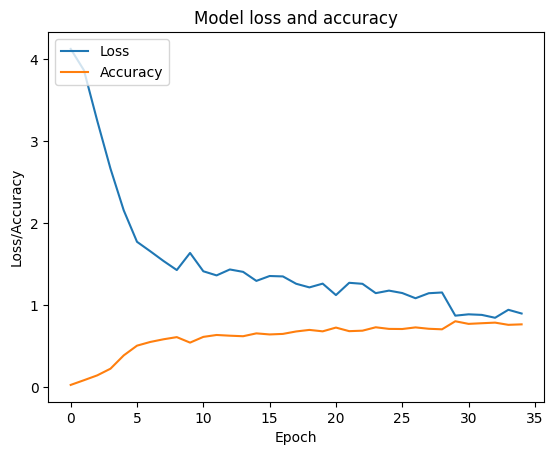

172/172 [==============================] - 7s 40ms/step


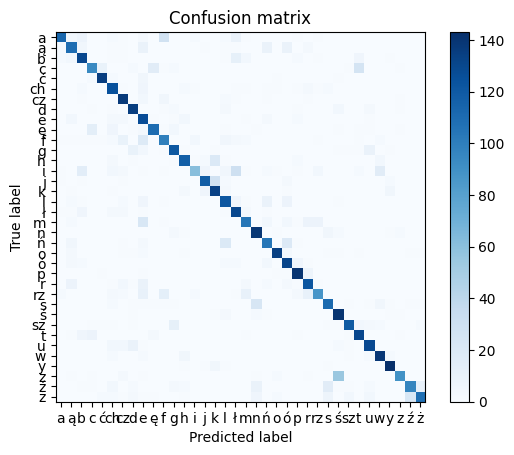

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_6 (Batc  (None, 75, 9)            36        
 hNormalization)                                                 
                                                                 
 conv1d_3 (Conv1D)           (None, 73, 64)            1792      
                                                                 
 batch_normalization_7 (Batc  (None, 73, 64)           256       
 hNormalization)                                                 
                                                                 
 gru_3 (GRU)                 (None, 73, 75)            31725     
                                                                 
 batch_normalization_8 (Batc  (None, 73, 75)           300       
 hNormalization)                                                 
                                                      

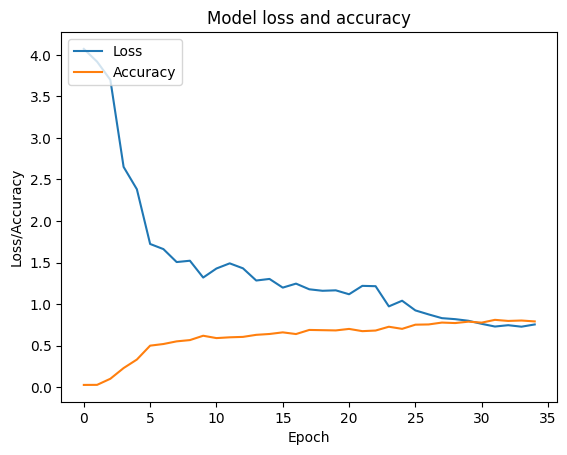

172/172 [==============================] - 6s 34ms/step


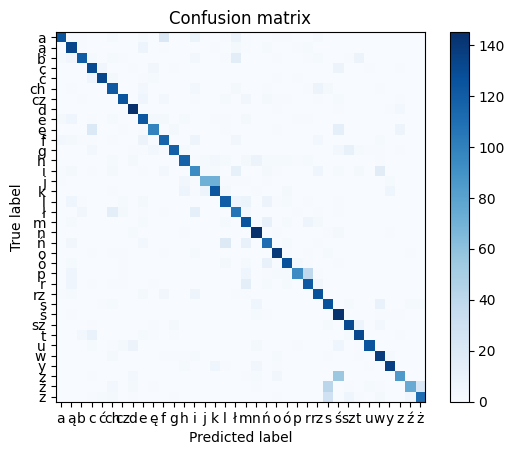

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_12 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_6 (Conv1D)           (None, 73, 64)            1792      
                                                                 
 batch_normalization_13 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_6 (GRU)                 (None, 73, 75)            31725     
                                                                 
 batch_normalization_14 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

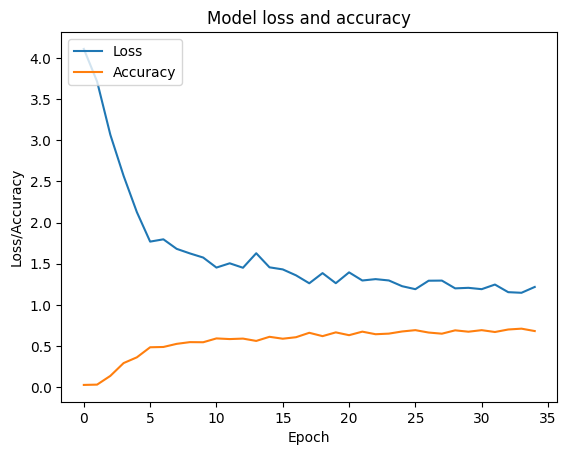

172/172 [==============================] - 6s 36ms/step


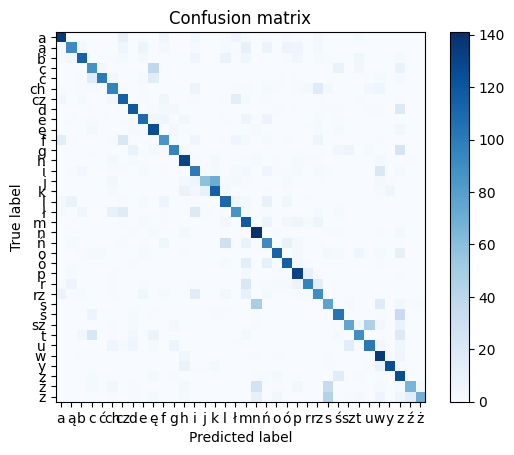

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_18 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_9 (Conv1D)           (None, 73, 64)            1792      
                                                                 
 batch_normalization_19 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_9 (GRU)                 (None, 73, 75)            31725     
                                                                 
 batch_normalization_20 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

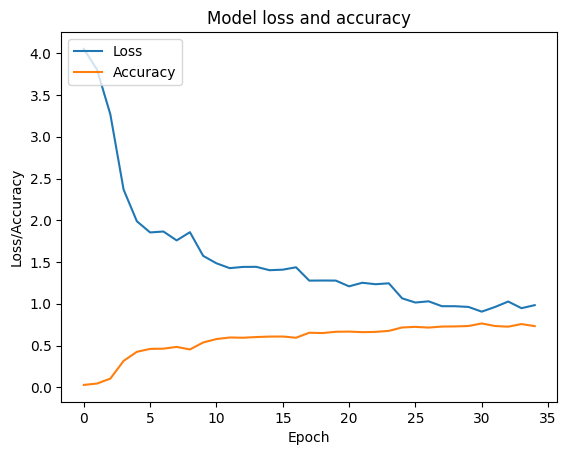

172/172 [==============================] - 6s 36ms/step


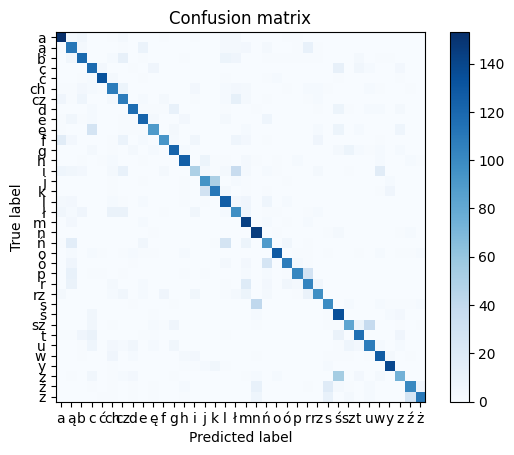

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_24 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_12 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_25 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_12 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_26 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

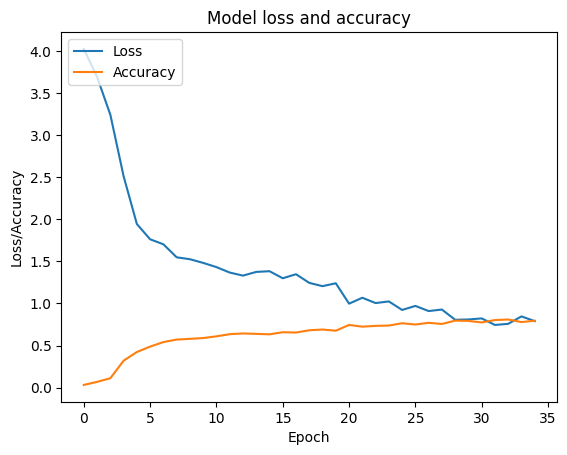

172/172 [==============================] - 6s 35ms/step


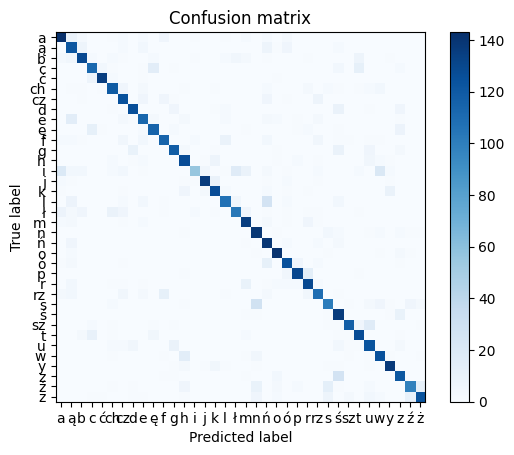

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_30 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_15 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_31 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_15 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_32 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

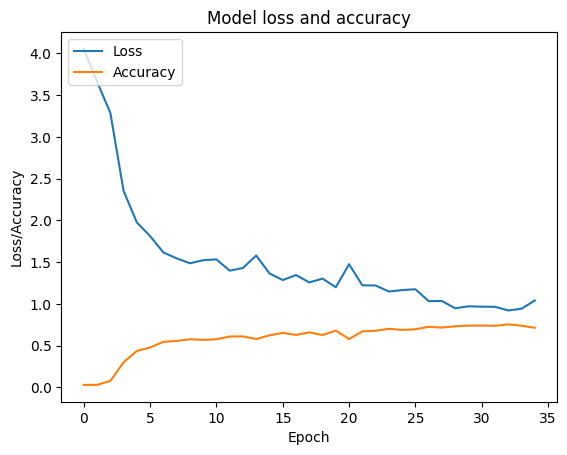

172/172 [==============================] - 7s 40ms/step


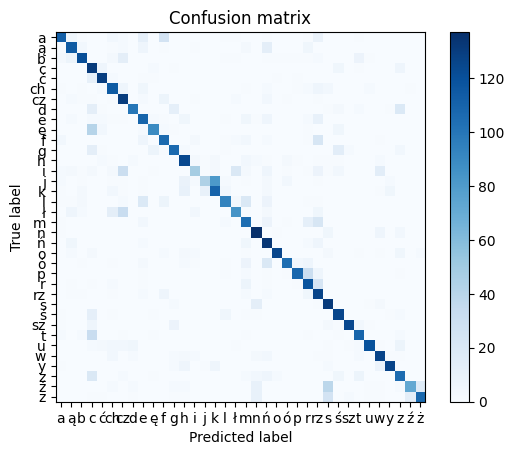

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_36 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_18 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_37 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_18 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_38 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

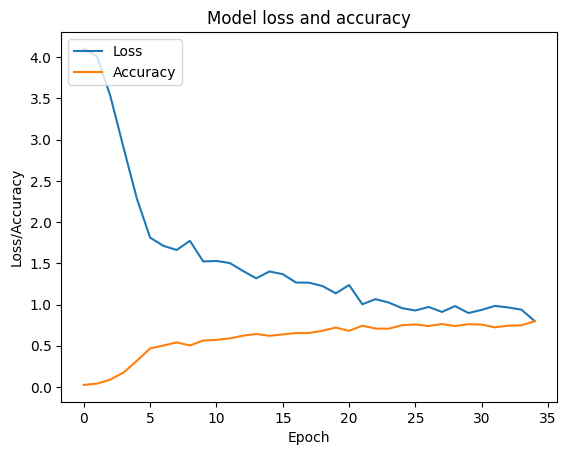

172/172 [==============================] - 6s 36ms/step


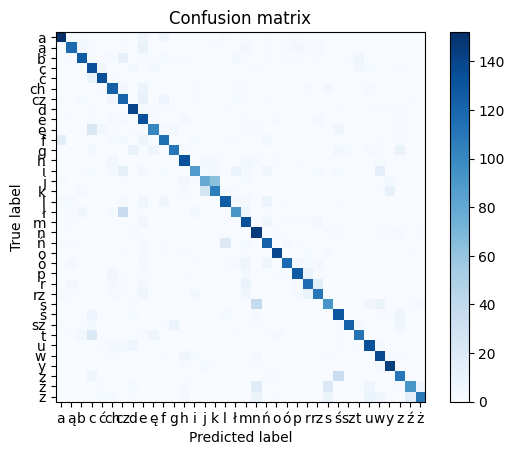

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_42 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_21 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_43 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_21 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_44 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

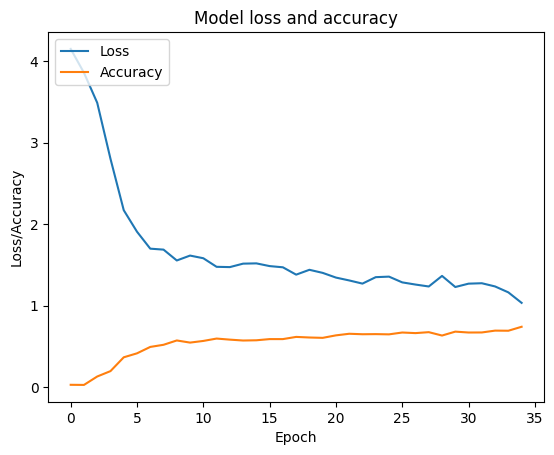

172/172 [==============================] - 6s 36ms/step


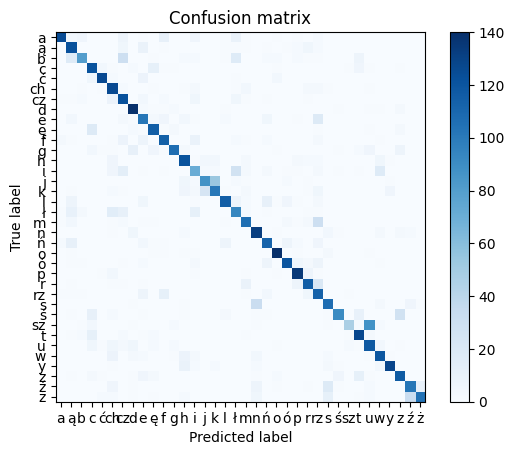

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_48 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_24 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_49 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_24 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_50 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

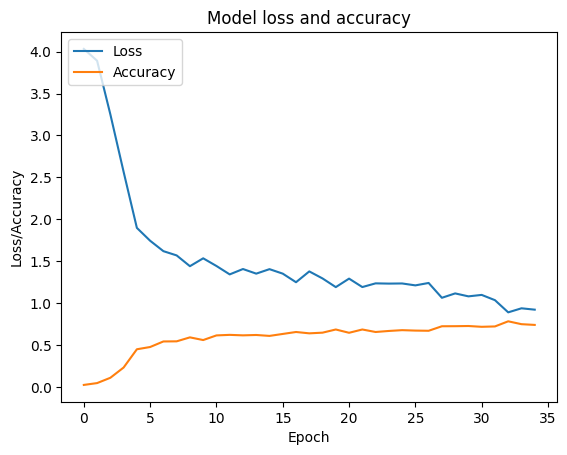

172/172 [==============================] - 94s 547ms/step


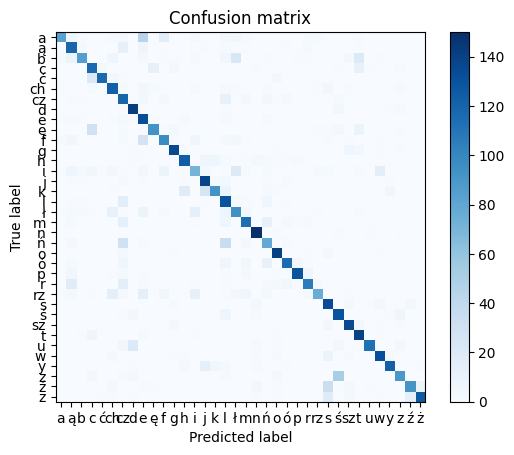

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_54 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_27 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_55 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_27 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_56 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                      

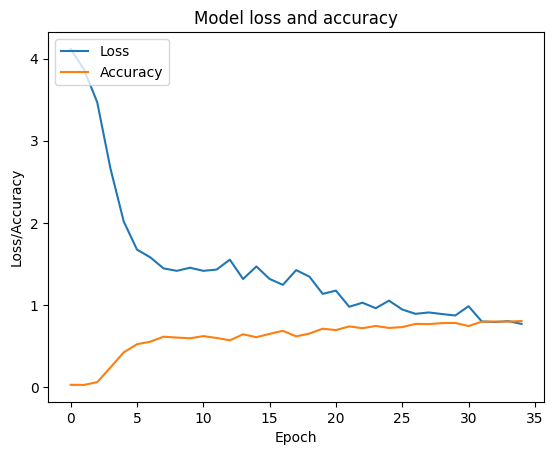

172/172 [==============================] - 6s 36ms/step


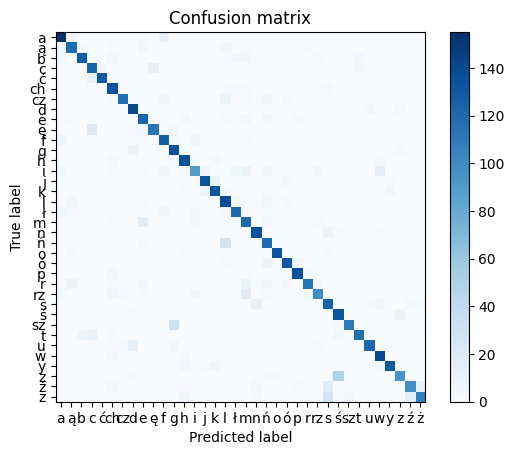

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_60 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_30 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_61 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_30 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_62 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

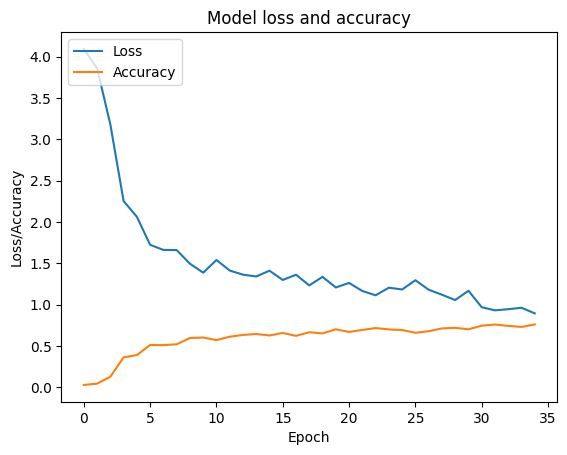

172/172 [==============================] - 6s 35ms/step


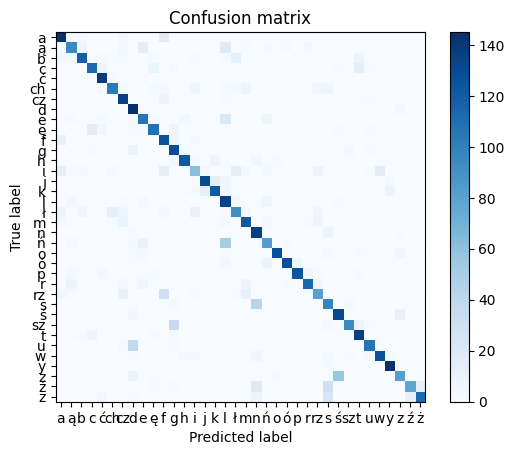

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_66 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_33 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_67 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_33 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_68 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

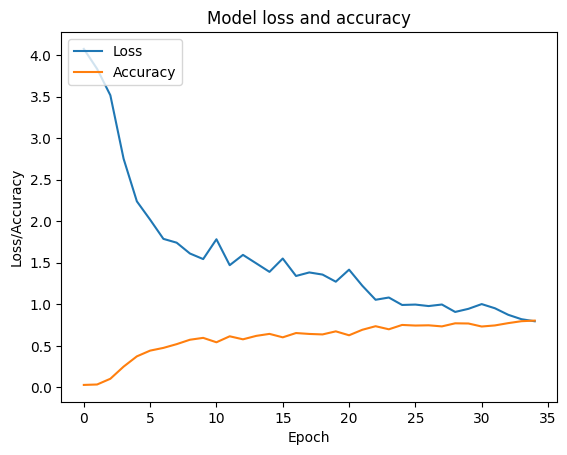

172/172 [==============================] - 6s 34ms/step


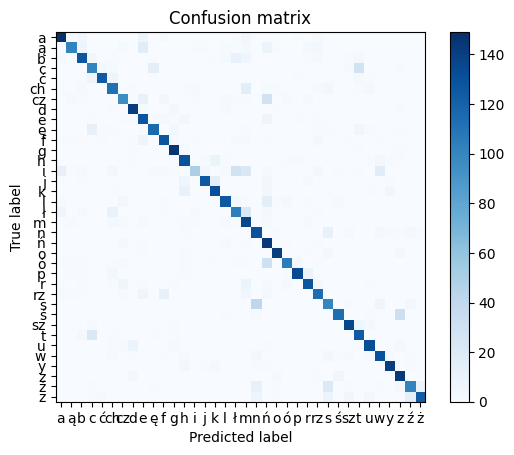

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_72 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_36 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_73 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_36 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_74 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

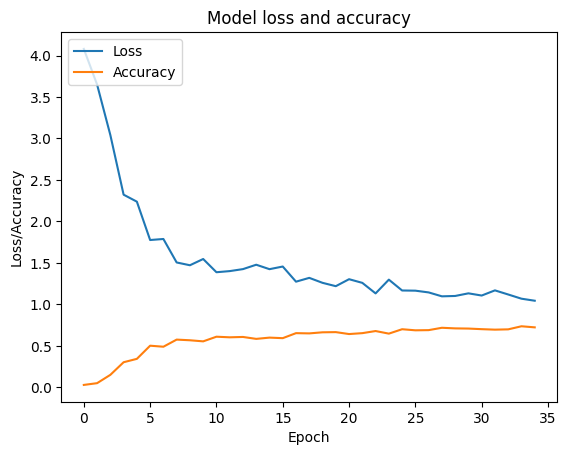

172/172 [==============================] - 7s 38ms/step


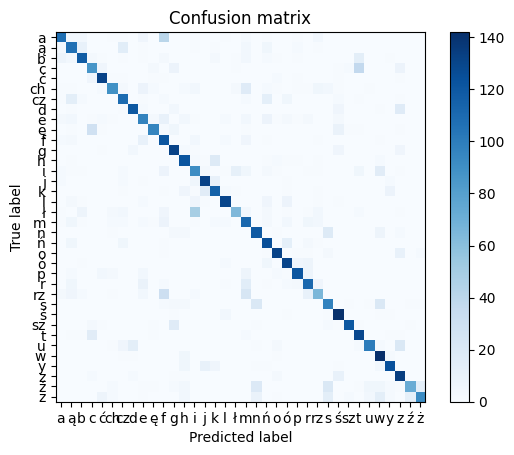

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_78 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_39 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_79 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_39 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_80 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

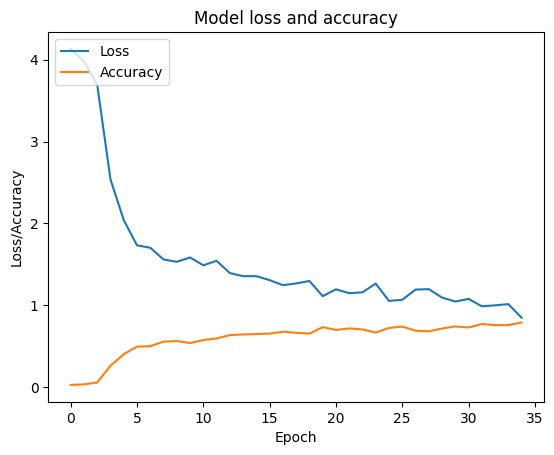

172/172 [==============================] - 7s 40ms/step


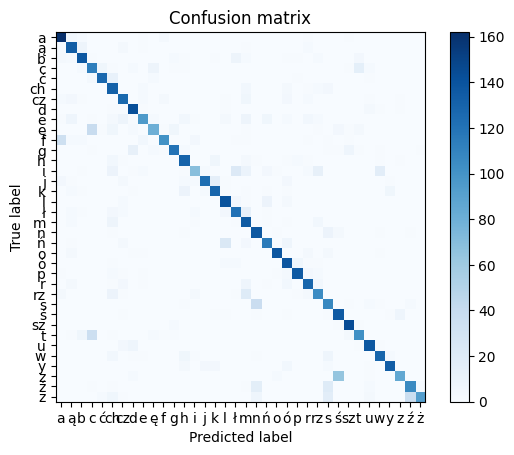

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_84 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_42 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_85 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_42 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_86 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

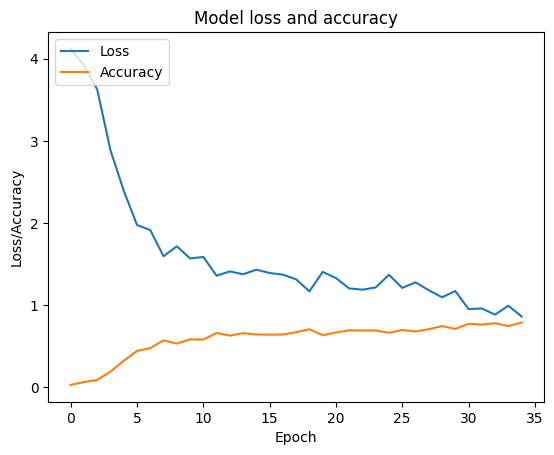

172/172 [==============================] - 6s 36ms/step


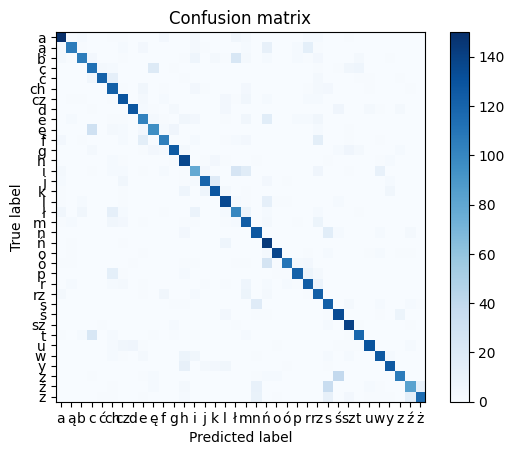

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_90 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_45 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_91 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_45 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_92 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

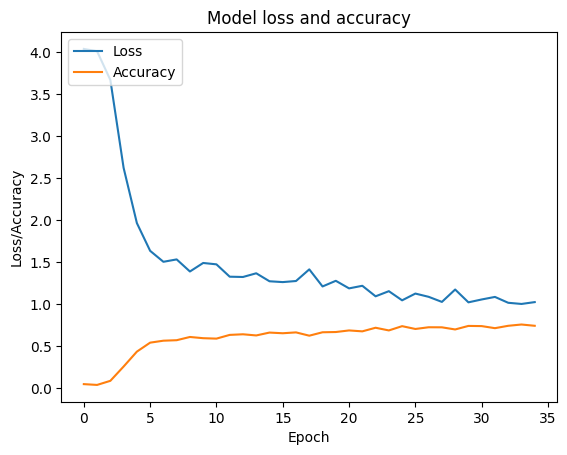

172/172 [==============================] - 6s 35ms/step


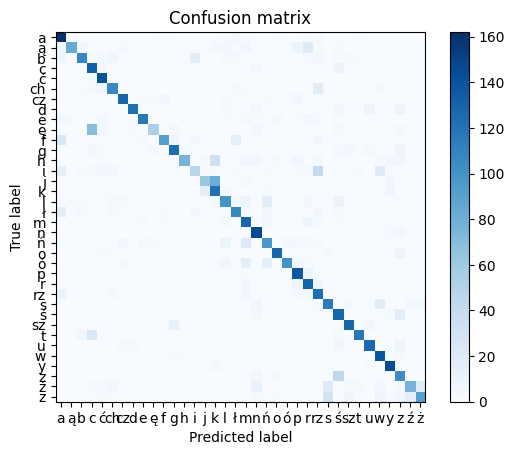

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_96 (Bat  (None, 75, 9)            36        
 chNormalization)                                                
                                                                 
 conv1d_48 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_97 (Bat  (None, 73, 64)           256       
 chNormalization)                                                
                                                                 
 gru_48 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_98 (Bat  (None, 73, 75)           300       
 chNormalization)                                                
                                                     

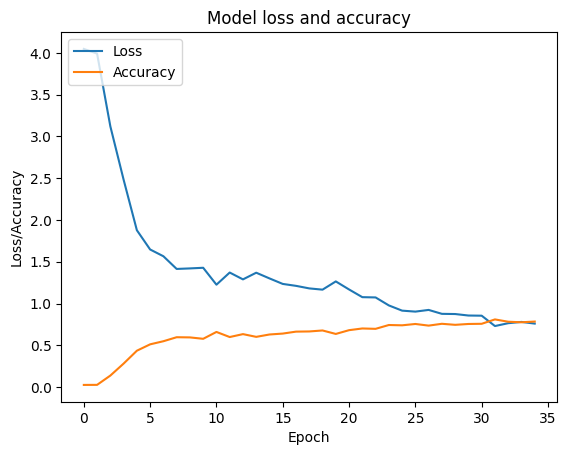

172/172 [==============================] - 6s 36ms/step


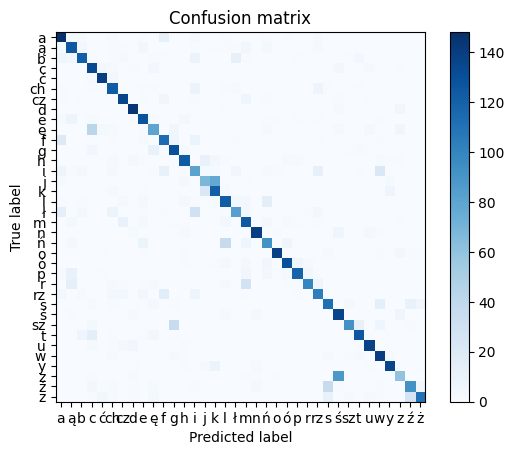

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_102 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_51 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_103 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_51 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_104 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

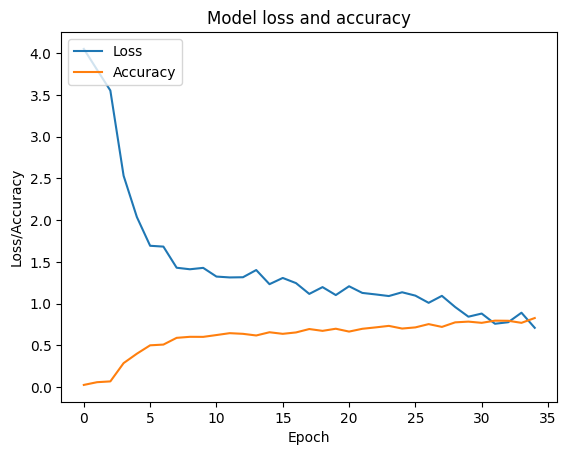

172/172 [==============================] - 6s 35ms/step


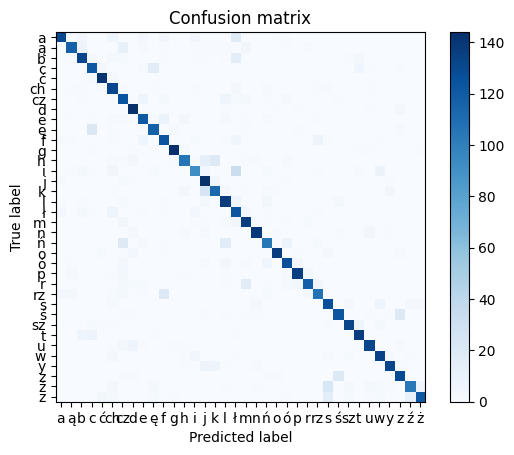

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_108 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_54 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_109 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_54 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_110 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

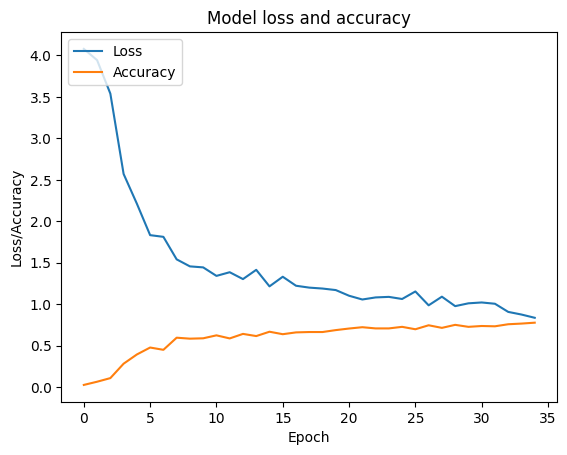

172/172 [==============================] - 7s 39ms/step


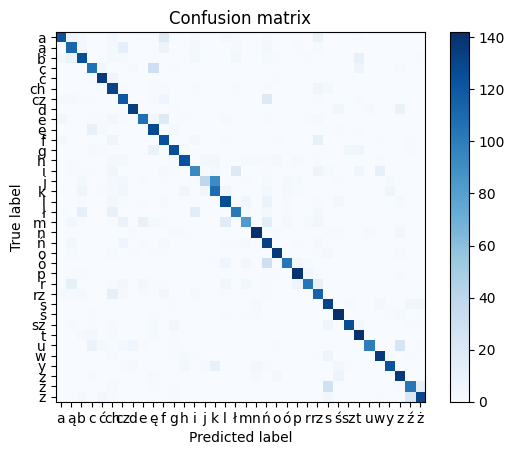

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_114 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_57 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_115 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_57 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_116 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

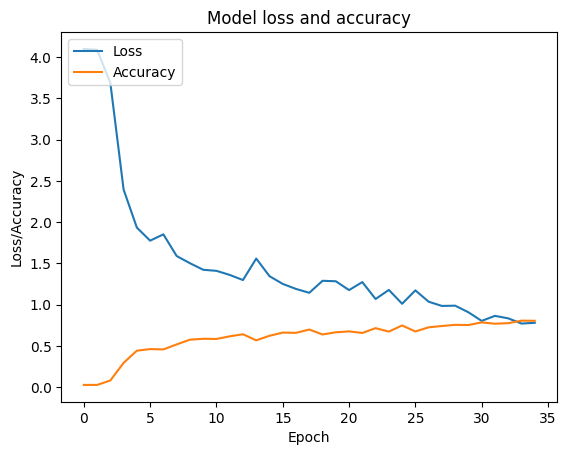

172/172 [==============================] - 6s 35ms/step


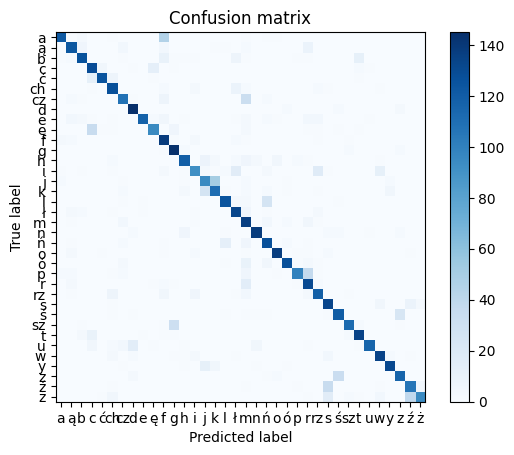

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_120 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_60 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_121 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_60 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_122 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

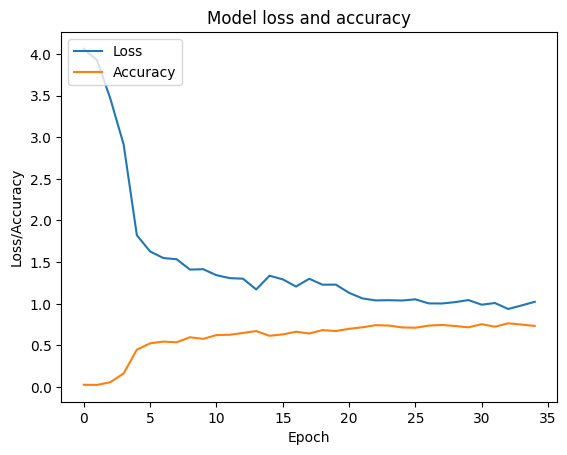

172/172 [==============================] - 6s 35ms/step


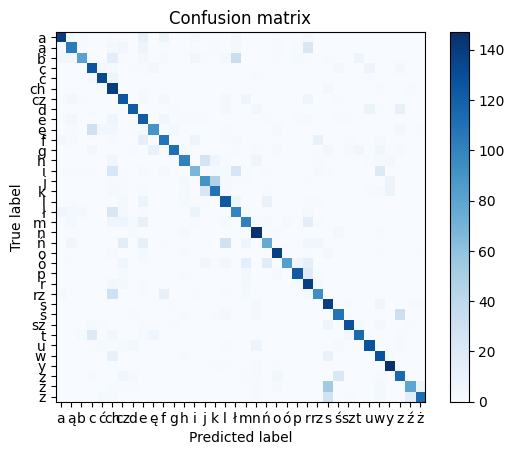

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_126 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_63 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_127 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_63 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_128 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

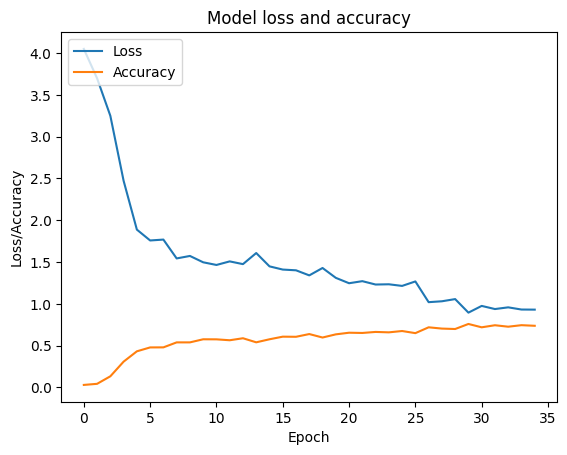

172/172 [==============================] - 6s 36ms/step


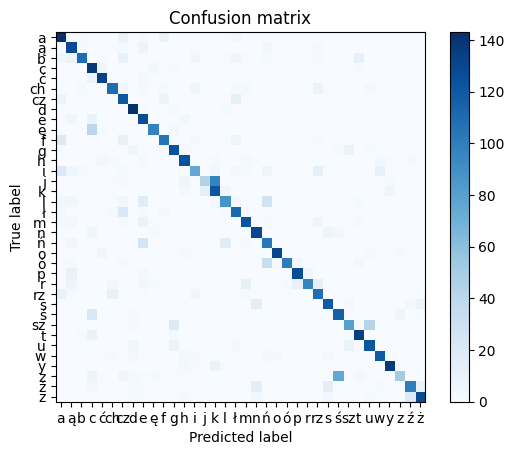

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_132 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_66 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_133 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_66 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_134 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

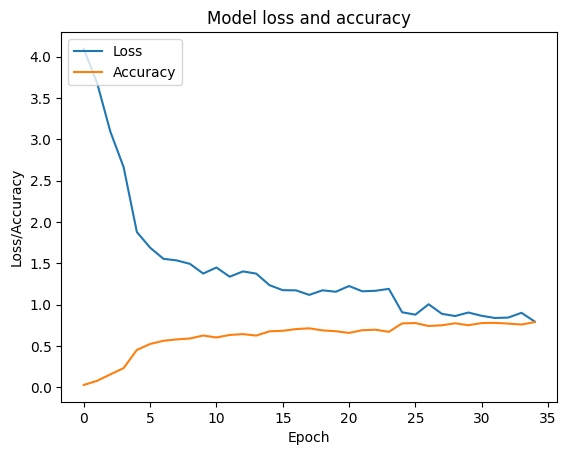

172/172 [==============================] - 6s 35ms/step


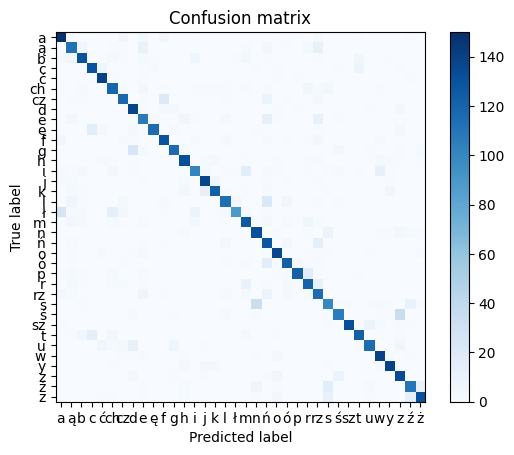

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_138 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_69 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_139 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_69 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_140 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

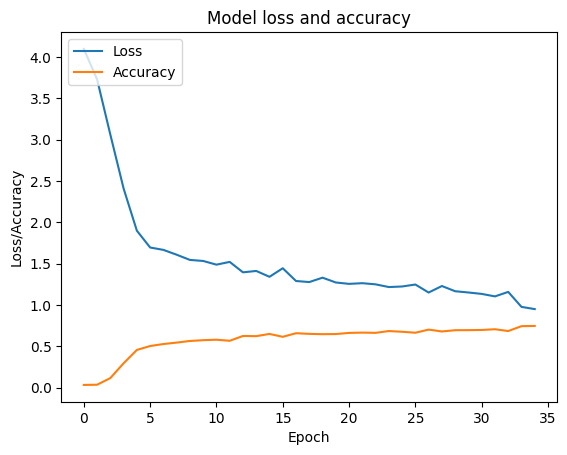

172/172 [==============================] - 7s 38ms/step


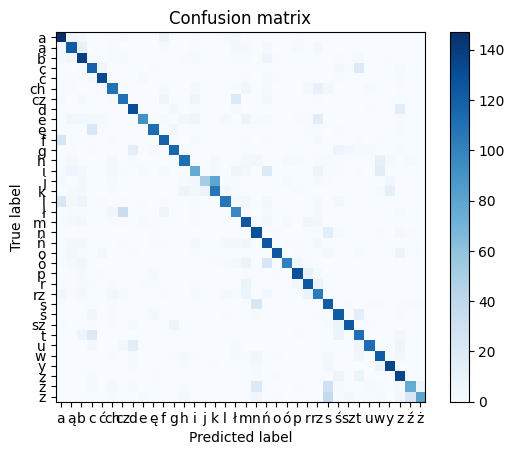

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_144 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_72 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_145 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_72 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_146 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

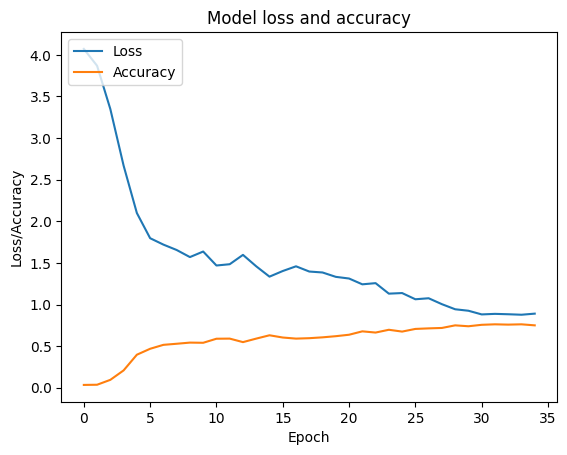

172/172 [==============================] - 7s 37ms/step


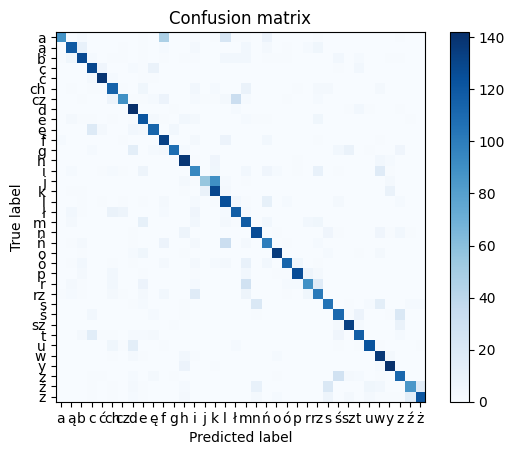

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_150 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_75 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_151 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_75 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_152 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

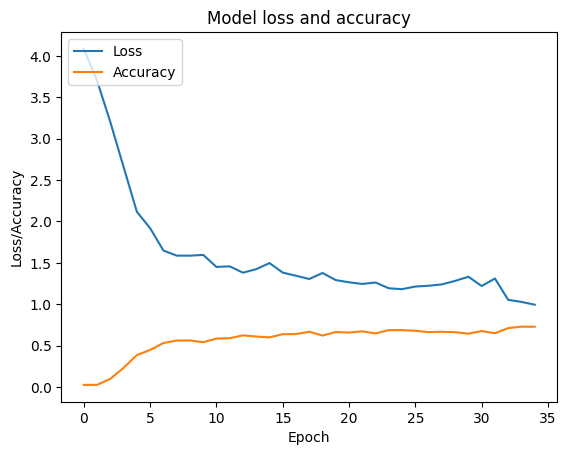

172/172 [==============================] - 6s 36ms/step


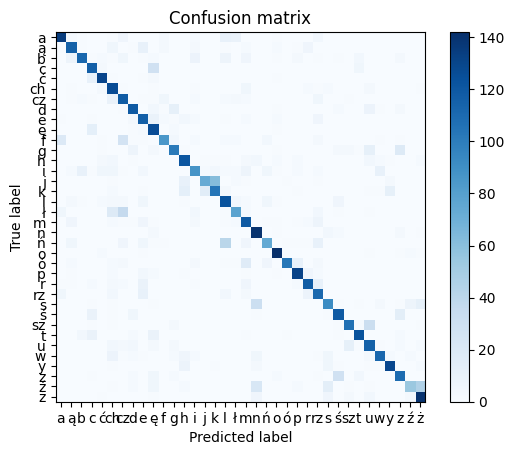

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_156 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_78 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_157 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_78 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_158 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

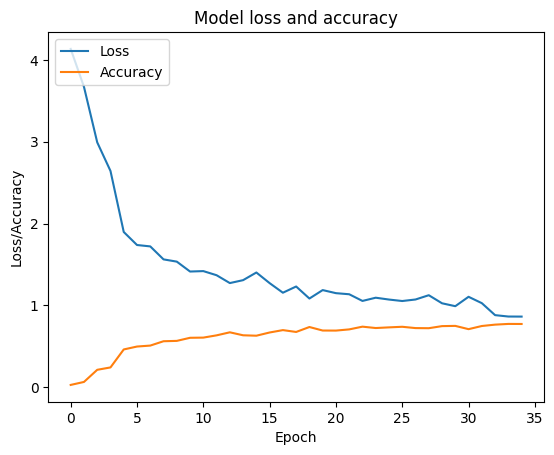

172/172 [==============================] - 7s 38ms/step


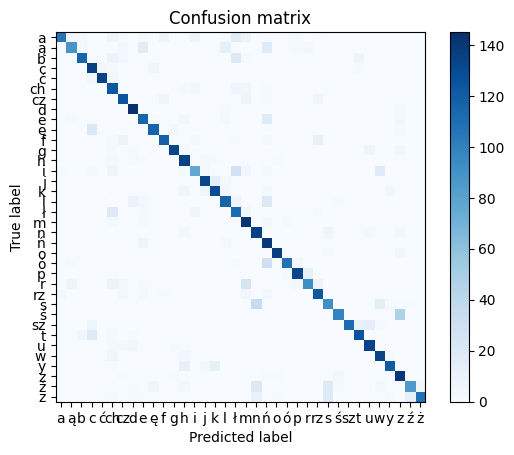

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_162 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_81 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_163 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_81 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_164 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

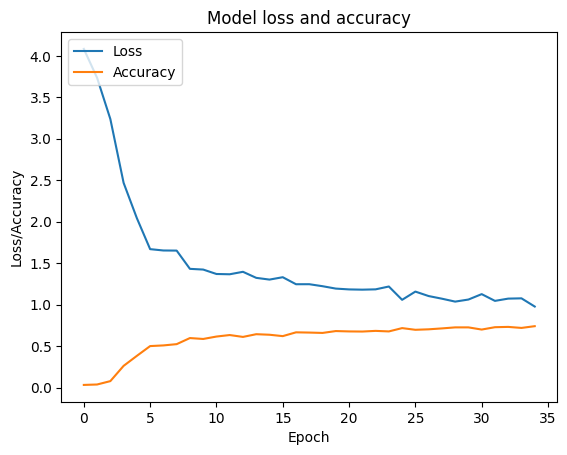

172/172 [==============================] - 7s 37ms/step


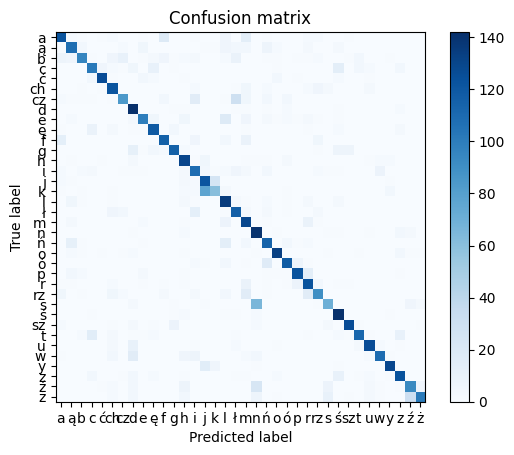

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_168 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_84 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_169 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_84 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_170 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

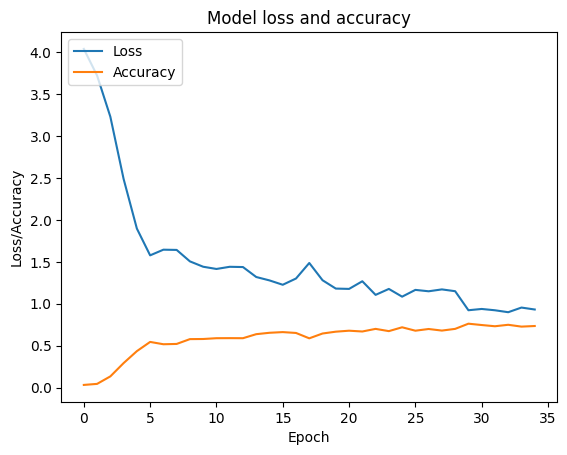

172/172 [==============================] - 6s 36ms/step


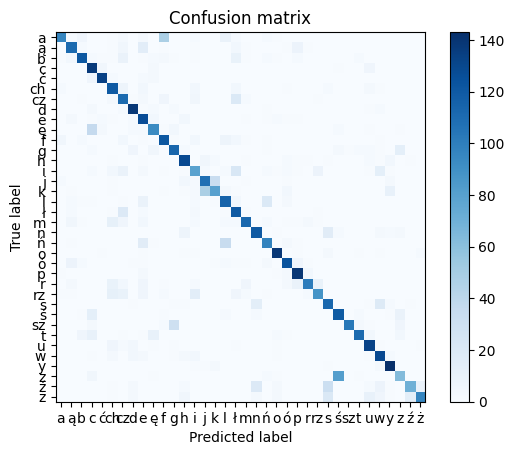

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_174 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_87 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_175 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_87 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_176 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

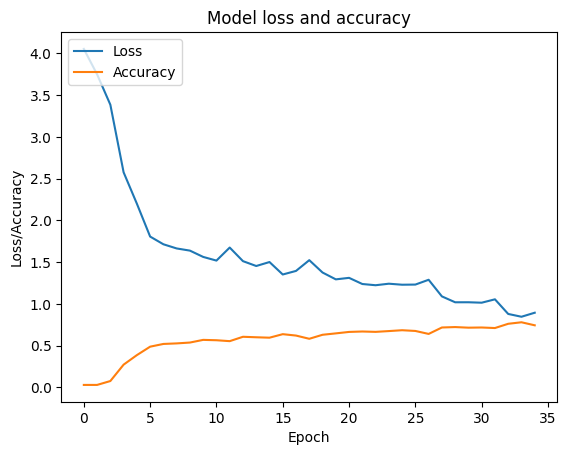

172/172 [==============================] - 7s 39ms/step


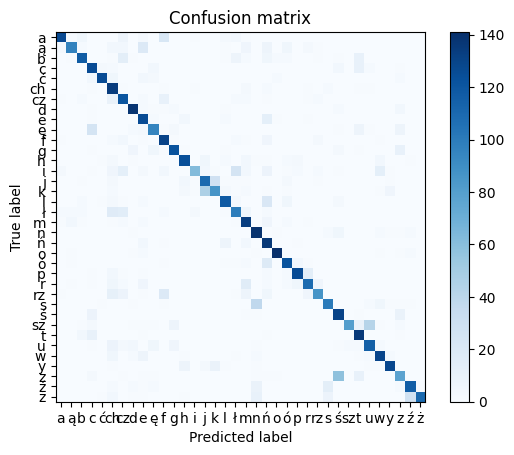

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_180 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_90 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_181 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_90 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_182 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

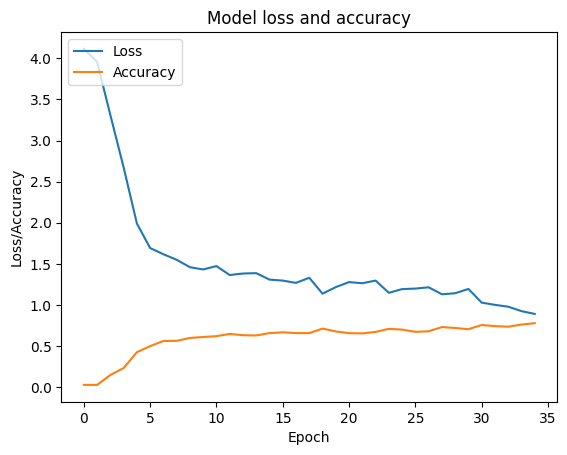

172/172 [==============================] - 6s 36ms/step


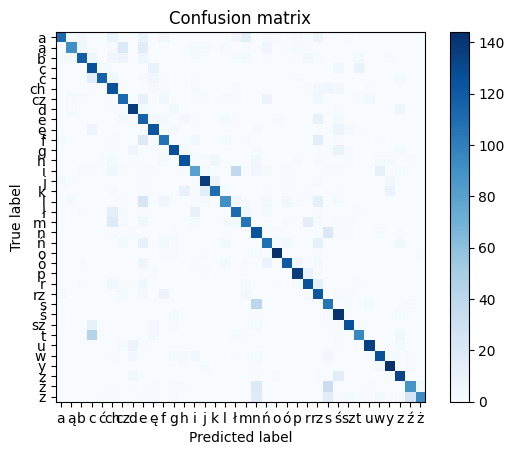

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_186 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_93 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_187 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_93 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_188 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

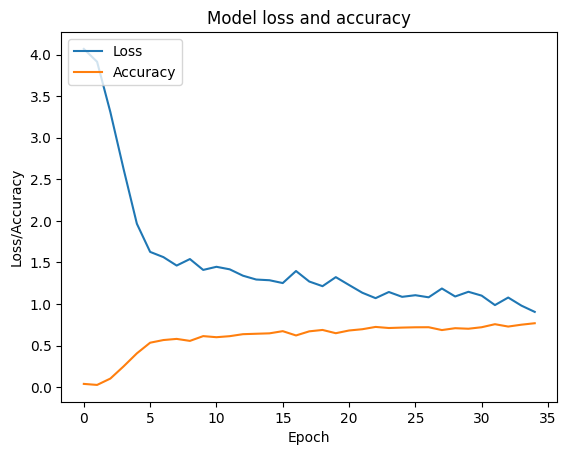

172/172 [==============================] - 6s 33ms/step


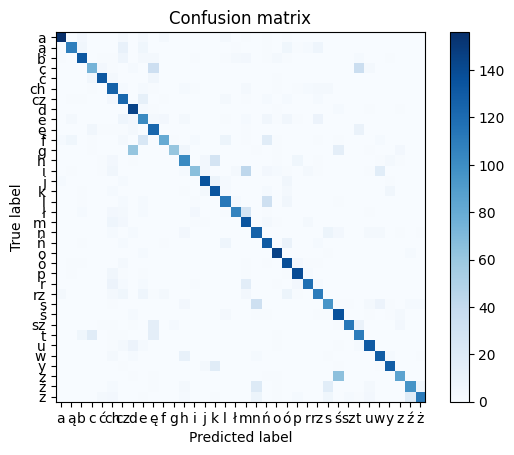

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_192 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_96 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_193 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_96 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_194 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

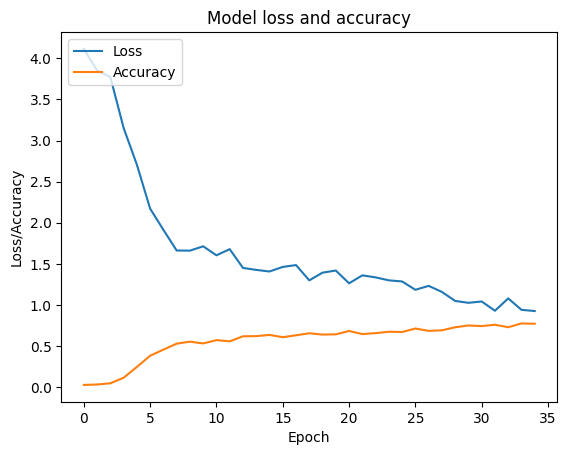

172/172 [==============================] - 7s 38ms/step


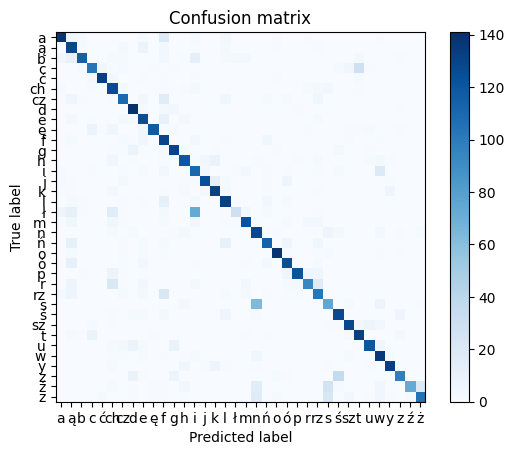

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_198 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_99 (Conv1D)          (None, 73, 64)            1792      
                                                                 
 batch_normalization_199 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_99 (GRU)                (None, 73, 75)            31725     
                                                                 
 batch_normalization_200 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

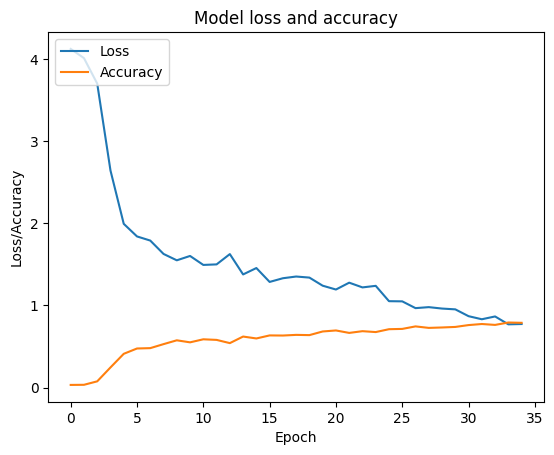

172/172 [==============================] - 7s 40ms/step


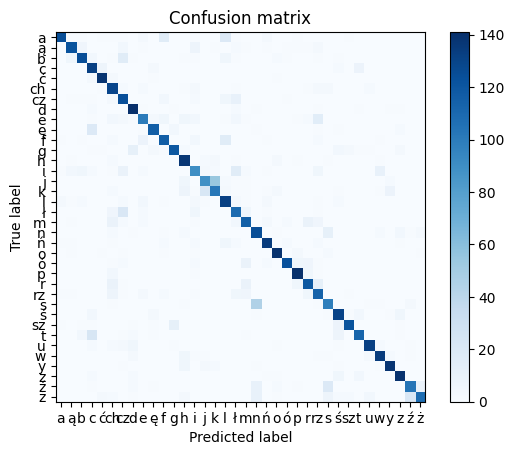

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_204 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_102 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_205 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_102 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_206 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

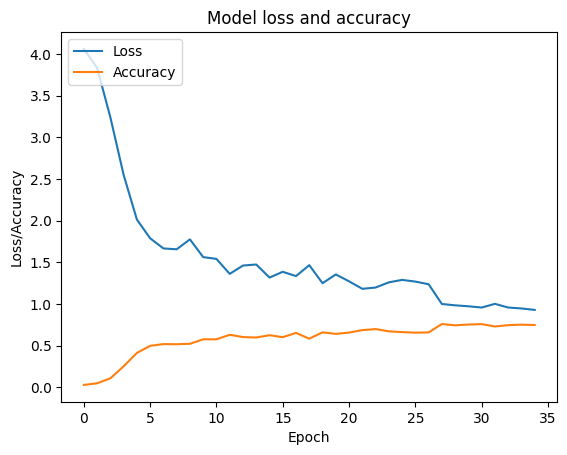

172/172 [==============================] - 7s 39ms/step


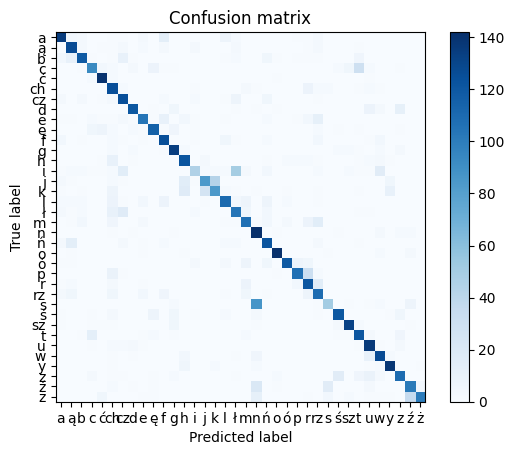

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_210 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_105 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_211 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_105 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_212 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

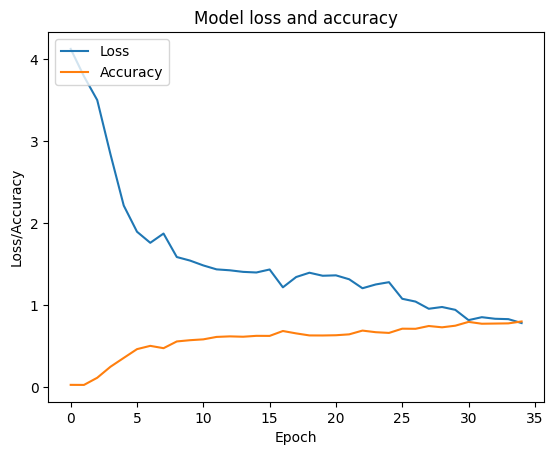

172/172 [==============================] - 7s 37ms/step


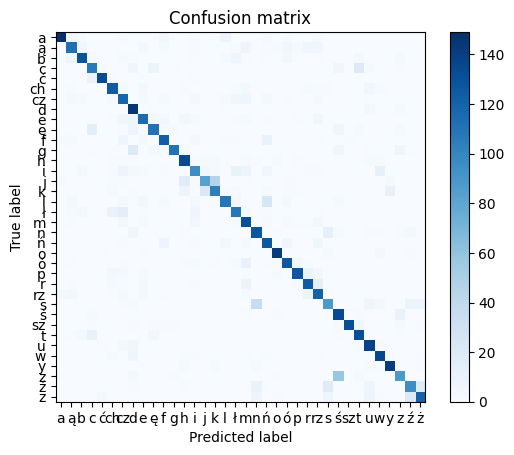

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_216 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_108 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_217 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_108 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_218 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

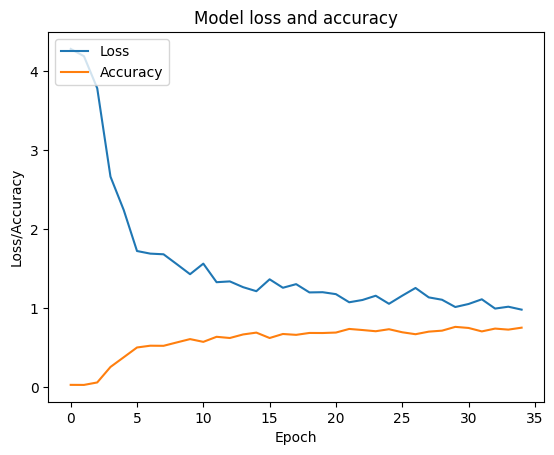

172/172 [==============================] - 7s 38ms/step


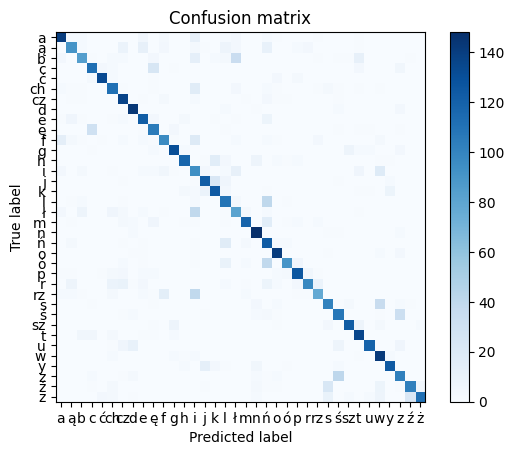

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_222 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_111 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_223 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_111 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_224 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

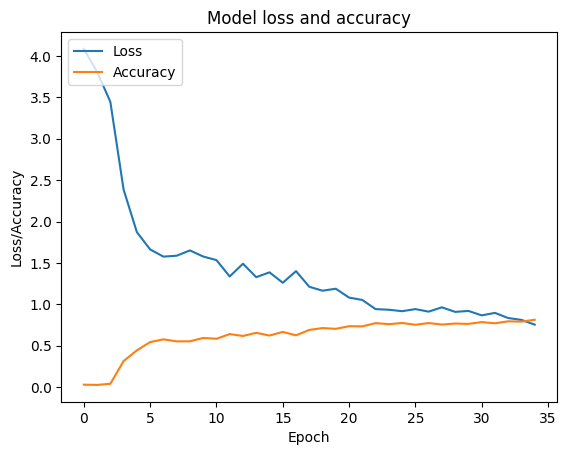

172/172 [==============================] - 6s 35ms/step


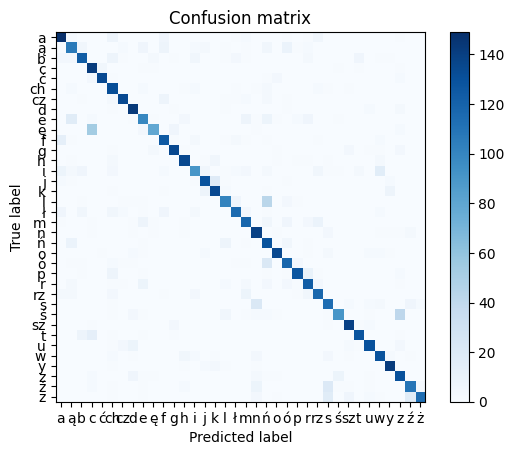

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_228 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_114 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_229 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_114 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_230 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

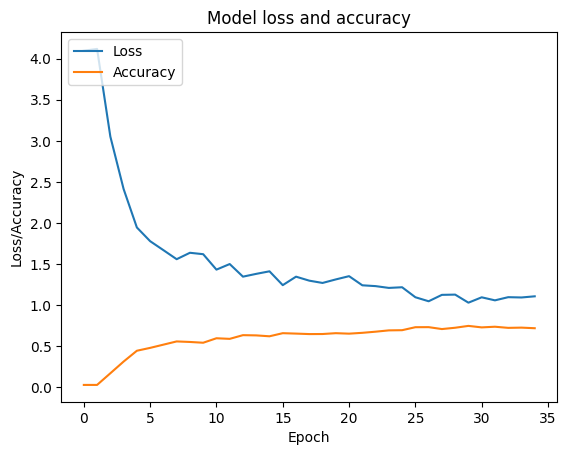

172/172 [==============================] - 7s 37ms/step


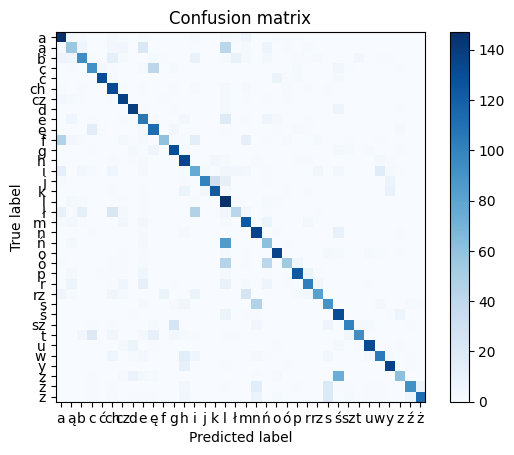

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_234 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_117 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_235 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_117 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_236 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

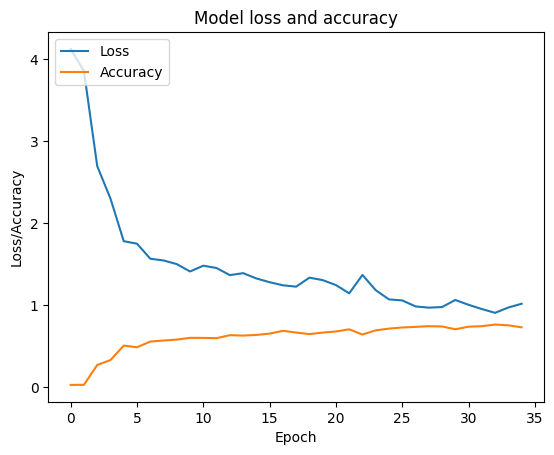

172/172 [==============================] - 7s 37ms/step


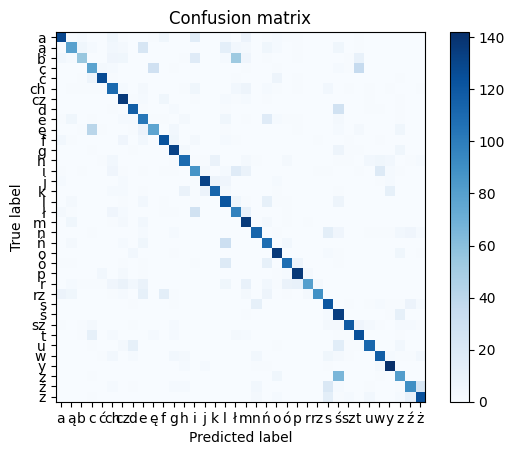

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_240 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_120 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_241 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_120 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_242 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

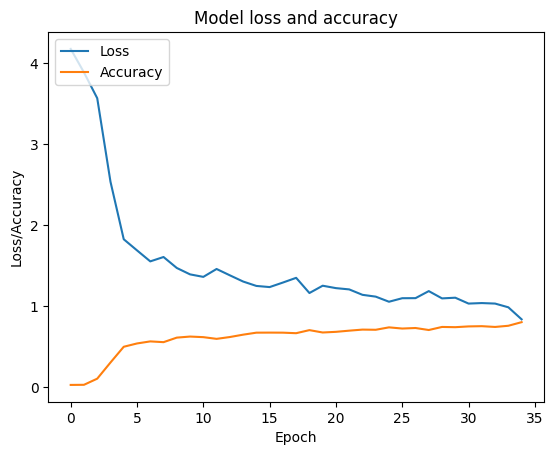

172/172 [==============================] - 7s 39ms/step


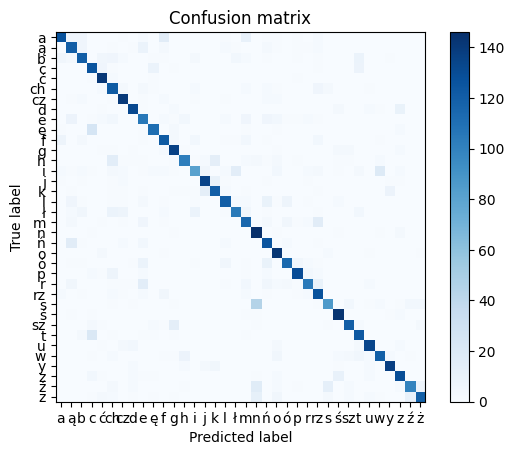

Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_246 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_123 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_247 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_123 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_248 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

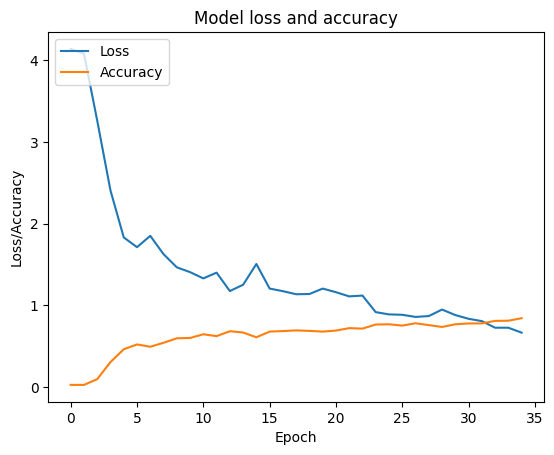

172/172 [==============================] - 7s 36ms/step


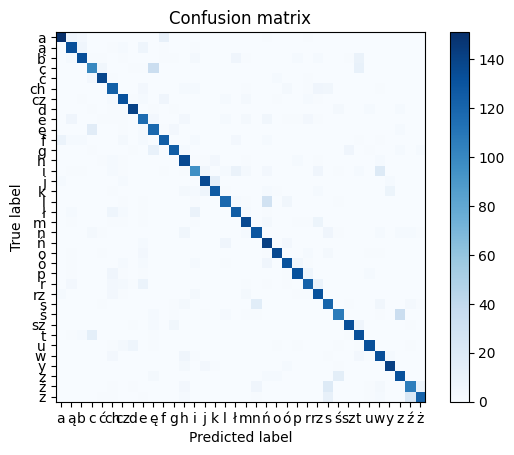

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_252 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_126 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_253 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_126 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_254 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

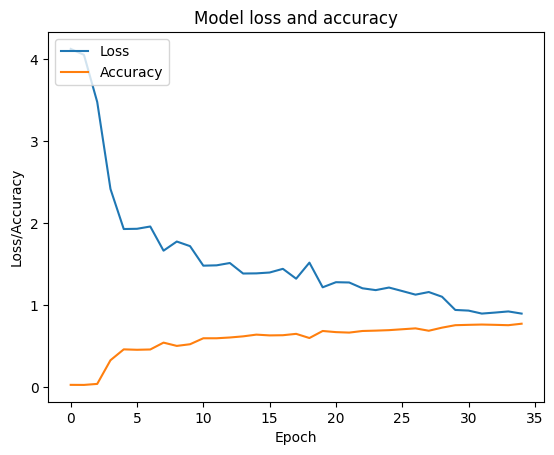

172/172 [==============================] - 6s 35ms/step


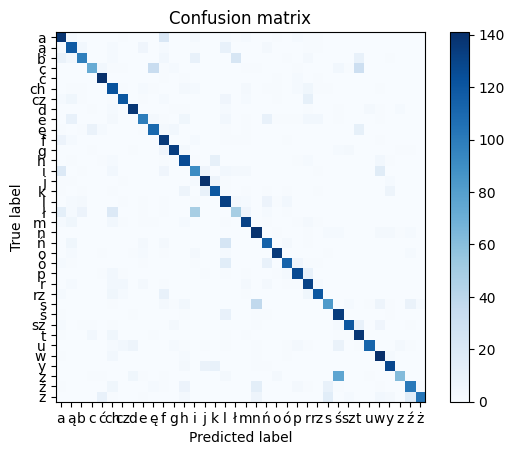

Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_258 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_129 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_259 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_129 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_260 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

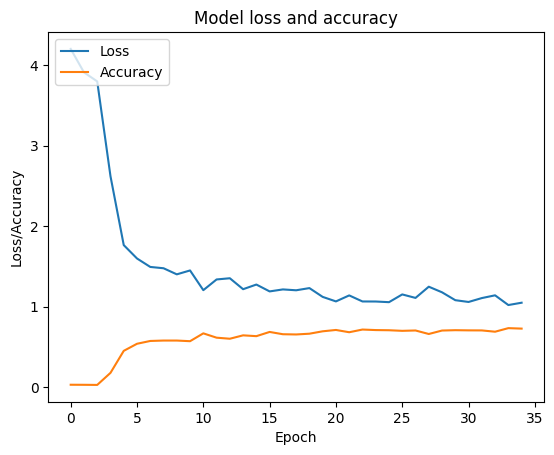

172/172 [==============================] - 7s 37ms/step


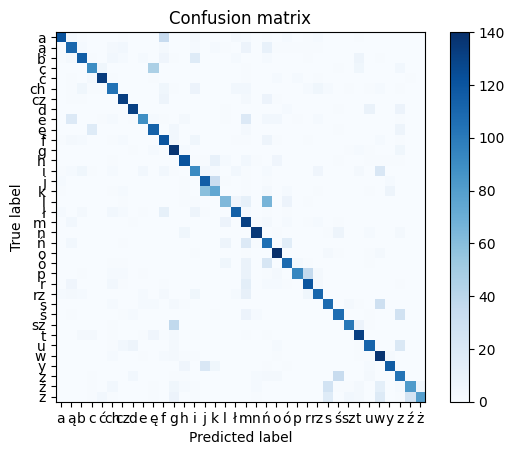

Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_264 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_132 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_265 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_132 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_266 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

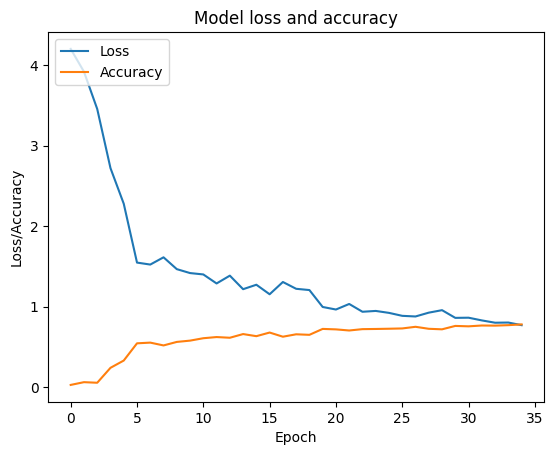

172/172 [==============================] - 7s 37ms/step


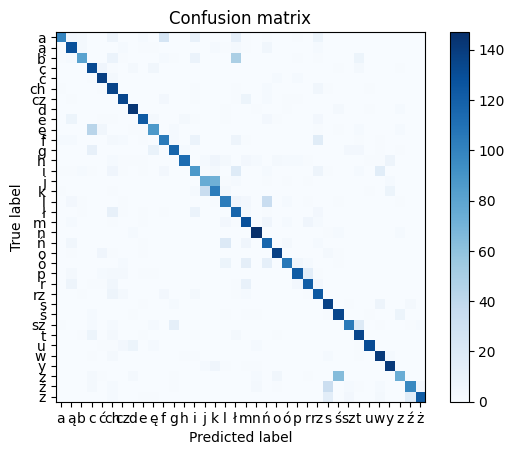

Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_270 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_135 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_271 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_135 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_272 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

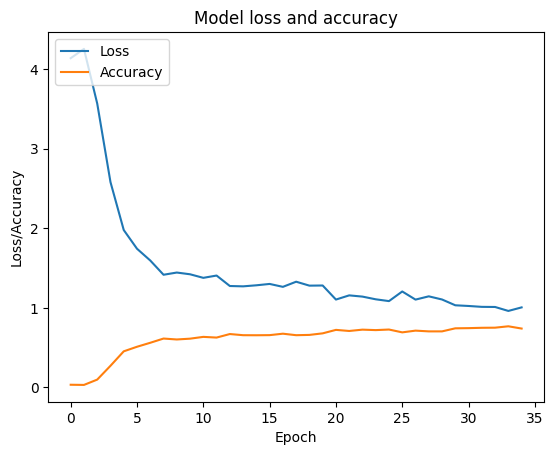

172/172 [==============================] - 7s 39ms/step


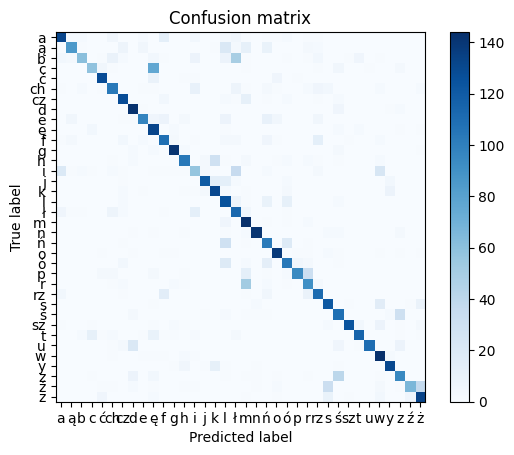

Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_276 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_138 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_277 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_138 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_278 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

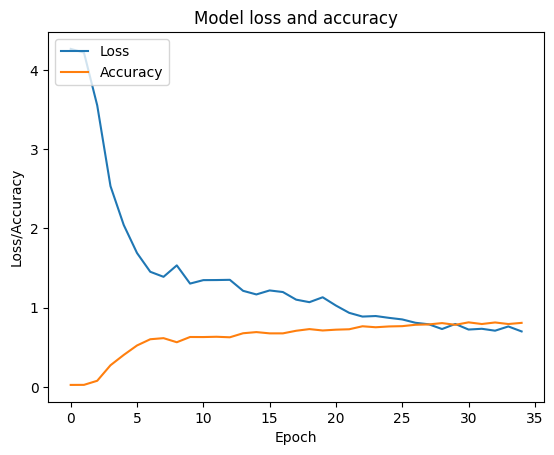

172/172 [==============================] - 7s 39ms/step


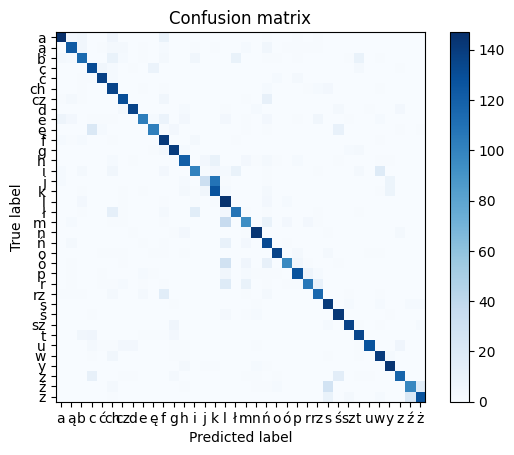

Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_282 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_141 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_283 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_141 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_284 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

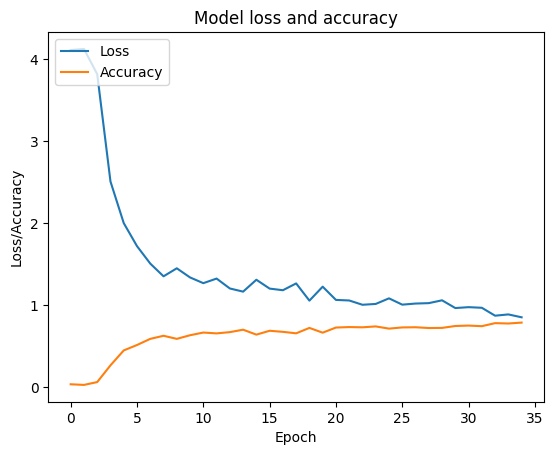

172/172 [==============================] - 7s 39ms/step


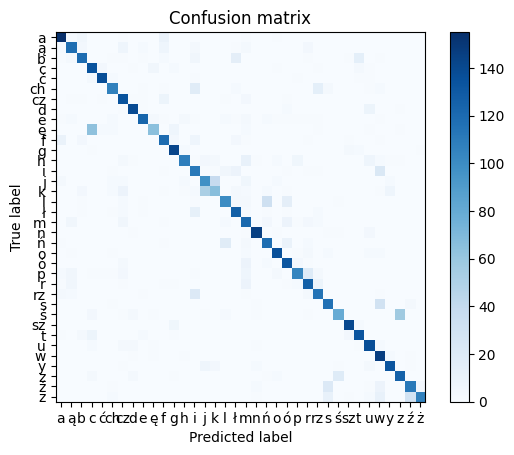

Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_288 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_144 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_289 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_144 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_290 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

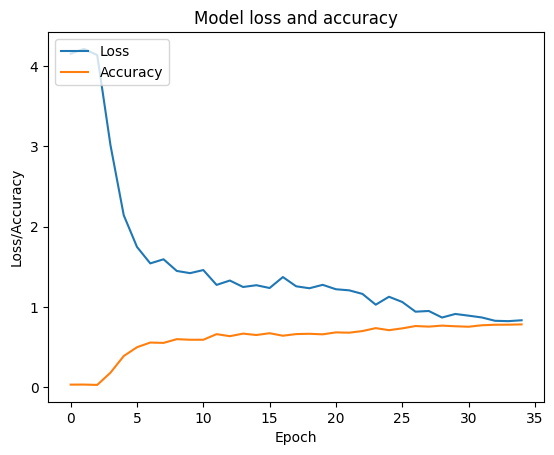

172/172 [==============================] - 7s 37ms/step


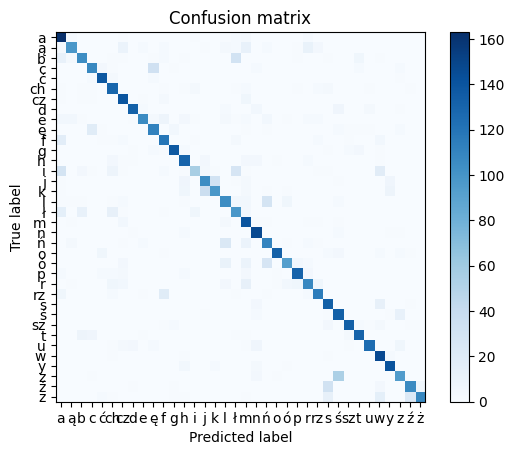

Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_294 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_147 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_295 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_147 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_296 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

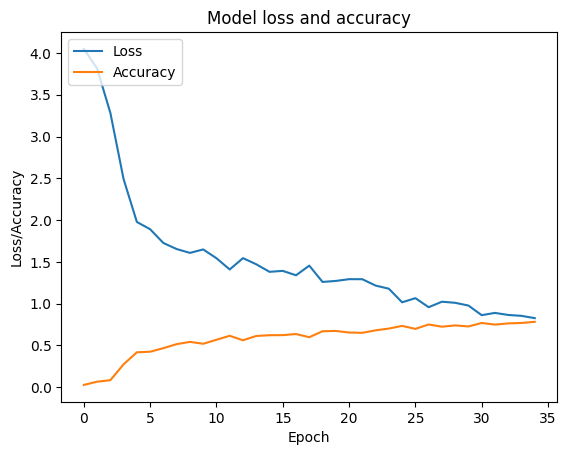

172/172 [==============================] - 7s 38ms/step


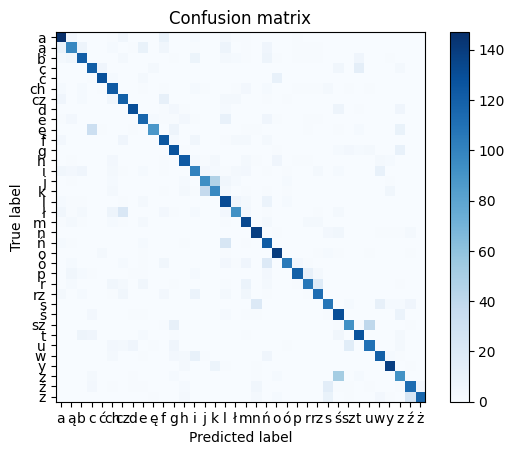

Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_300 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_150 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_301 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_150 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_302 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

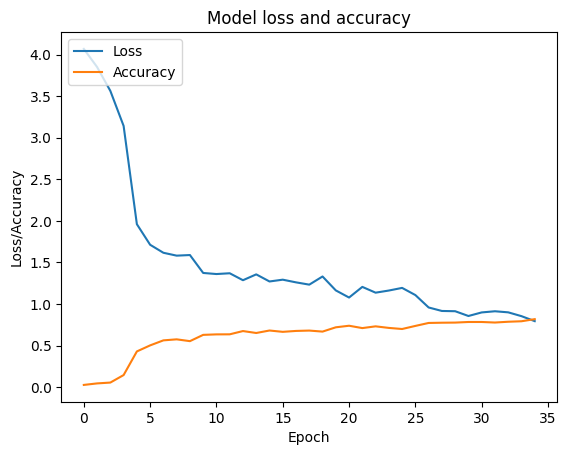

172/172 [==============================] - 7s 38ms/step


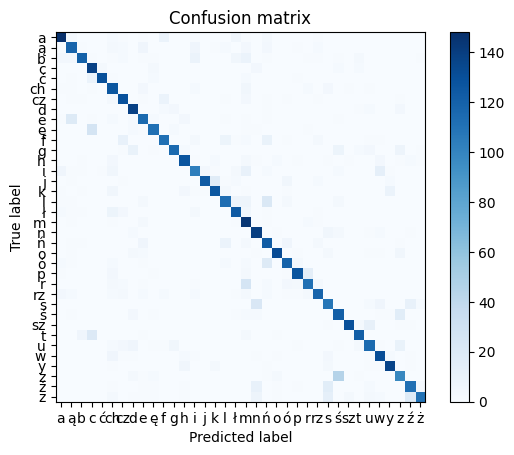

Model: "sequential_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_306 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_153 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_307 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_153 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_308 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

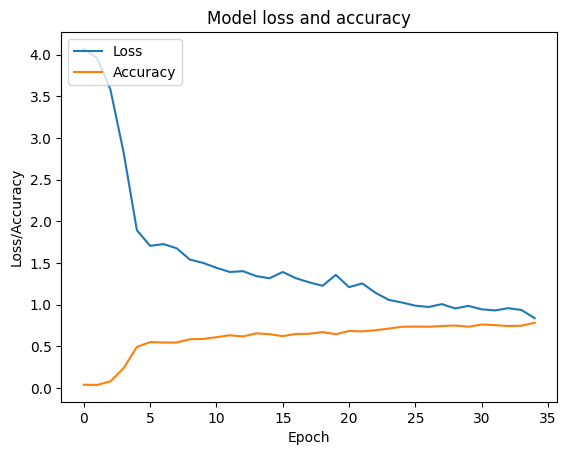

172/172 [==============================] - 7s 38ms/step


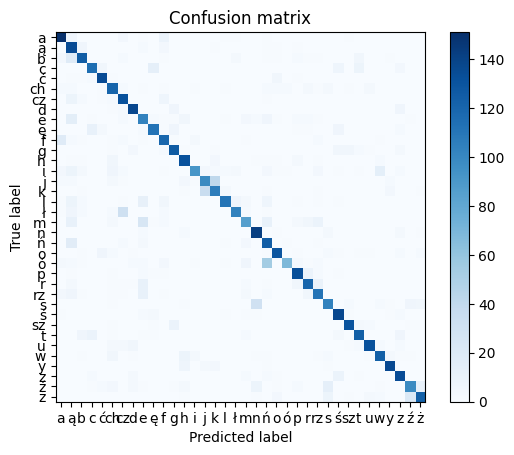

Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_312 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_156 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_313 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_156 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_314 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

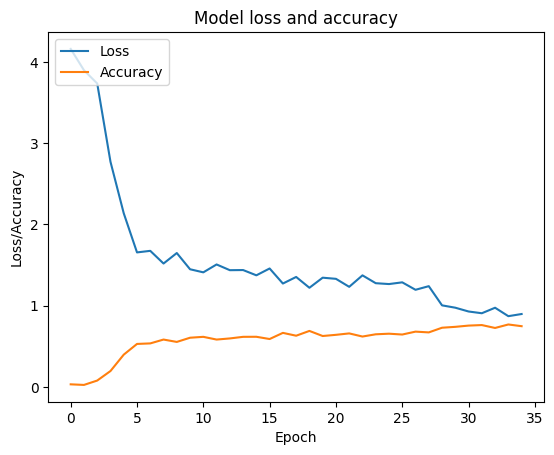

172/172 [==============================] - 6s 36ms/step


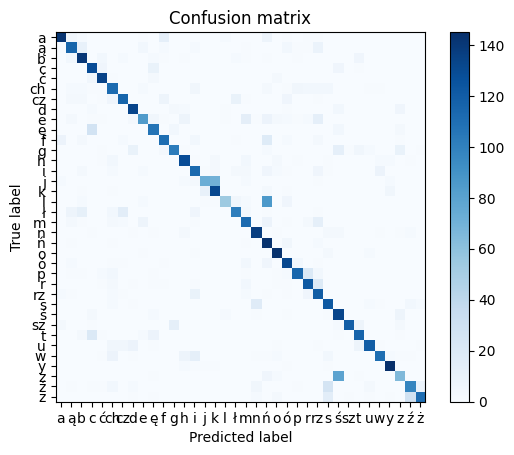

Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_318 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_159 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_319 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_159 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_320 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

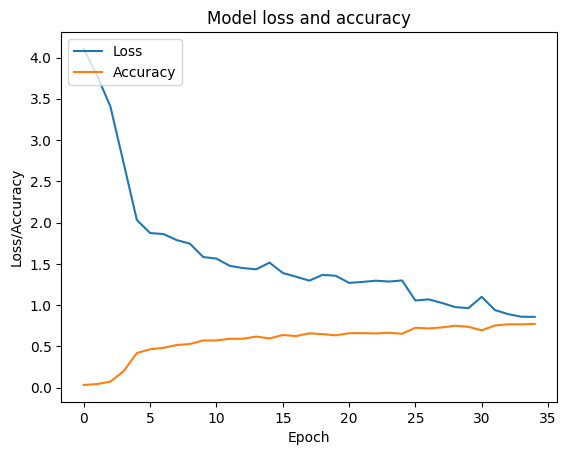

172/172 [==============================] - 7s 38ms/step


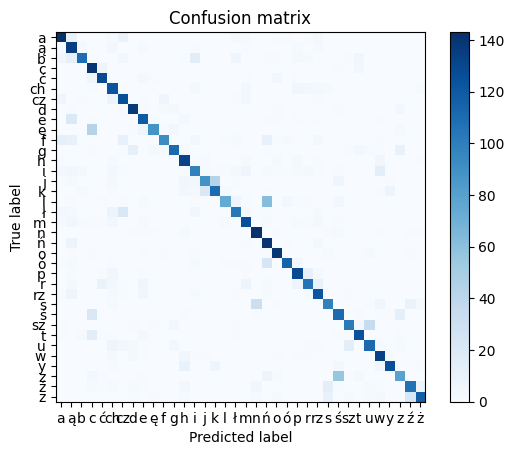

Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_324 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_162 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_325 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_162 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_326 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

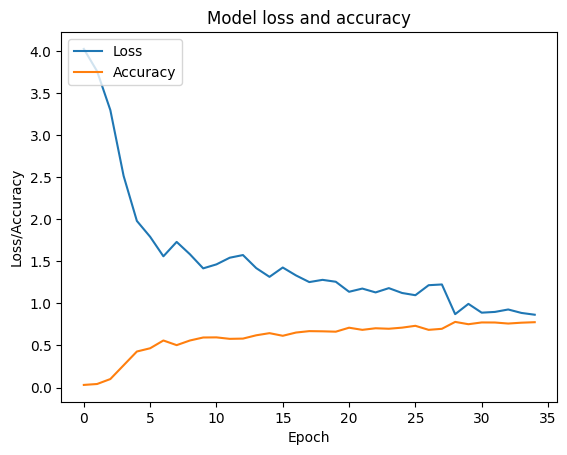

172/172 [==============================] - 7s 37ms/step


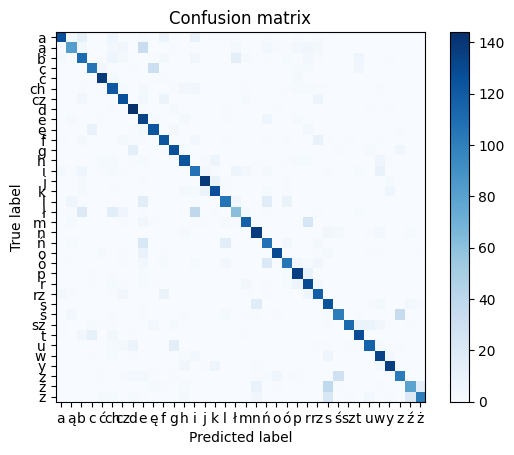

Model: "sequential_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_330 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_165 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_331 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_165 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_332 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

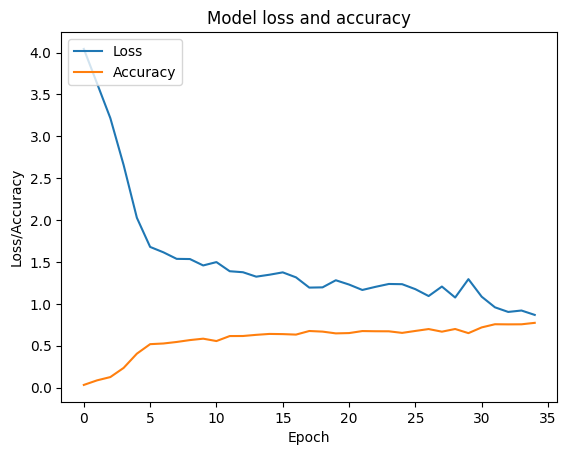

172/172 [==============================] - 6s 36ms/step


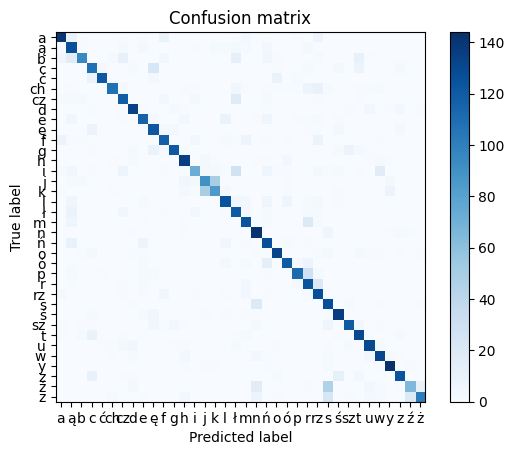

Model: "sequential_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_336 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_168 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_337 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_168 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_338 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

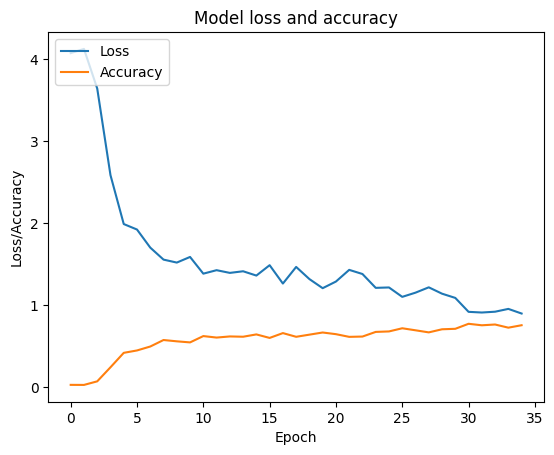

172/172 [==============================] - 7s 37ms/step


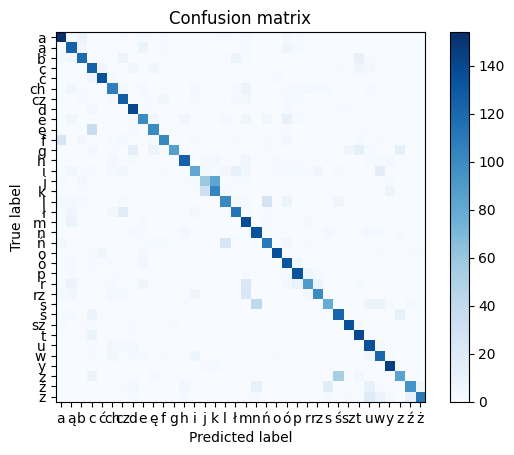

Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_342 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_171 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_343 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_171 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_344 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

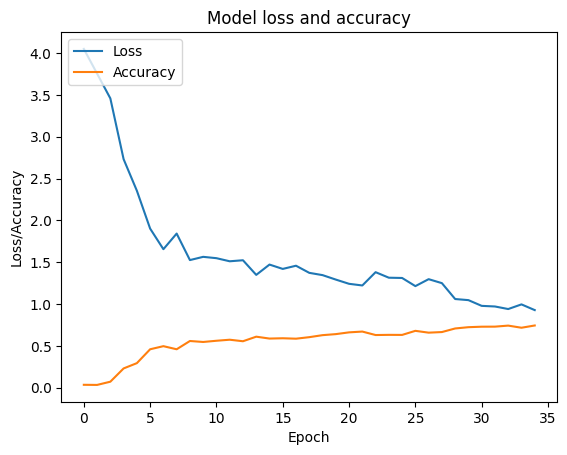

172/172 [==============================] - 7s 37ms/step


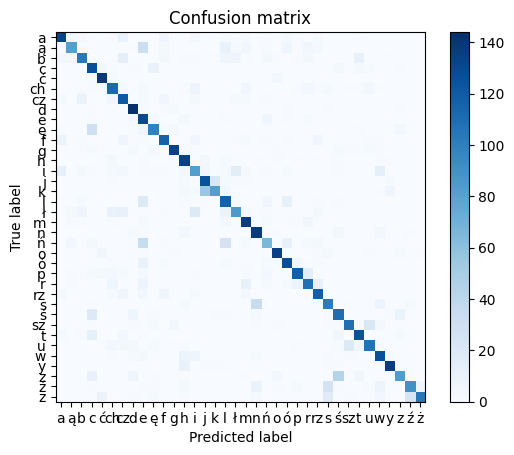

Model: "sequential_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_348 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_174 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_349 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_174 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_350 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

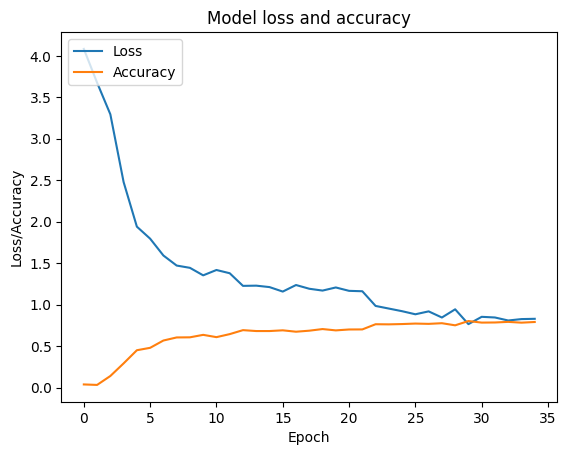

172/172 [==============================] - 7s 39ms/step


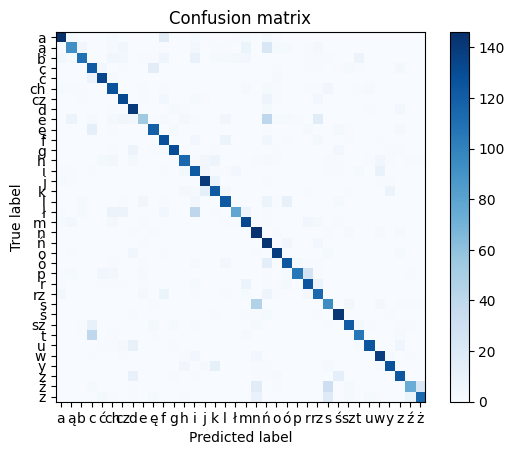

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_354 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_177 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_355 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_177 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_356 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

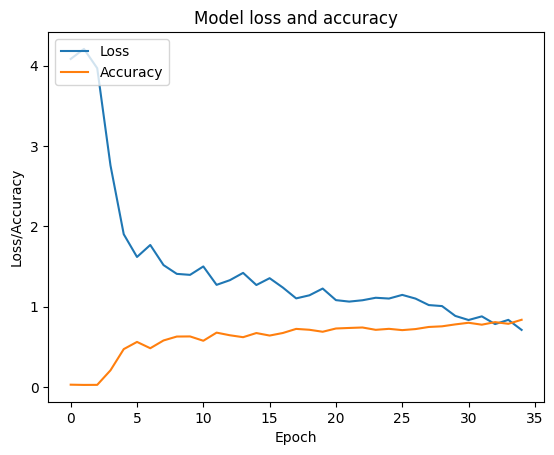

172/172 [==============================] - 6s 36ms/step


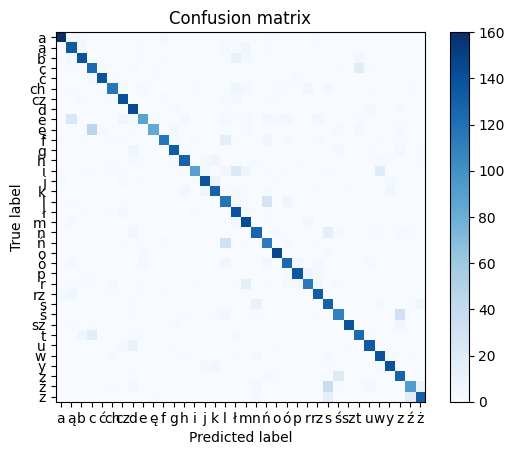

Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_360 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_180 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_361 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_180 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_362 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

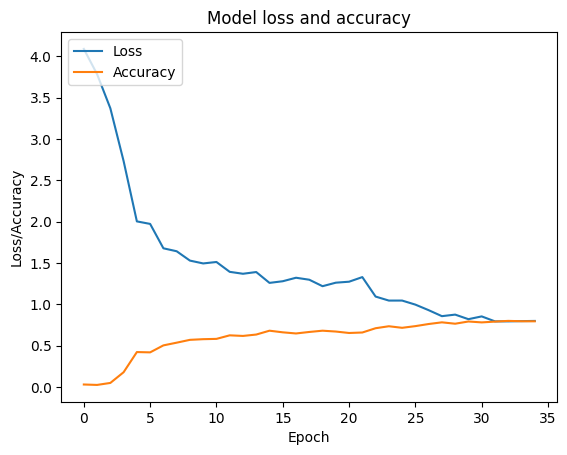

172/172 [==============================] - 7s 38ms/step


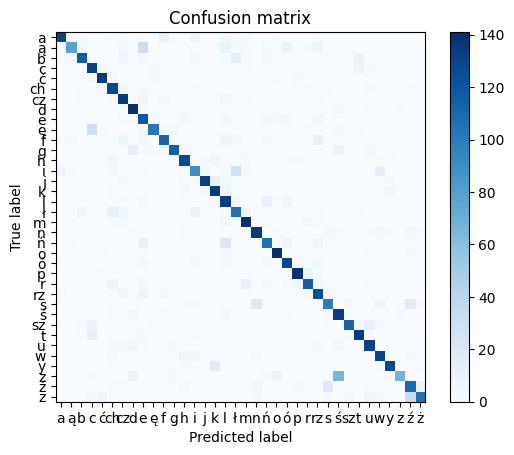

Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_366 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_183 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_367 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_183 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_368 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

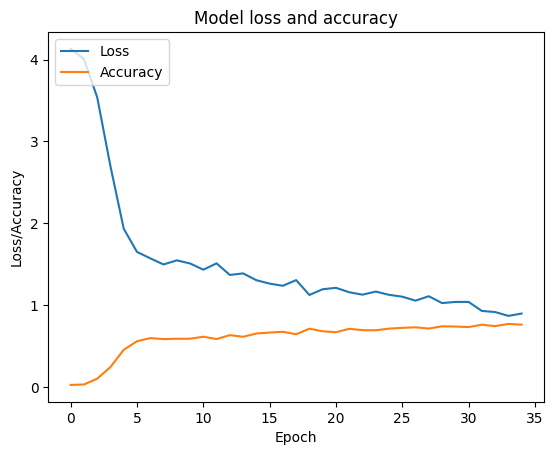

172/172 [==============================] - 6s 34ms/step


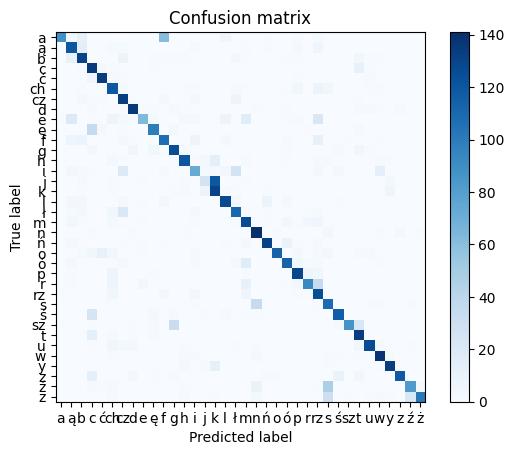

Model: "sequential_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_372 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_186 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_373 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_186 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_374 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

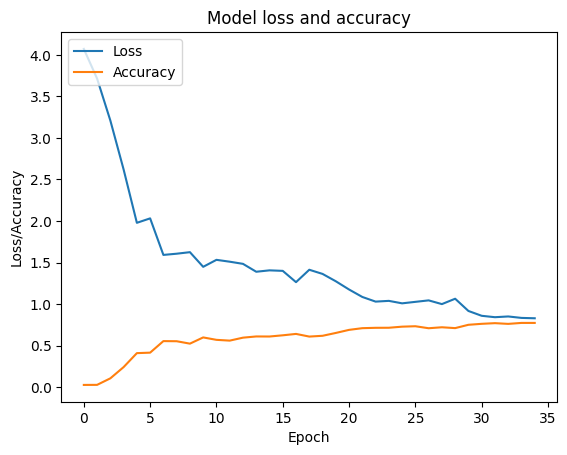

172/172 [==============================] - 7s 37ms/step


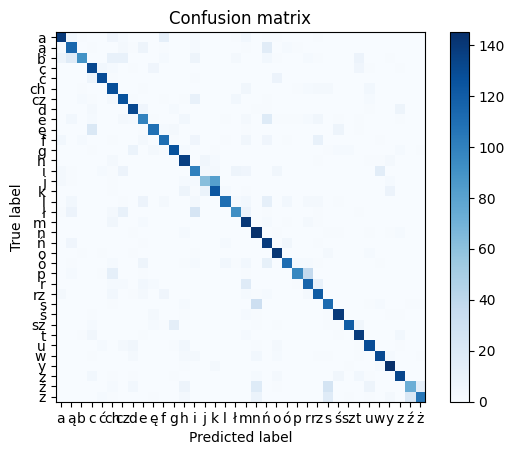

Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_378 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_189 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_379 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_189 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_380 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

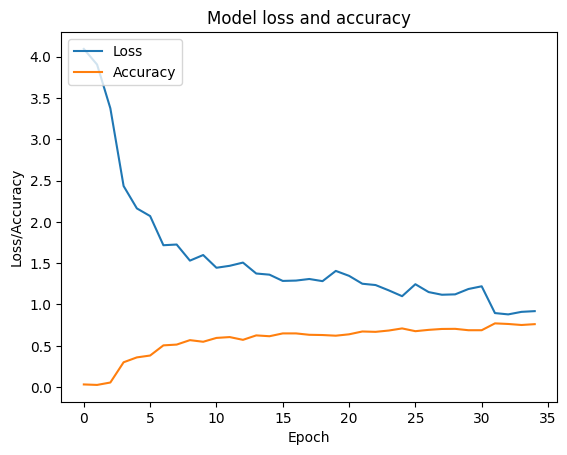

172/172 [==============================] - 7s 38ms/step


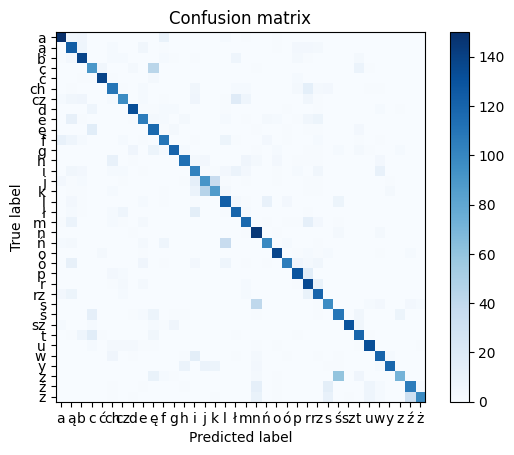

Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_384 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_192 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_385 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_192 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_386 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

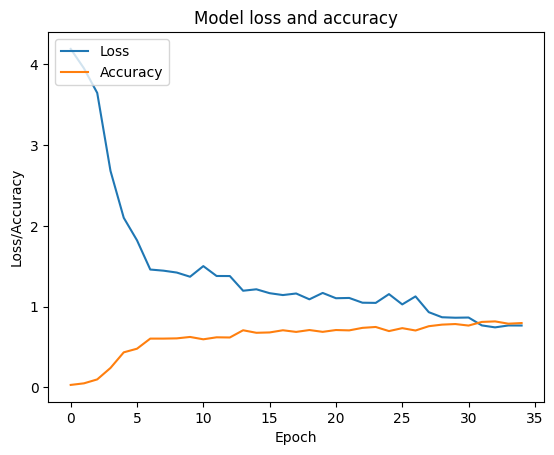

172/172 [==============================] - 7s 38ms/step


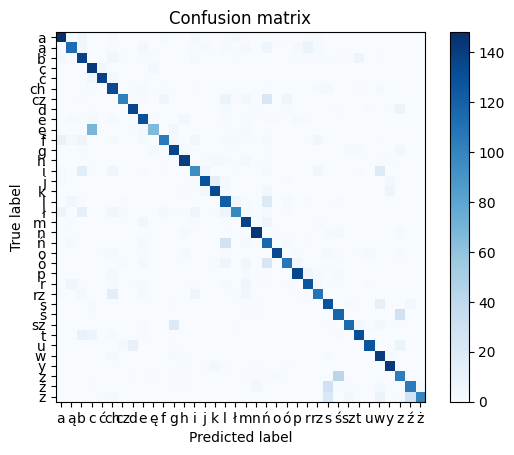

Model: "sequential_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_390 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_195 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_391 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_195 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_392 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

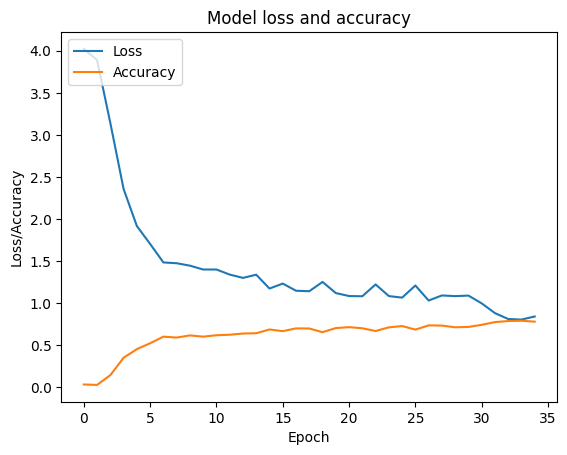

172/172 [==============================] - 7s 38ms/step


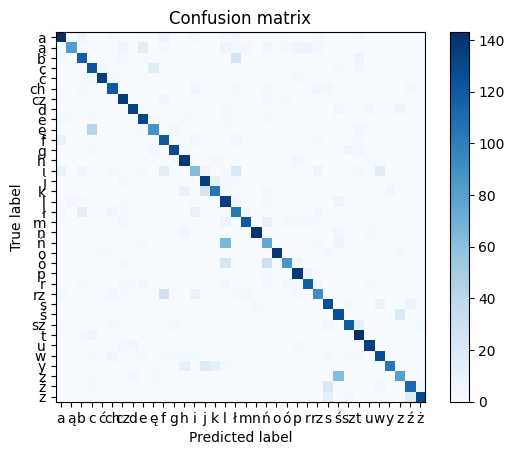

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_396 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_198 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_397 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_198 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_398 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

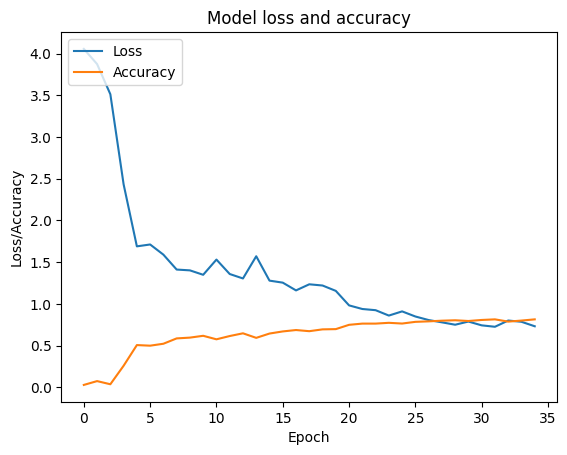

172/172 [==============================] - 7s 38ms/step


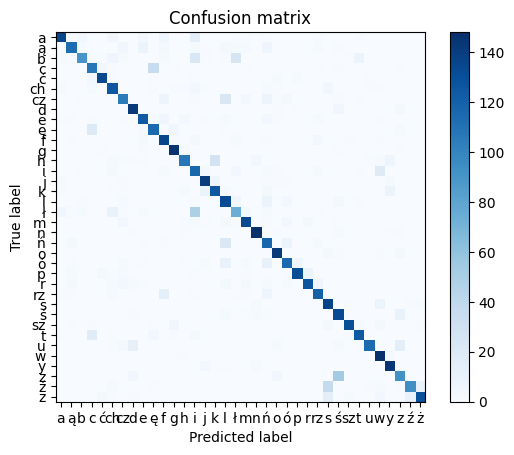

Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_402 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_201 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_403 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_201 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_404 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

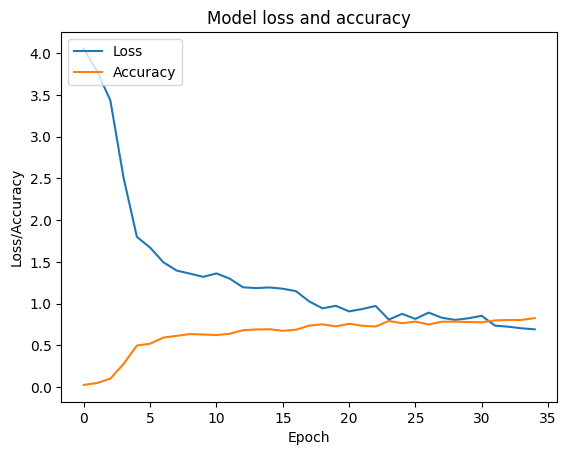

172/172 [==============================] - 7s 36ms/step


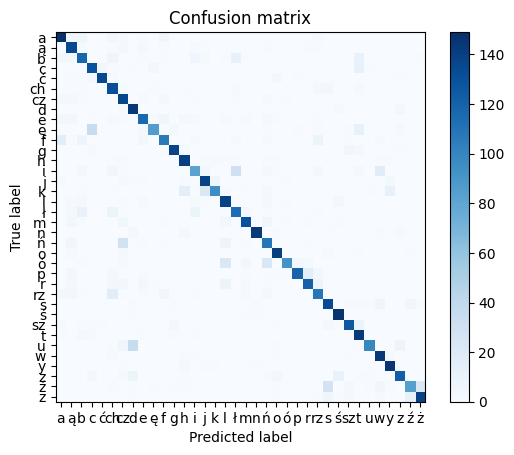

Model: "sequential_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_408 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_204 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_409 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_204 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_410 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

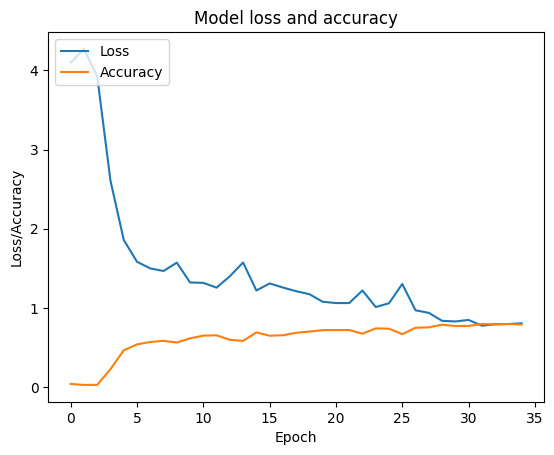

172/172 [==============================] - 7s 38ms/step


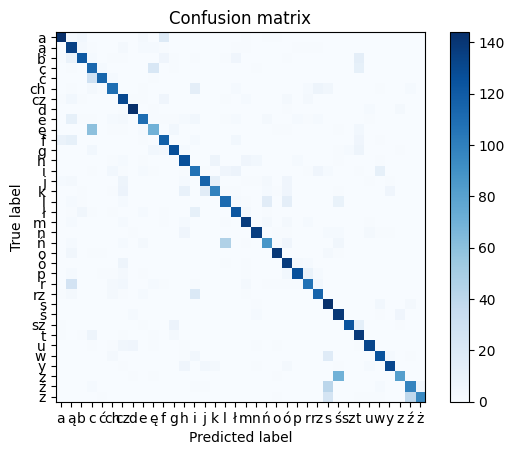

Model: "sequential_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_414 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_207 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_415 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_207 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_416 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

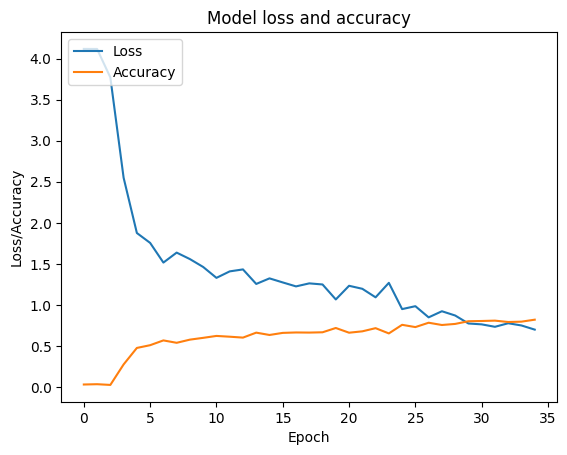

172/172 [==============================] - 7s 40ms/step


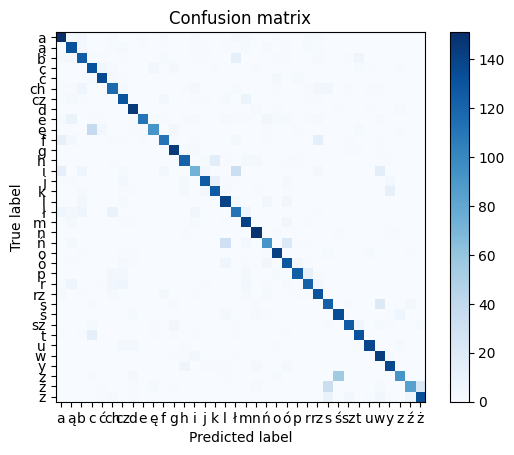

Model: "sequential_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_420 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_210 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_421 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_210 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_422 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

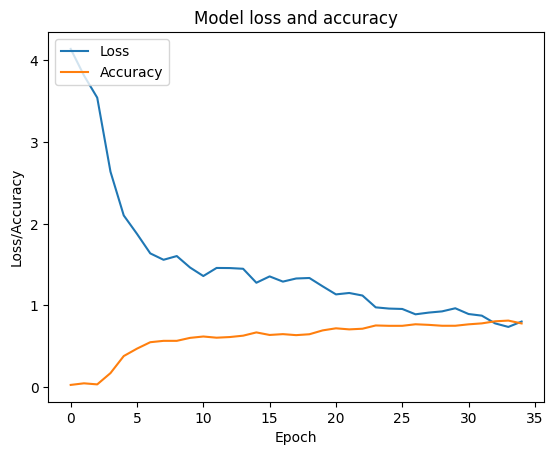

172/172 [==============================] - 7s 38ms/step


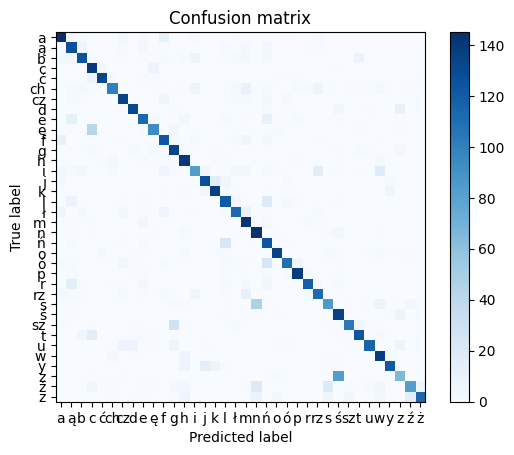

Model: "sequential_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_426 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_213 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_427 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_213 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_428 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

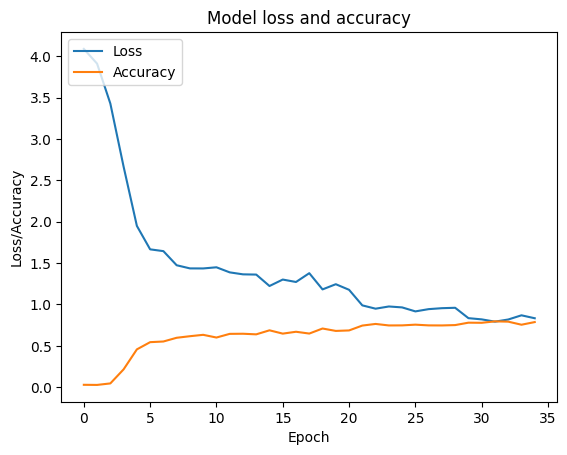

172/172 [==============================] - 7s 39ms/step


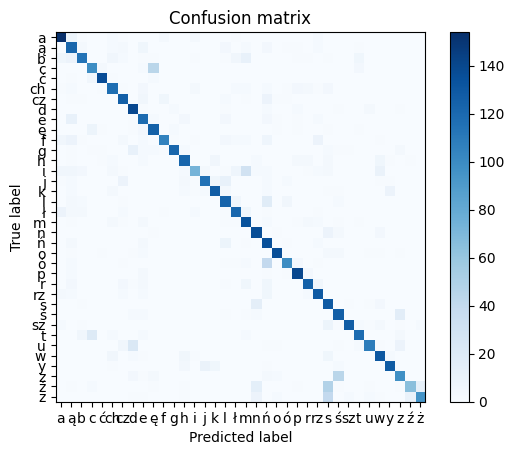

Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_432 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_216 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_433 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_216 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_434 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

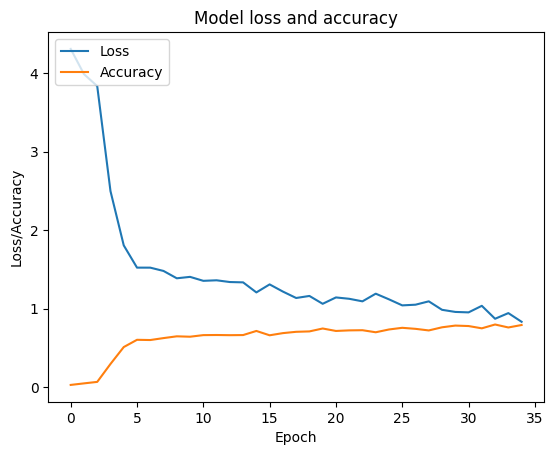

172/172 [==============================] - 7s 38ms/step


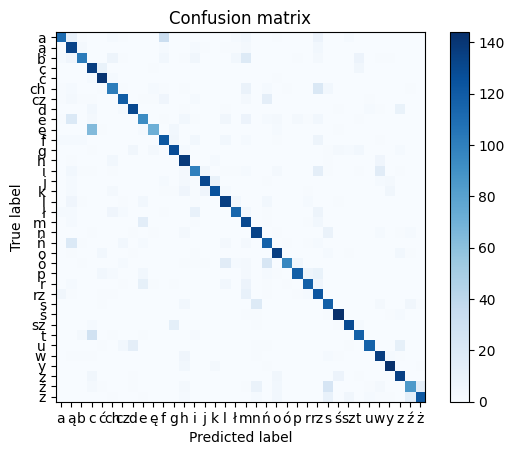

Model: "sequential_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_438 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_219 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_439 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_219 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_440 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

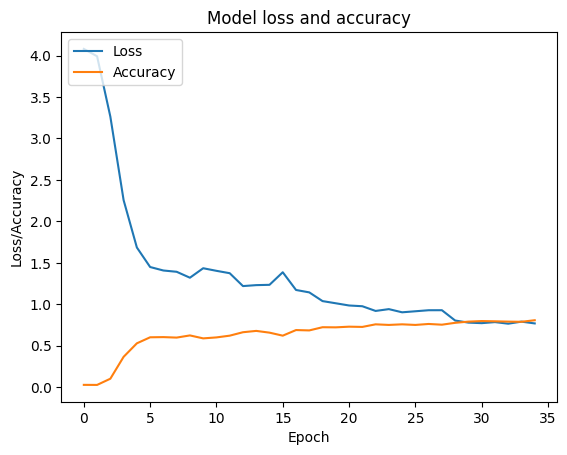

172/172 [==============================] - 7s 40ms/step


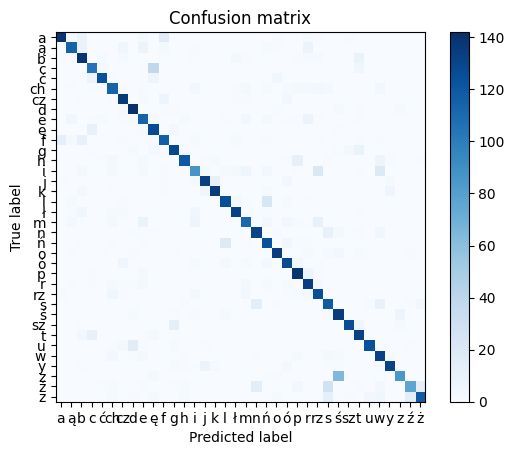

Model: "sequential_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_444 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_222 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_445 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_222 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_446 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

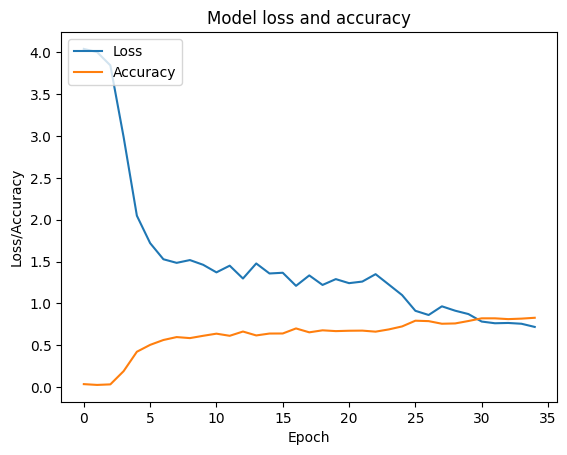

172/172 [==============================] - 8s 42ms/step


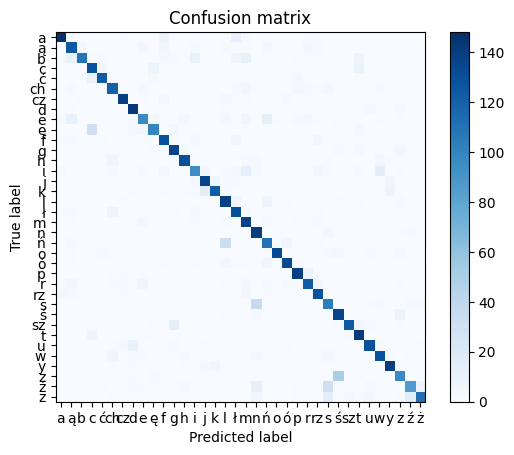

Model: "sequential_75"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_450 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_225 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_451 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_225 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_452 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

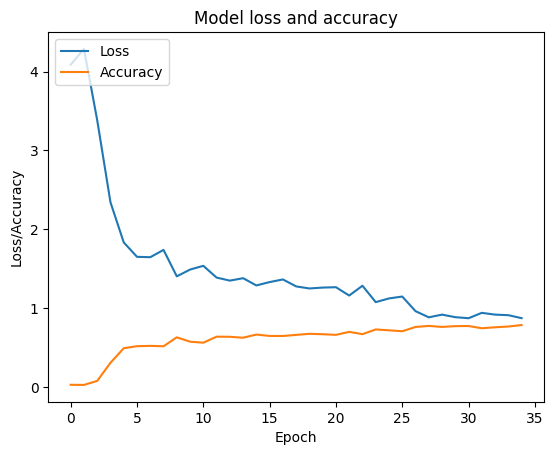

172/172 [==============================] - 7s 40ms/step


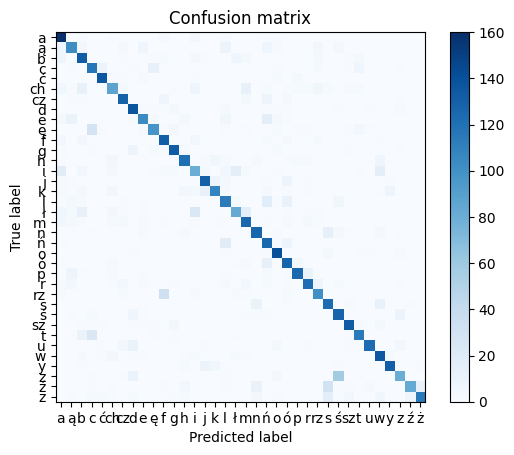

Model: "sequential_76"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_456 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_228 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_457 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_228 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_458 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

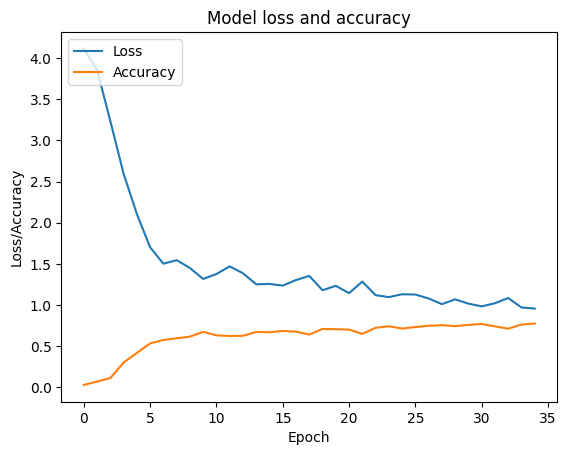

172/172 [==============================] - 7s 39ms/step


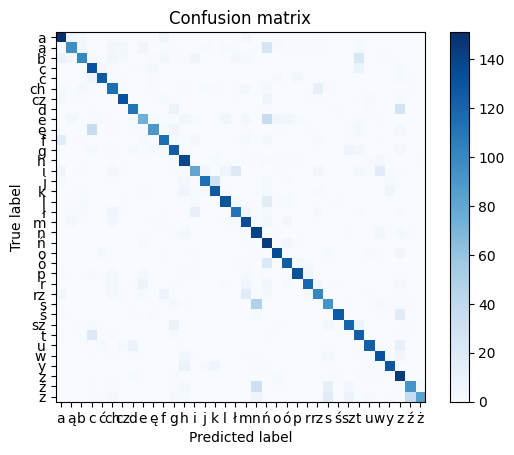

Model: "sequential_77"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_462 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_231 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_463 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_231 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_464 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

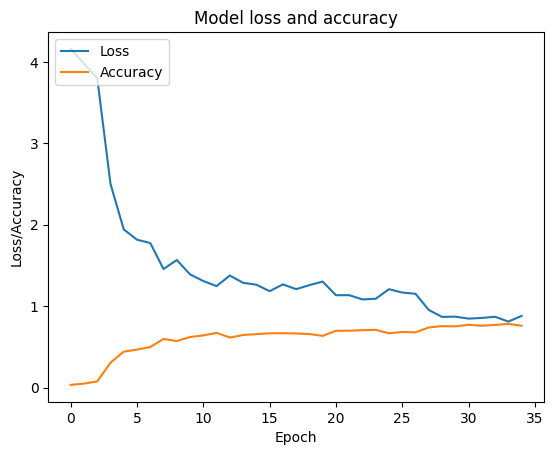

172/172 [==============================] - 7s 37ms/step


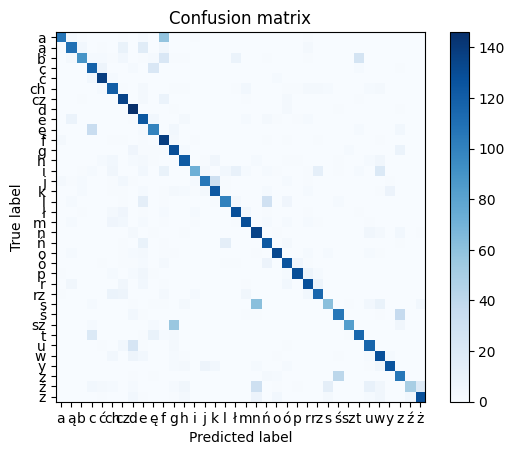

Model: "sequential_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_468 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_234 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_469 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_234 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_470 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

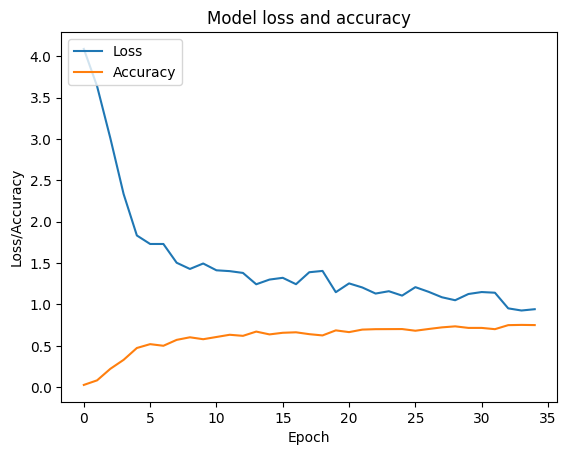

172/172 [==============================] - 7s 37ms/step


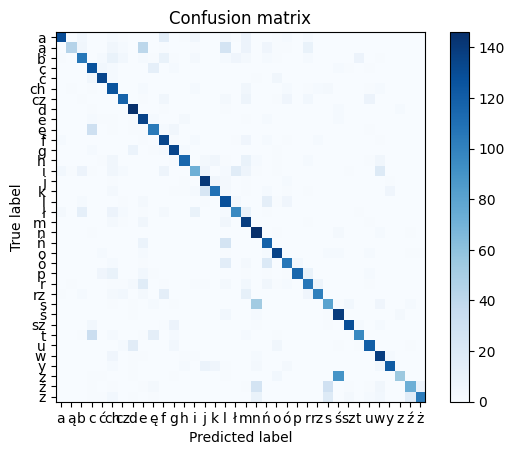

Model: "sequential_79"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_474 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_237 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_475 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_237 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_476 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

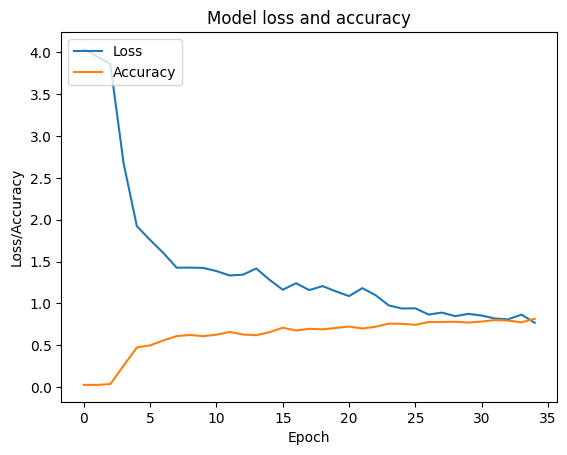

172/172 [==============================] - 7s 39ms/step


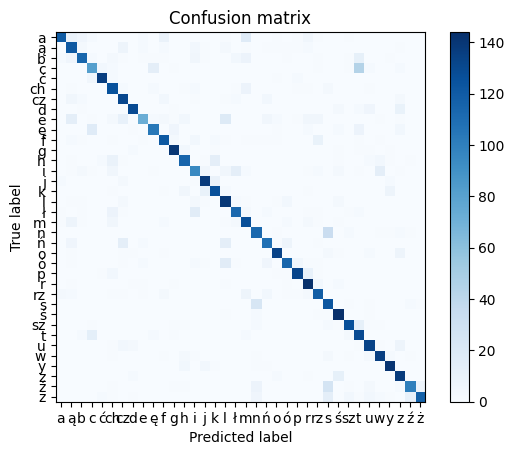

Model: "sequential_80"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_480 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_240 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_481 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_240 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_482 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

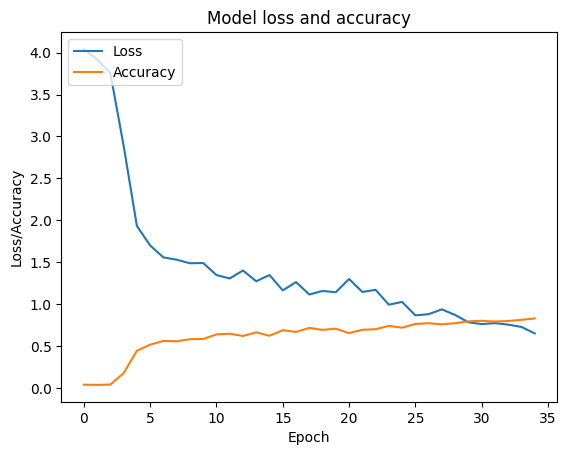

172/172 [==============================] - 7s 38ms/step


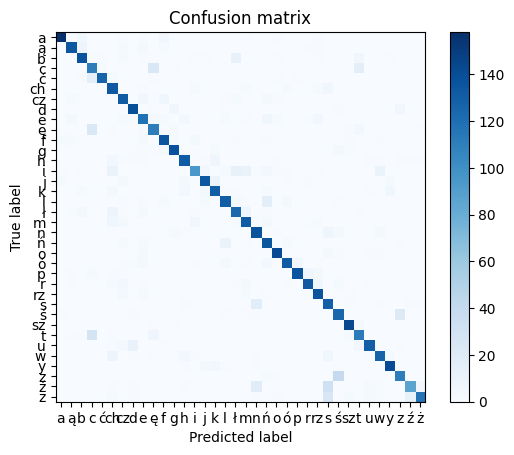

Model: "sequential_81"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_486 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_243 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_487 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_243 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_488 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

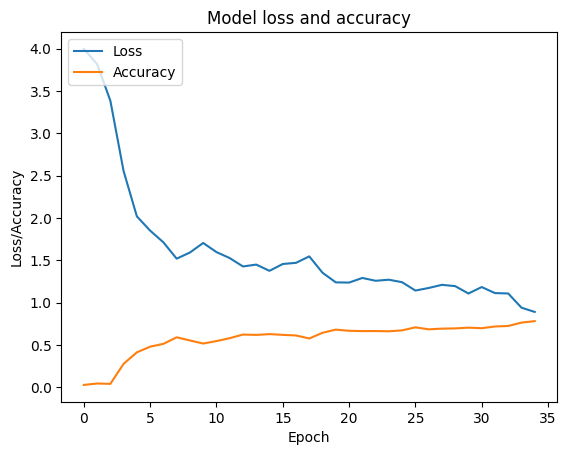

172/172 [==============================] - 7s 39ms/step


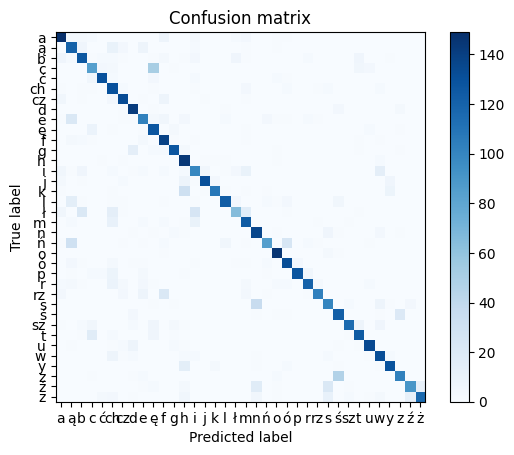

Model: "sequential_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_492 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_246 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_493 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_246 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_494 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

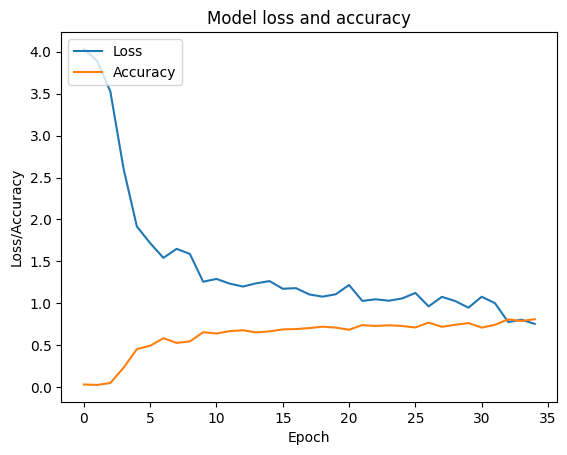

172/172 [==============================] - 7s 39ms/step


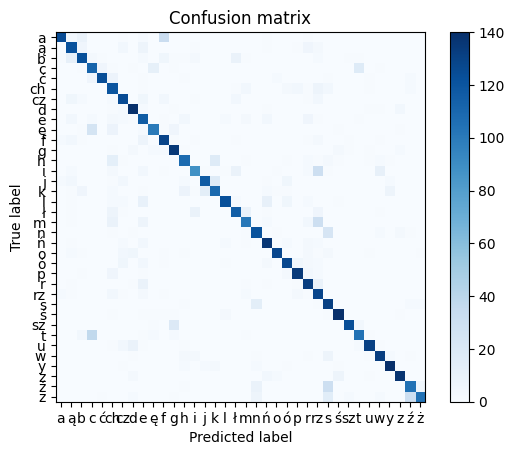

Model: "sequential_83"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_498 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_249 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_499 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_249 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_500 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

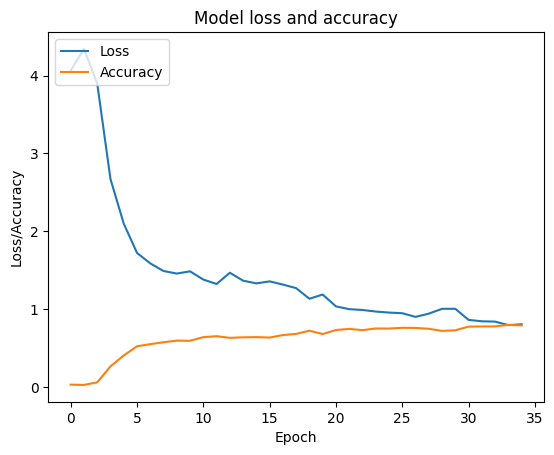

172/172 [==============================] - 7s 39ms/step


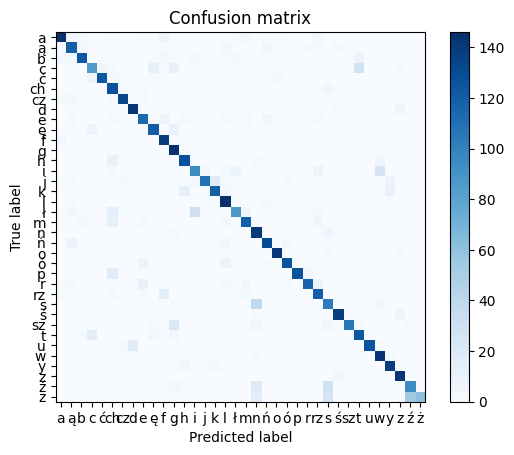

Model: "sequential_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_504 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_252 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_505 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_252 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_506 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

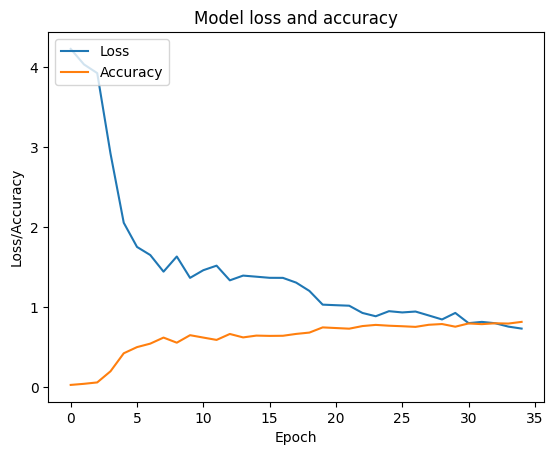

172/172 [==============================] - 7s 36ms/step


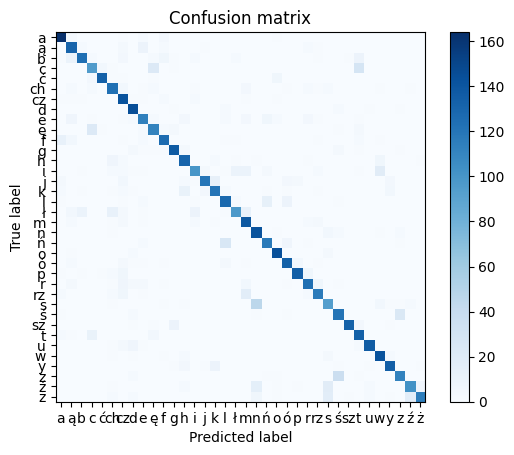

Model: "sequential_85"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_510 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_255 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_511 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_255 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_512 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

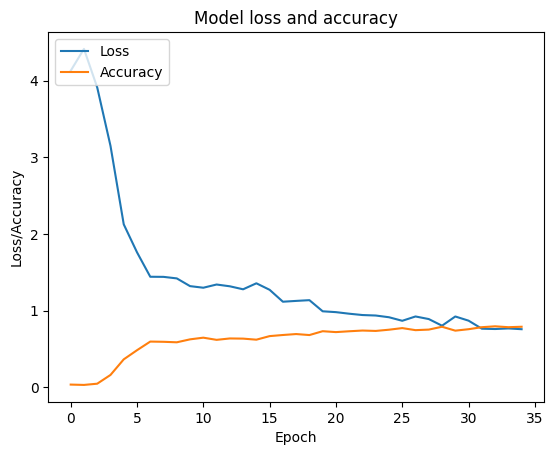

172/172 [==============================] - 7s 37ms/step


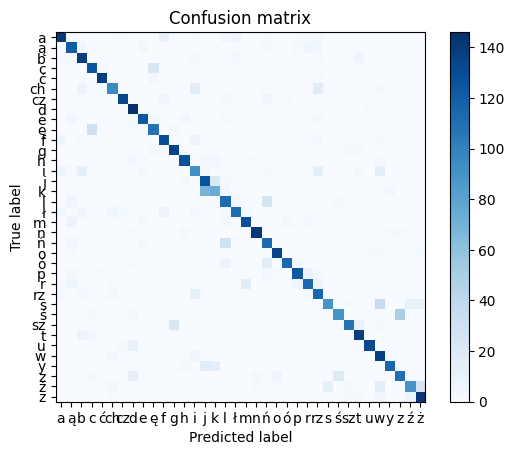

Model: "sequential_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_516 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_258 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_517 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_258 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_518 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

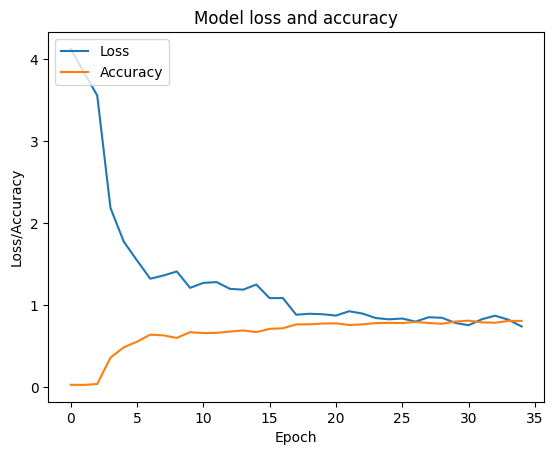

172/172 [==============================] - 7s 38ms/step


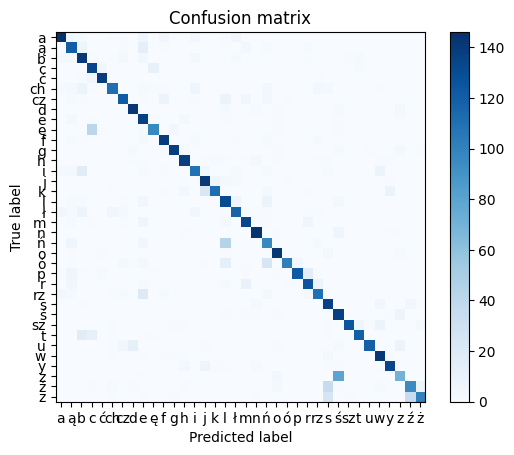

Model: "sequential_87"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_522 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_261 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_523 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_261 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_524 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

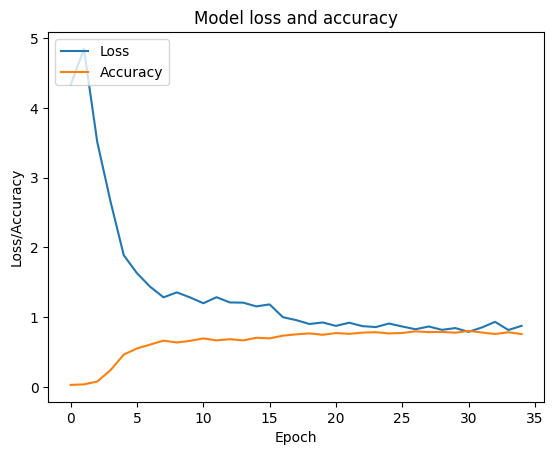

172/172 [==============================] - 7s 38ms/step


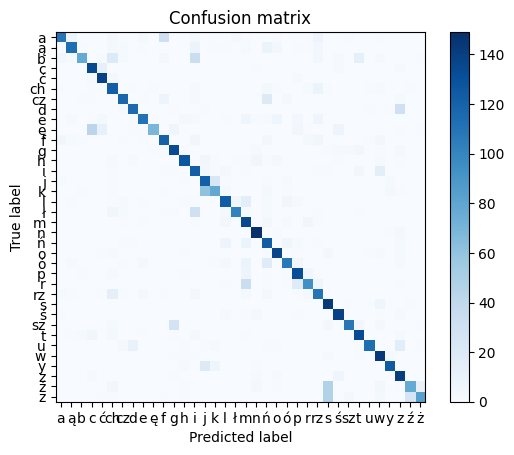

Model: "sequential_88"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_528 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_264 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_529 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_264 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_530 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

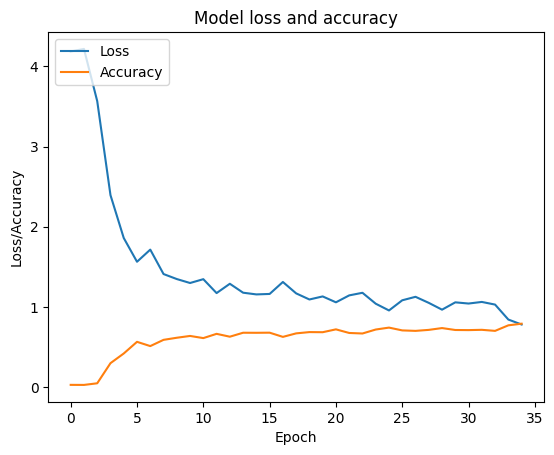

172/172 [==============================] - 7s 37ms/step


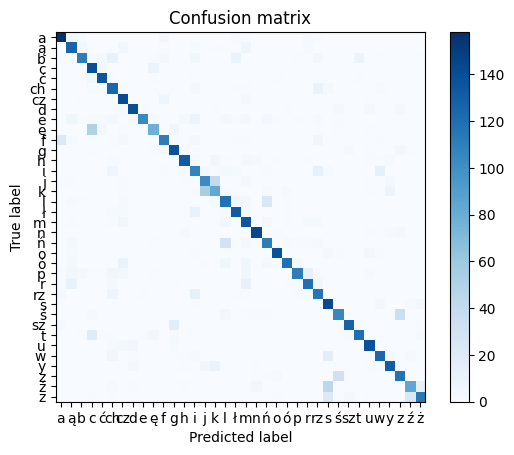

Model: "sequential_89"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_534 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_267 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_535 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_267 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_536 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

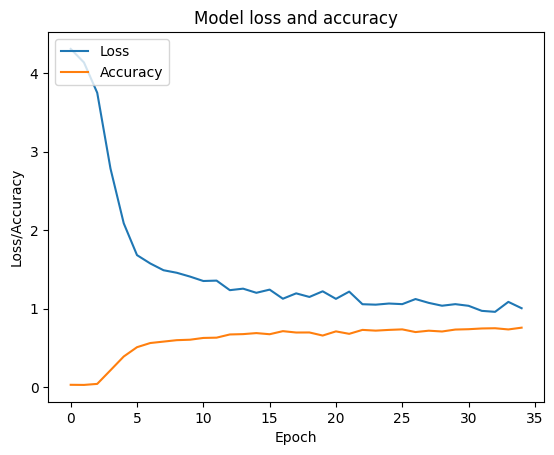

172/172 [==============================] - 7s 39ms/step


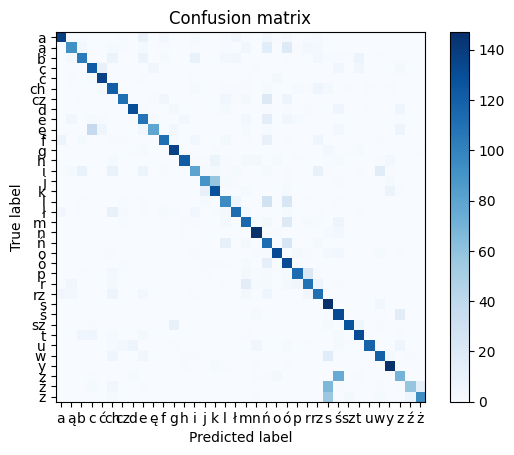

Model: "sequential_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_540 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_270 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_541 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_270 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_542 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

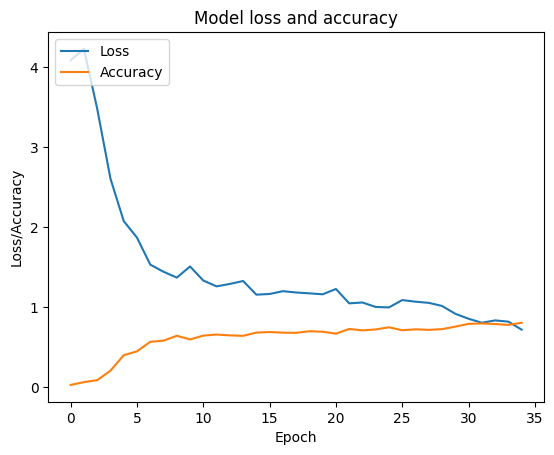

172/172 [==============================] - 7s 41ms/step


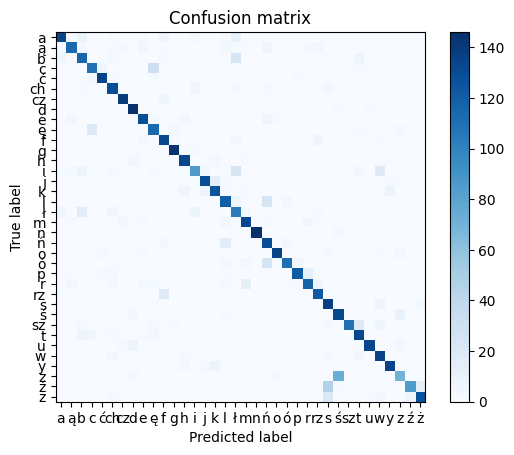

Model: "sequential_91"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_546 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_273 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_547 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_273 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_548 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

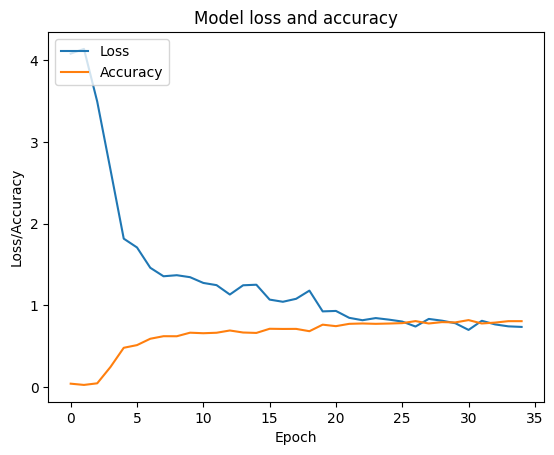

172/172 [==============================] - 7s 37ms/step


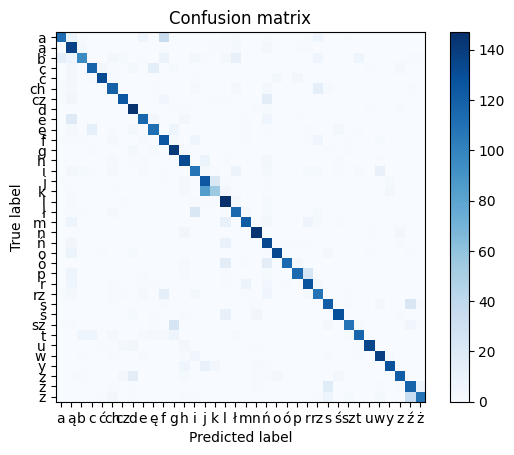

Model: "sequential_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_552 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_276 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_553 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_276 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_554 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

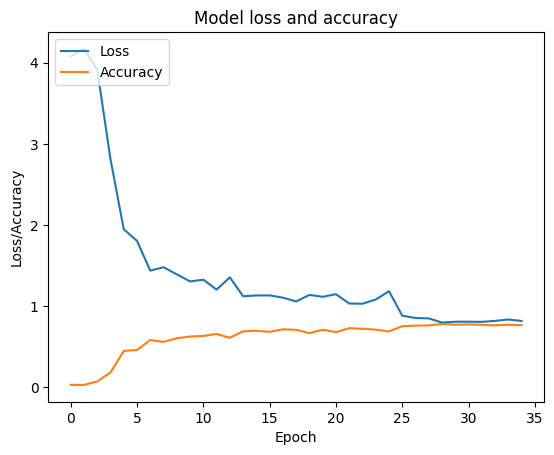

172/172 [==============================] - 7s 41ms/step


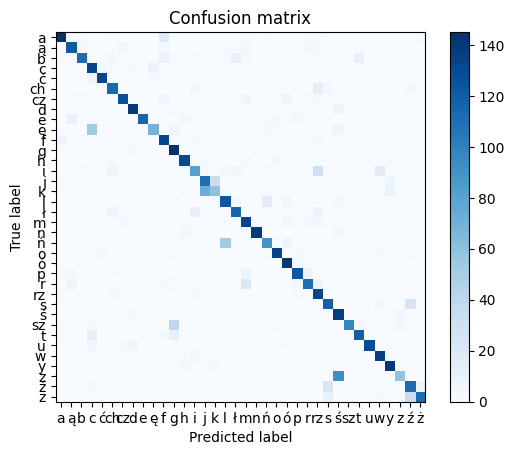

Model: "sequential_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_558 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_279 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_559 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_279 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_560 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

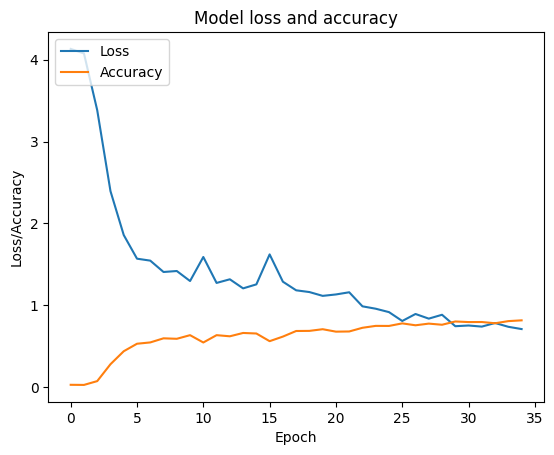

172/172 [==============================] - 7s 38ms/step


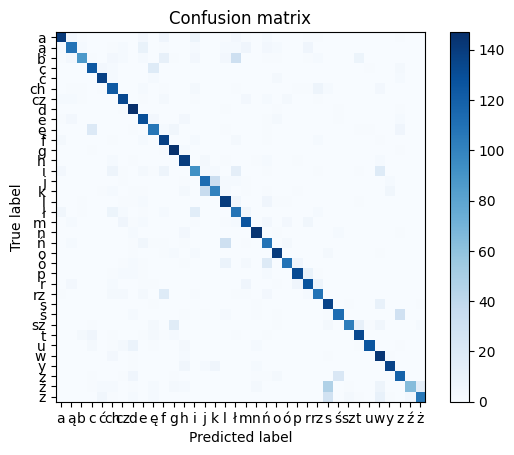

Model: "sequential_94"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_564 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_282 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_565 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_282 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_566 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

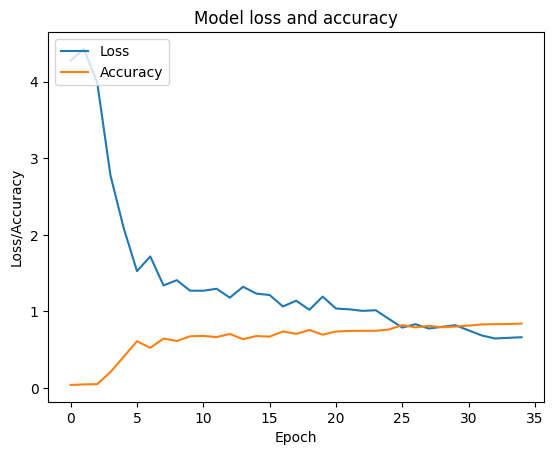

172/172 [==============================] - 7s 38ms/step


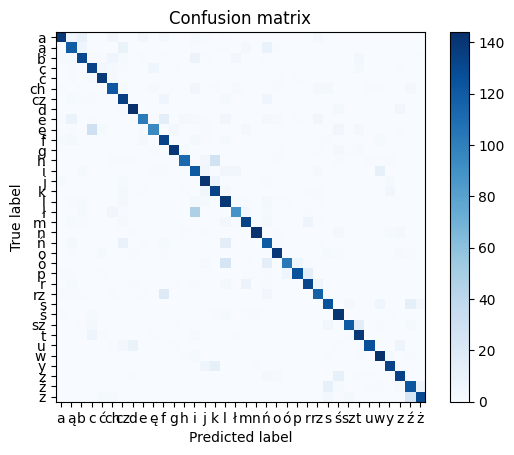

Model: "sequential_95"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_570 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_285 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_571 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_285 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_572 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

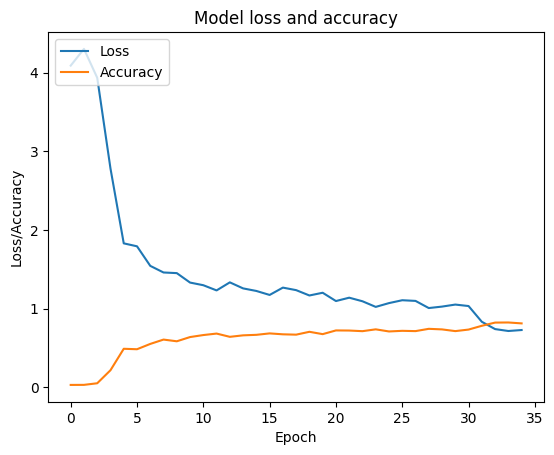

172/172 [==============================] - 7s 35ms/step


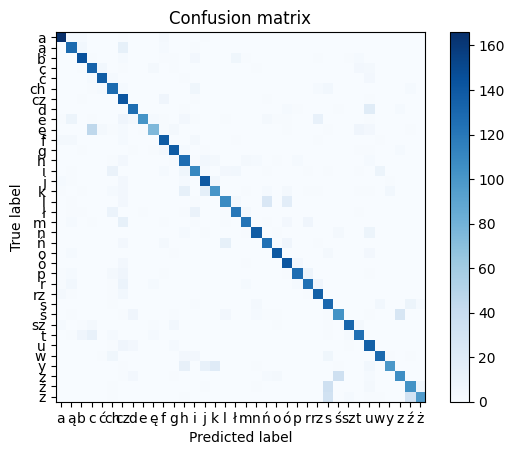

Model: "sequential_96"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_576 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_288 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_577 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_288 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_578 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

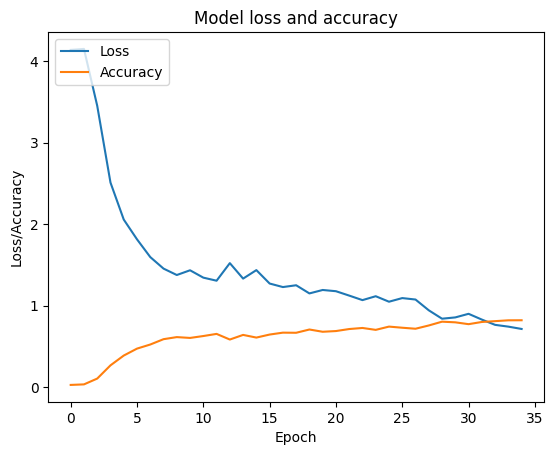

172/172 [==============================] - 7s 37ms/step


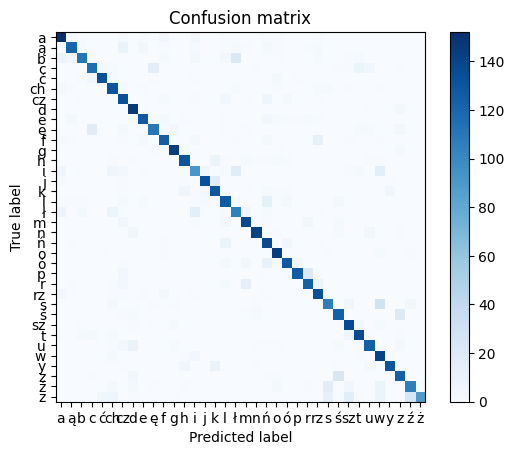

Model: "sequential_97"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_582 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_291 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_583 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_291 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_584 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

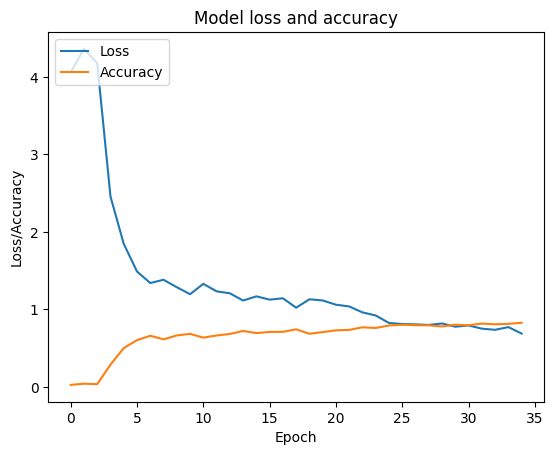

172/172 [==============================] - 7s 39ms/step


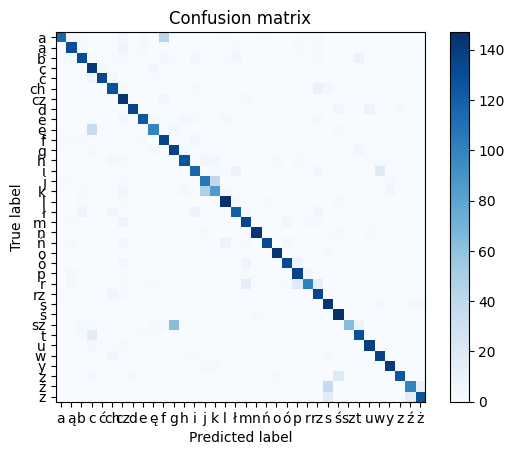

Model: "sequential_98"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_588 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_294 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_589 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_294 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_590 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

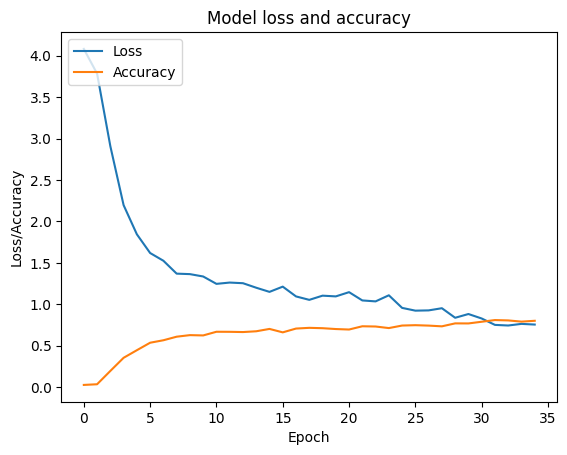

172/172 [==============================] - 7s 36ms/step


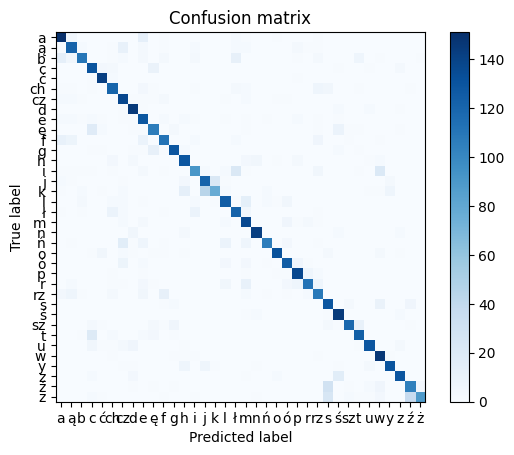

Model: "sequential_99"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_594 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_297 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_595 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_297 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_596 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                     

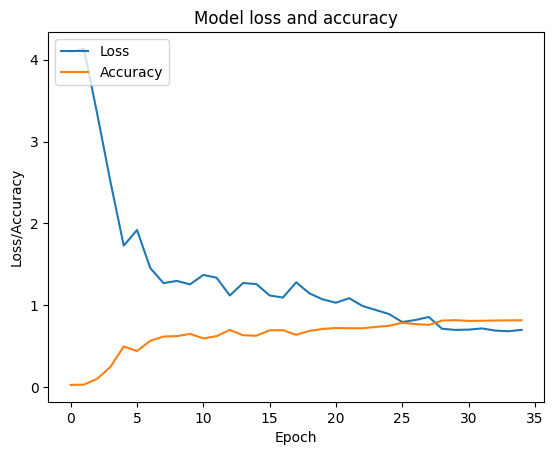

172/172 [==============================] - 7s 39ms/step


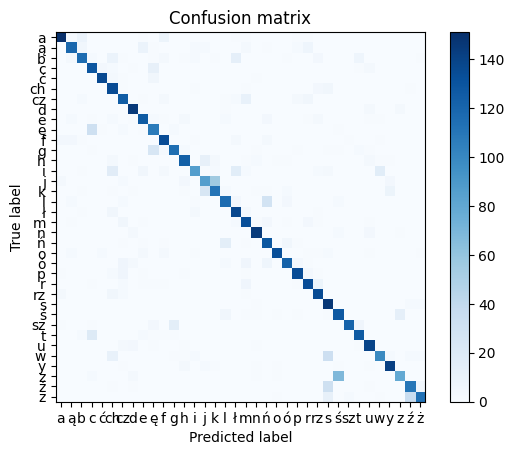

Model: "sequential_100"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_600 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_300 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_601 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_300 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_602 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

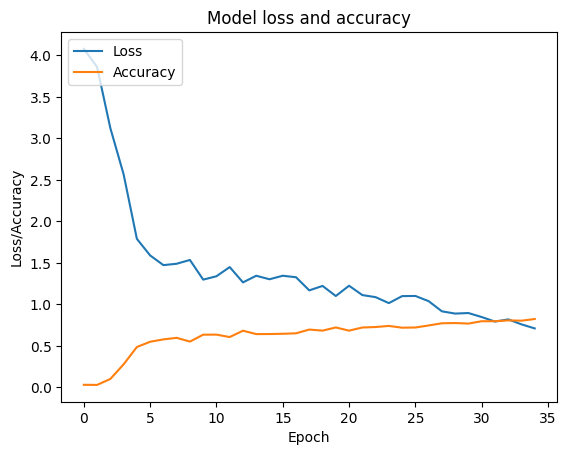

172/172 [==============================] - 8s 42ms/step


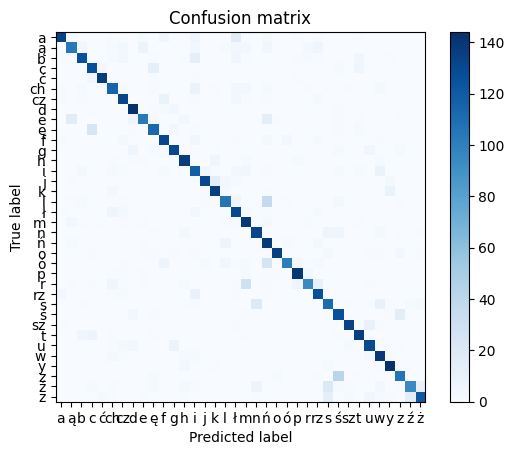

Model: "sequential_101"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_606 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_303 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_607 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_303 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_608 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

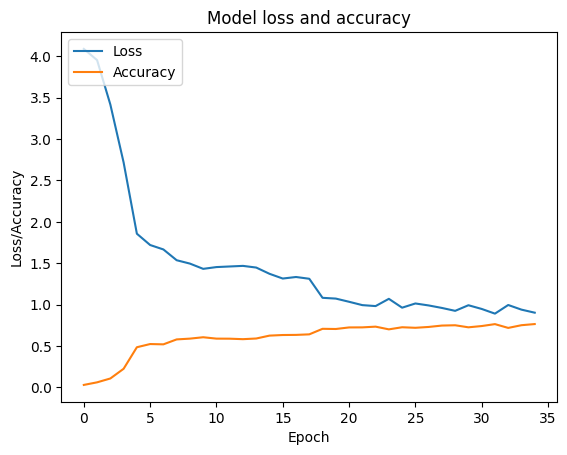

172/172 [==============================] - 7s 41ms/step


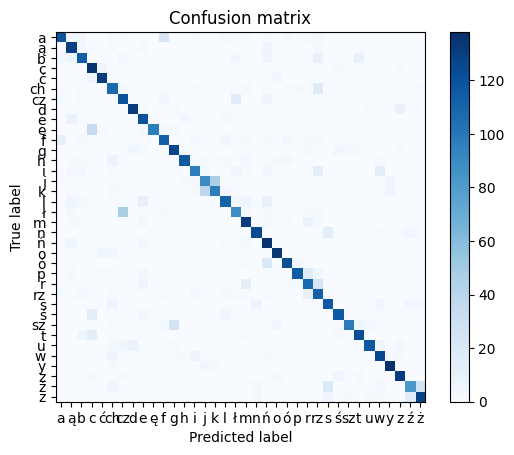

Model: "sequential_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_612 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_306 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_613 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_306 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_614 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

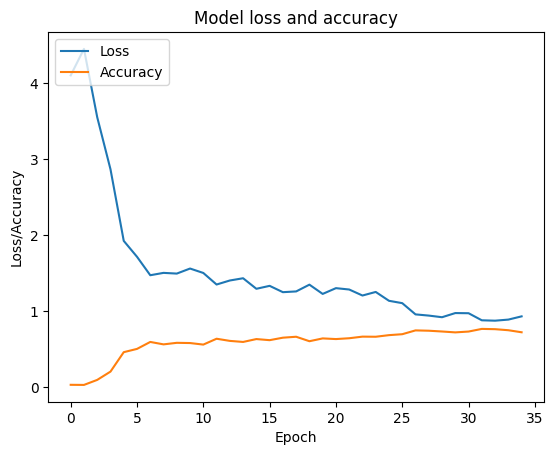

172/172 [==============================] - 7s 41ms/step


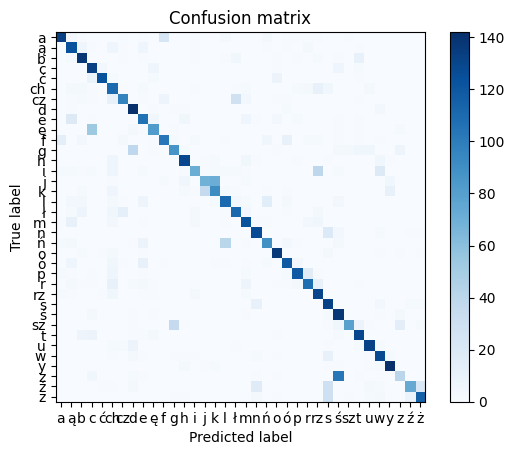

Model: "sequential_103"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_618 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_309 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_619 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_309 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_620 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

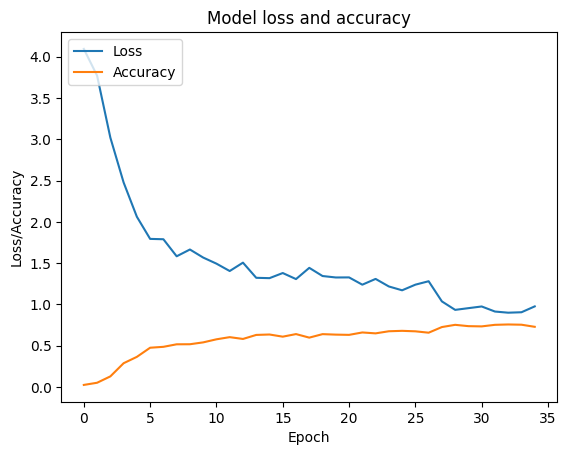

172/172 [==============================] - 8s 43ms/step


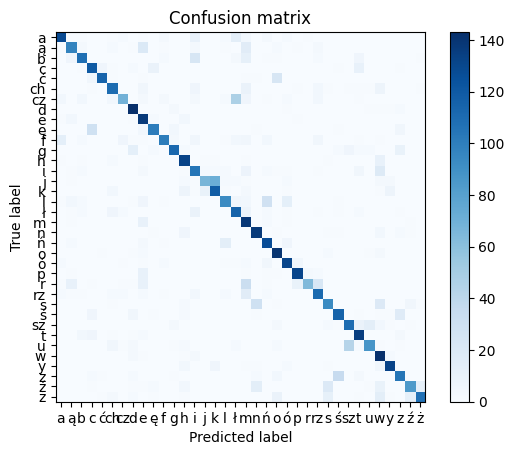

Model: "sequential_104"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_624 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_312 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_625 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_312 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_626 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

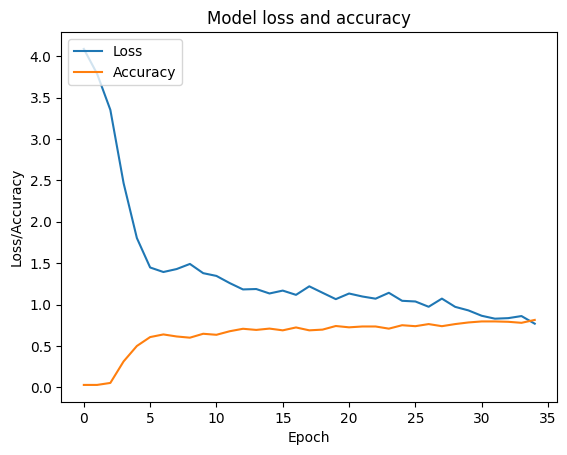

172/172 [==============================] - 7s 39ms/step


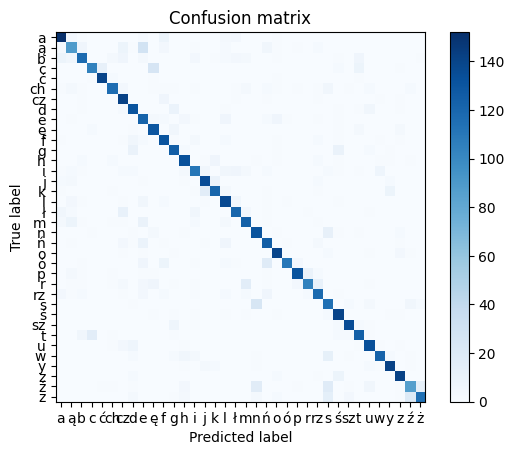

Model: "sequential_105"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_630 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_315 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_631 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_315 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_632 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

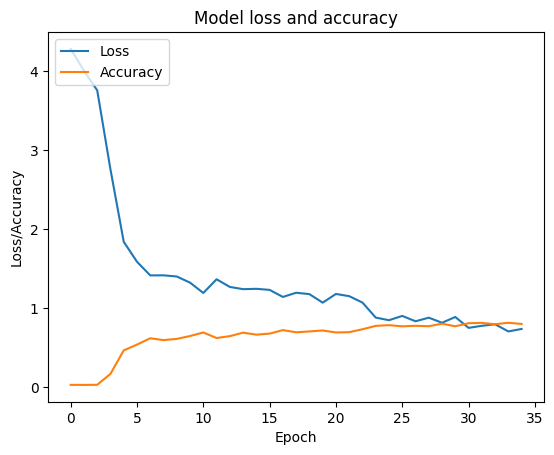

172/172 [==============================] - 7s 36ms/step


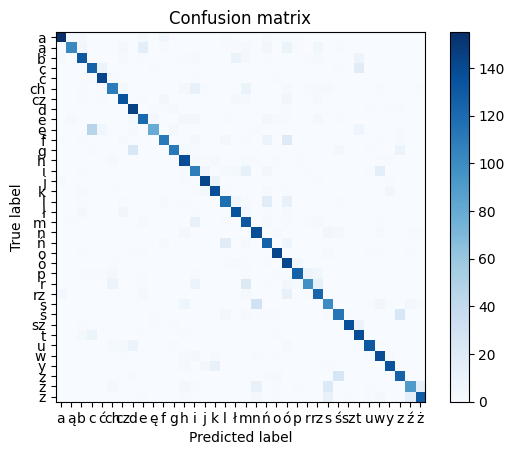

Model: "sequential_106"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_636 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_318 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_637 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_318 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_638 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

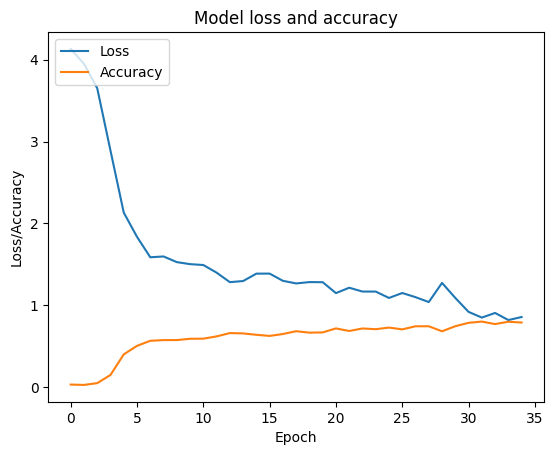

172/172 [==============================] - 7s 37ms/step


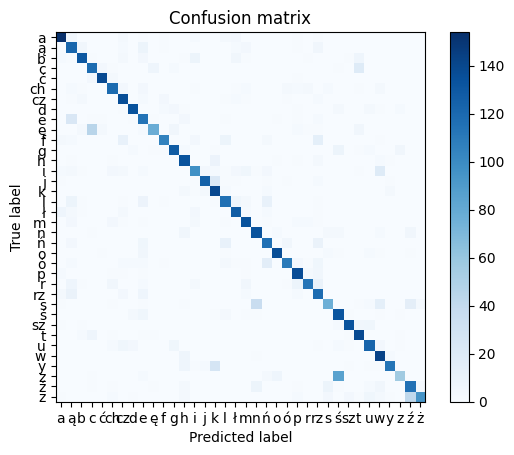

Model: "sequential_107"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_642 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_321 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_643 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_321 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_644 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

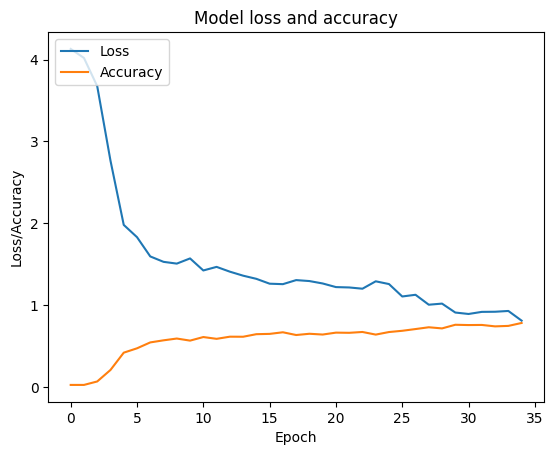

172/172 [==============================] - 7s 38ms/step


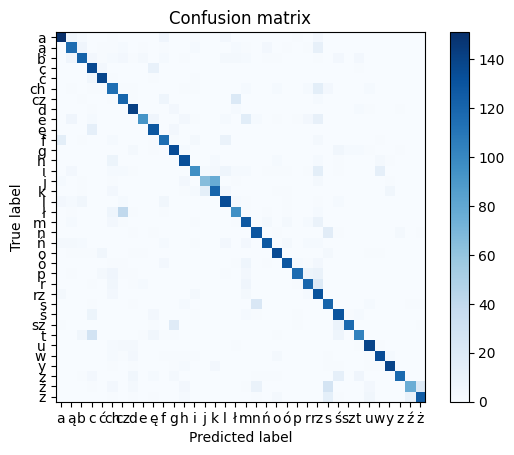

Model: "sequential_108"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_648 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_324 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_649 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_324 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_650 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

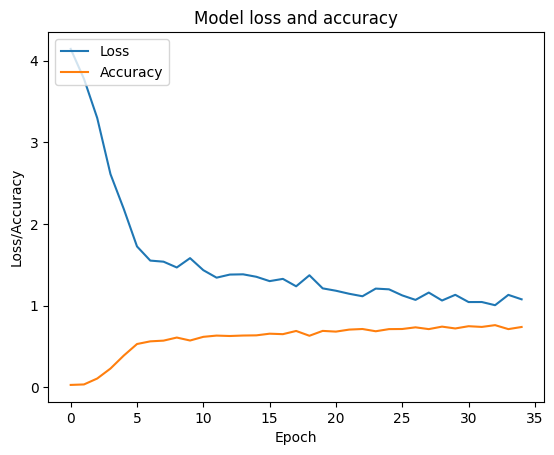

172/172 [==============================] - 7s 41ms/step


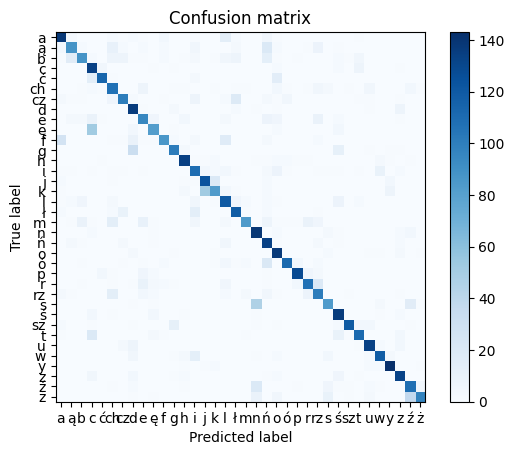

Model: "sequential_109"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_654 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_327 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_655 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_327 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_656 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

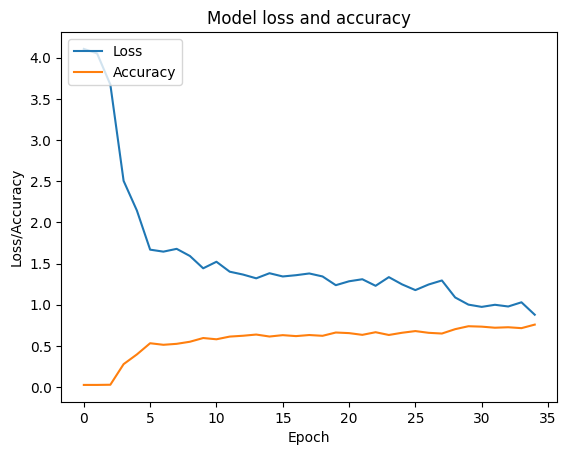

172/172 [==============================] - 7s 41ms/step


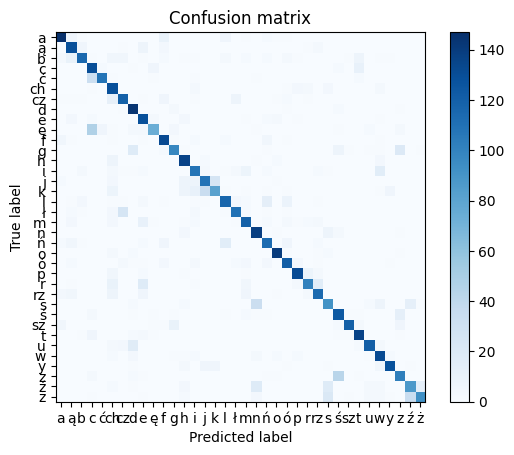

Model: "sequential_110"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_660 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_330 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_661 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_330 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_662 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

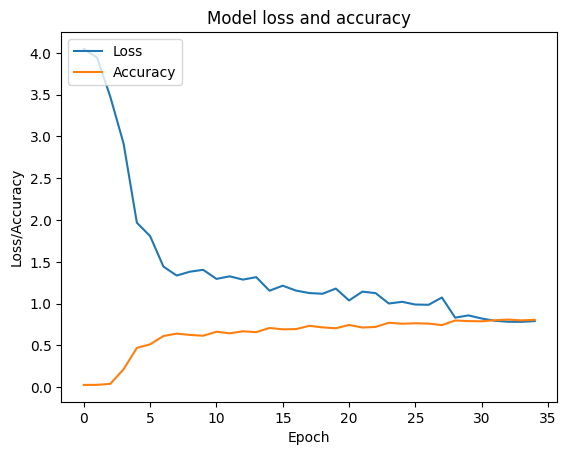

172/172 [==============================] - 9s 48ms/step


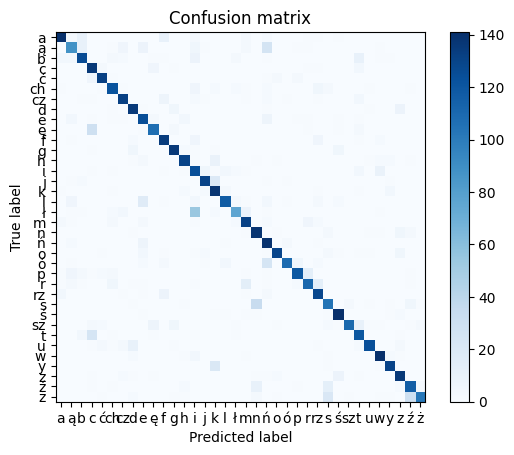

Model: "sequential_111"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_666 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_333 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_667 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_333 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_668 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

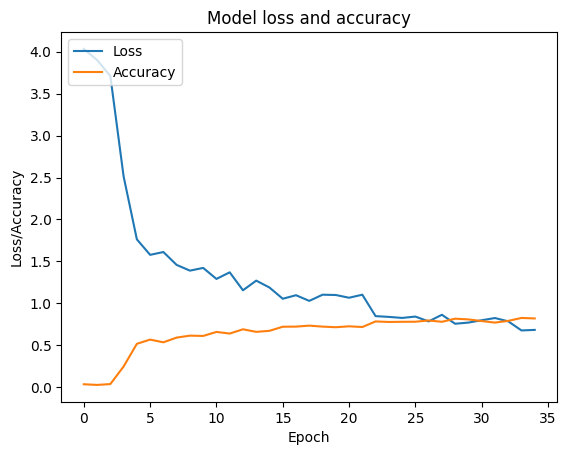

172/172 [==============================] - 7s 38ms/step


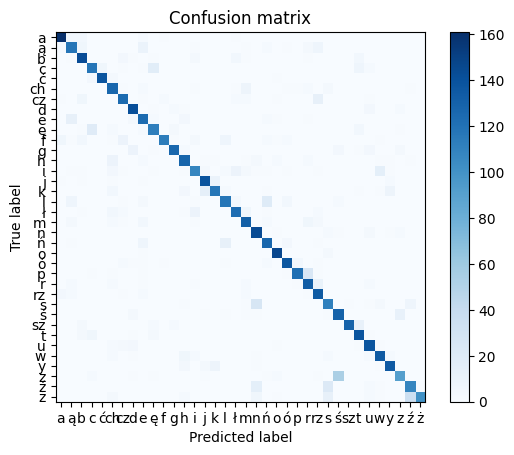

Model: "sequential_112"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_672 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_336 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_673 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_336 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_674 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

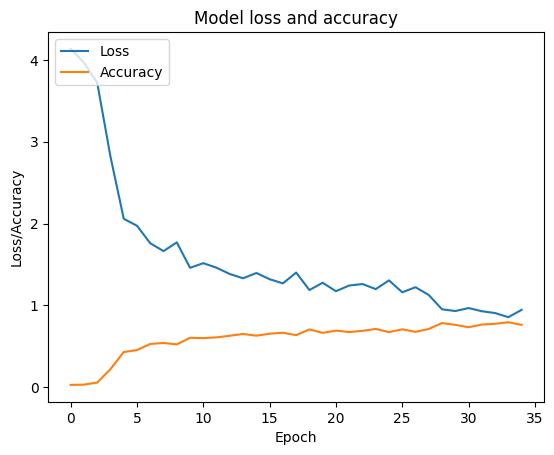

172/172 [==============================] - 7s 37ms/step


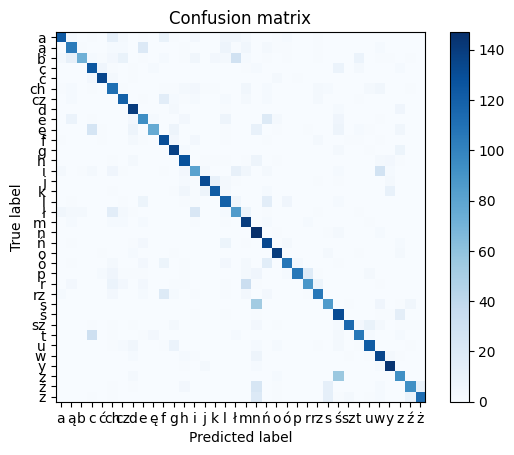

Model: "sequential_113"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_678 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_339 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_679 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_339 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_680 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

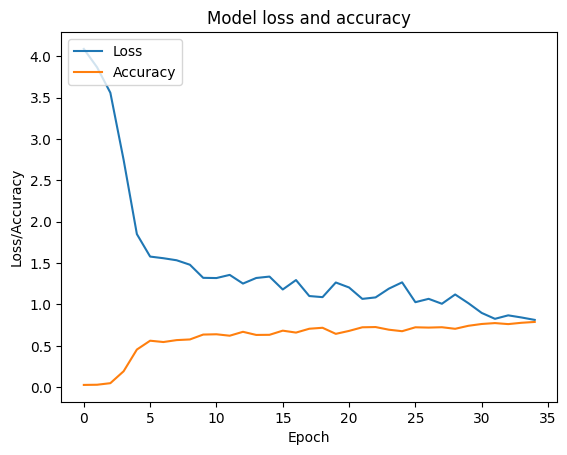

172/172 [==============================] - 7s 36ms/step


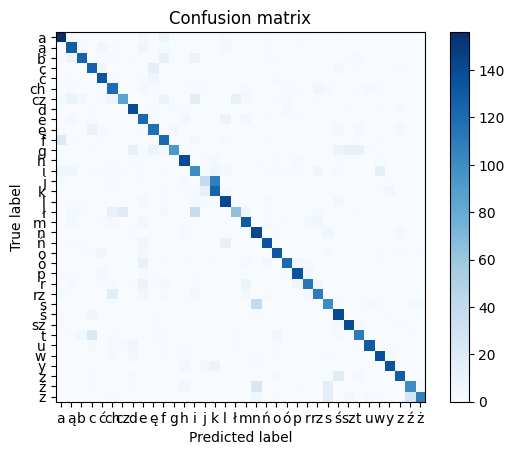

Model: "sequential_114"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_684 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_342 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_685 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_342 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_686 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

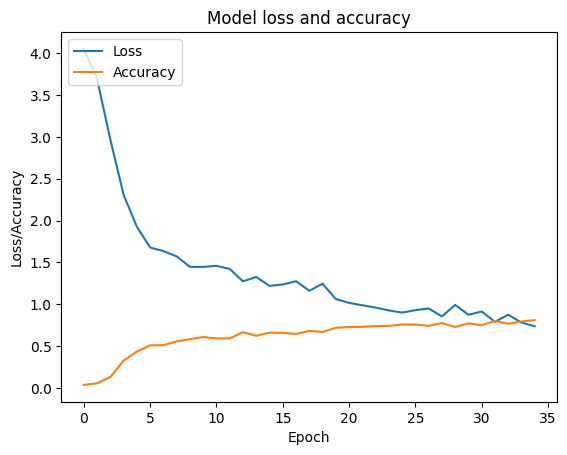

172/172 [==============================] - 7s 38ms/step


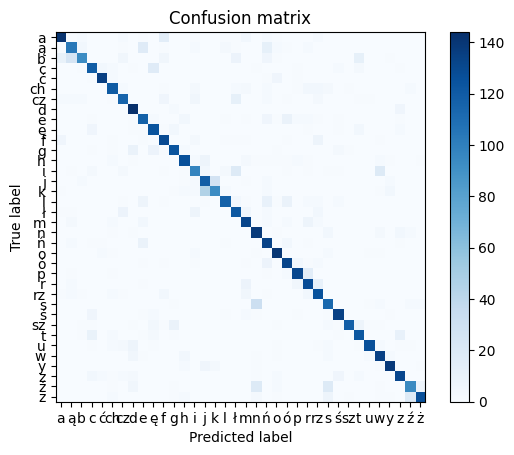

Model: "sequential_115"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_690 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_345 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_691 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_345 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_692 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

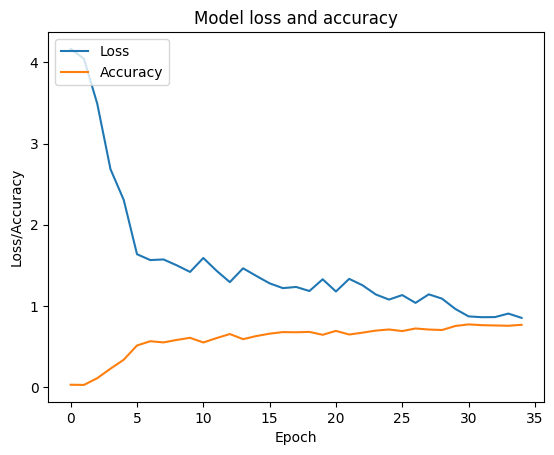

172/172 [==============================] - 6s 35ms/step


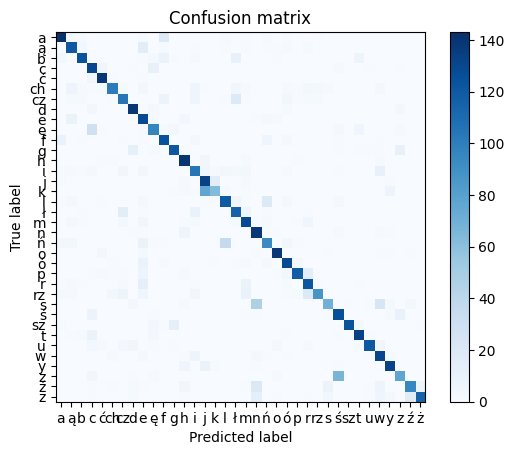

Model: "sequential_116"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_696 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_348 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_697 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_348 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_698 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

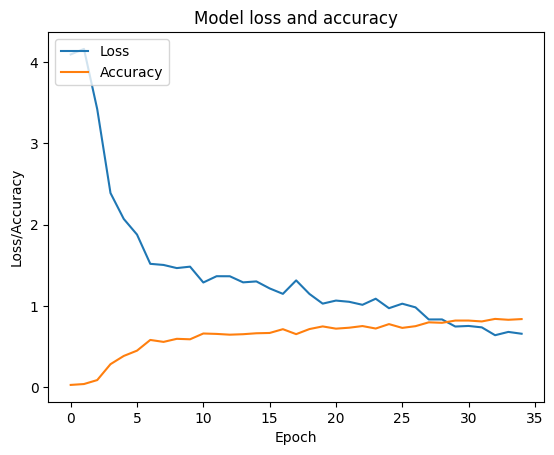

172/172 [==============================] - 7s 36ms/step


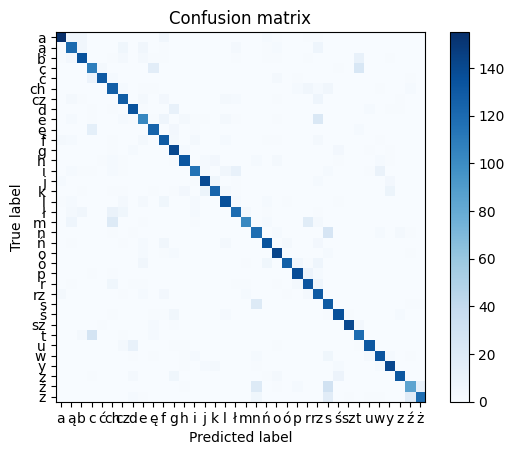

Model: "sequential_117"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_702 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_351 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_703 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_351 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_704 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

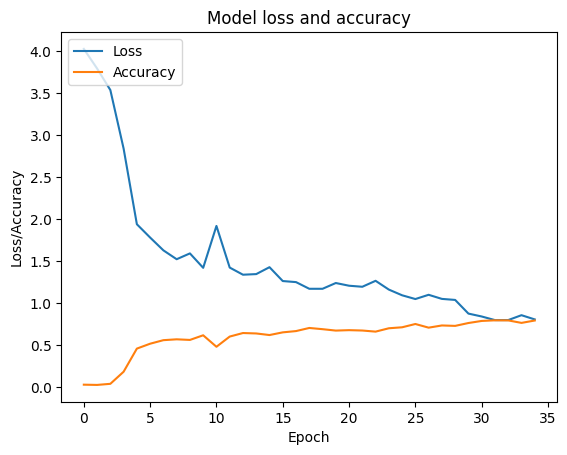

172/172 [==============================] - 7s 37ms/step


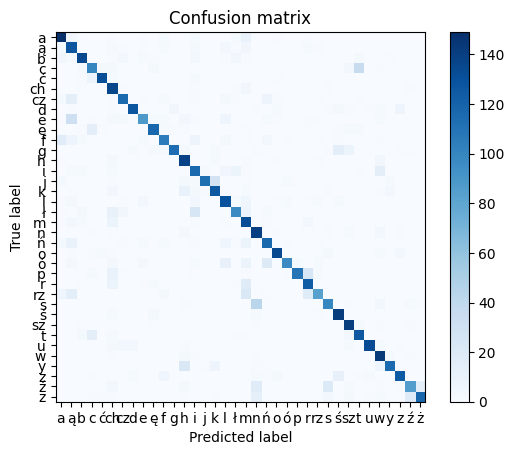

Model: "sequential_118"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_708 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_354 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_709 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_354 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_710 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

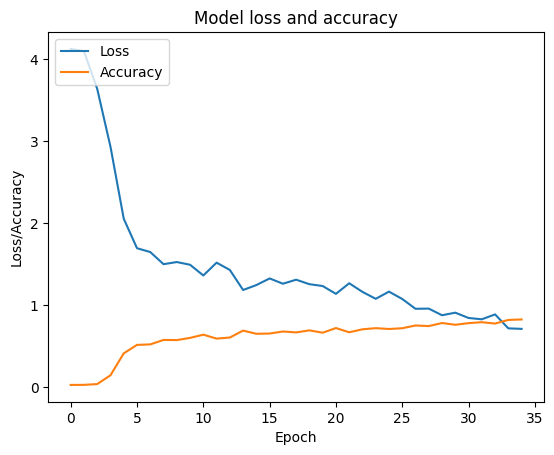

172/172 [==============================] - 7s 39ms/step


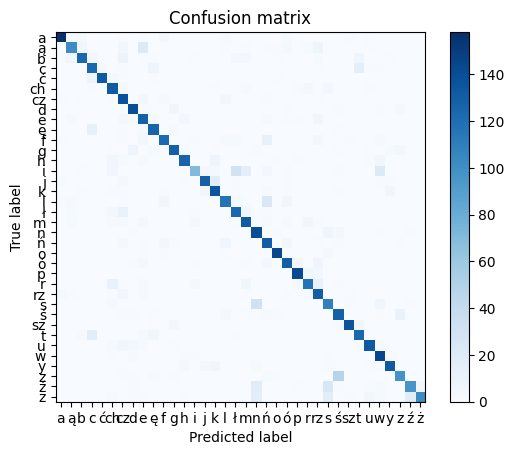

Model: "sequential_119"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_714 (Ba  (None, 75, 9)            36        
 tchNormalization)                                               
                                                                 
 conv1d_357 (Conv1D)         (None, 73, 64)            1792      
                                                                 
 batch_normalization_715 (Ba  (None, 73, 64)           256       
 tchNormalization)                                               
                                                                 
 gru_357 (GRU)               (None, 73, 75)            31725     
                                                                 
 batch_normalization_716 (Ba  (None, 73, 75)           300       
 tchNormalization)                                               
                                                    

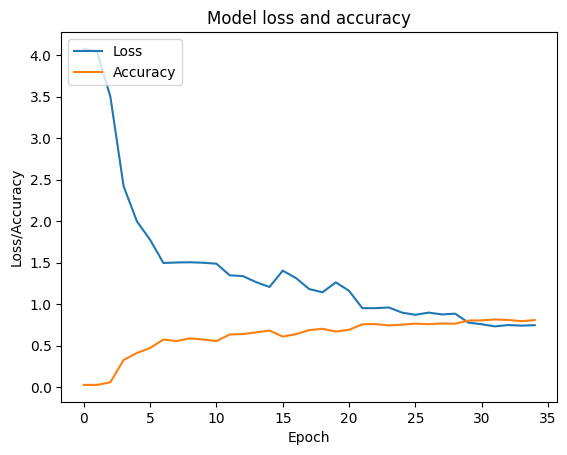

172/172 [==============================] - 6s 34ms/step


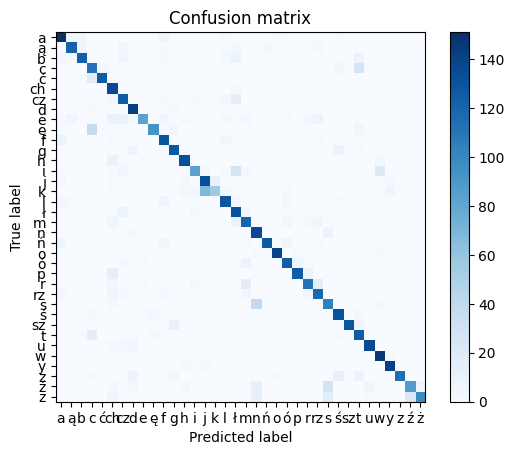

In [6]:
for selected_features in list_combinations:
    
    # droplist = [x for x in ADC_channels if x not in selected_features]
    
    # df.drop(columns =droplist)
    
    x = df[list(selected_features)+IMU_channels].values
    x=x[:num_ts*SAMPLE_SIZE]
    Y_resh = np.reshape(y,(num_ts//SAMPLE_SIZE,SAMPLE_SIZE,1))
    Y = Y_resh[:,1,:]

    #Y_enc = [int.from_bytes(char.encode('utf-8'), byteorder="big") for char in Y ]

    Y_enc = pd.get_dummies(Y.flatten())



    X_resh = np.reshape(x,(num_ts//SAMPLE_SIZE, SAMPLE_SIZE, x.shape[1]))
    X_train, X_test, Y_train, Y_test = train_test_split(X_resh, Y_enc, test_size=0.2, random_state=0, stratify=Y)

    X_test, X_val, Y_test, Y_val = train_test_split(X_test, Y_test, test_size=0.2, random_state=0, stratify=Y_test)
    

    train_dataset = (X_train, Y_train)
    test_dataset = (X_test, Y_test)
    val_dataset = (X_val, Y_val)



    #train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    #test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

    # MODEL CONSTANTS
    LAYERS = np.dot(1,[75, 75, 75])                # number of units in hidden and output layers
    M_TRAIN = X_train.shape[0]                     # number of training examples (2D)
    M_TEST = X_test.shape[0]                       # number of test examples (2D),full=X_test.shape[0]
    N = X_train.shape[2]                           # number of features
    BATCH = M_TRAIN//100                           # batch size
    EPOCH = 35                                    # number of epochs
    LR = 2e-3                          # learning rate of the gradient descent
    LAMBD = 3e-2                         # lambda in L2 regularizaion
    DP = 0.5                           # dropout rate
    RDP = 0                           # recurrent dropout rate

    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

    checkpoint = ModelCheckpoint(filepath=log_dir+'/models/'+'model.{epoch:02d}-{val_categorical_accuracy:.2f}.hdf5',
                                 monitor='val_categorical_accuracy',
                                 verbose=1,
                                 save_best_only=True,
                                 save_weights_only=False,
                                 mode='max')

    lr_decay = ReduceLROnPlateau(monitor='loss',
                                 patience=1, verbose=1,
                                 factor=0.5, min_lr=1e-6)

    early_stop = EarlyStopping(monitor='categorical_accuracy', min_delta=0,
                               patience=7, verbose=1, mode='auto',
                               baseline=0, restore_best_weights=True)

    initial_learning_rate = LR
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate,
        decay_steps=100000,
        decay_rate=0.96,
        staircase=True)

    # MODEL DEFINITION
    model = Sequential()
    model.add(layers.Input(shape=(X_train.shape[1], X_train.shape[2])))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv1D(filters=64, kernel_size=3, activation='sigmoid', input_shape=(75, 1)))
    model.add(layers.BatchNormalization())
    model.add(layers.GRU(units=LAYERS[0],
                          activation='selu', recurrent_activation='hard_sigmoid',
                          kernel_regularizer=l2(LAMBD), recurrent_regularizer=l2(LAMBD),
                          dropout=DP, recurrent_dropout=RDP,
                          return_sequences=True, return_state=False,
                          stateful=False, unroll=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv1D(filters=64, kernel_size=3, activation='sigmoid', input_shape=(75, 1)))
    model.add(layers.BatchNormalization())
    model.add(layers.GRU(units=LAYERS[1],
                          activation='selu', recurrent_activation='hard_sigmoid',
                          kernel_regularizer=l2(LAMBD), recurrent_regularizer=l2(LAMBD),
                          dropout=DP, recurrent_dropout=RDP,
                          return_sequences=True, return_state=False,
                          stateful=False, unroll=False))
    model.add(layers.Conv1D(filters=64, kernel_size=3, activation='sigmoid', input_shape=(75, 1)))
    model.add(layers.BatchNormalization())
    model.add(layers.GRU(units=LAYERS[2],
                          activation='selu', recurrent_activation='hard_sigmoid',
                          kernel_regularizer=l2(LAMBD), recurrent_regularizer=l2(LAMBD),
                          dropout=DP, recurrent_dropout=RDP,
                          return_sequences=False, return_state=False,
                          stateful=False, unroll=False))
    
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(36, activation='softmax'))

    opt = optimizers.Adam(learning_rate=LR,  clipnorm=1.)

    # MODEL COMPILATION
    model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['categorical_accuracy'])

    print(model.summary())
    print(selected_features)

    # CONVERTING & ENCODING LABELS


    # SPLITTING






    # TRAINING
    history = model.fit(X_train, Y_train, epochs=EPOCH, batch_size=BATCH,
                        shuffle=True,validation_data=val_dataset,
                        callbacks=[
                                    early_stop
                                    ,lr_decay
                                    ,checkpoint
                                    ,tensorboard_callback]
                        )


    #@model = load_model('logs/fit/20230111-125954model.82-0.54.hdf5')


    # EVALUATION
    train_loss, train_acc = model.evaluate(X_train, Y_train,
                                           batch_size=M_TRAIN, verbose=0)
    test_loss, test_acc = model.evaluate(X_test[:M_TEST], Y_test[:M_TEST],
                                         batch_size=M_TEST, verbose=0)


    # ACCURACY AND LOSS PLOTS

    print(max(history.history['val_categorical_accuracy']))

    plt.plot(history.history['val_loss'])
    plt.plot(history.history['val_categorical_accuracy'])
    plt.title('Model loss and accuracy')
    plt.ylabel('Loss/Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Loss', 'Accuracy'], loc='upper left')
    plt.show()


    # CONFUSION MATRIX
    oh_dict=dict(zip([i for i in range(num_classes)],list(sign_types_dict.keys())))

    y_pred = model.predict(X_test)
    y_int_pred_class = np.argmax(y_pred, axis=1)
    y_int_test_class = np.argmax(Y_test.values, axis=1)

    y_test_class = [oh_dict[i] for i in y_int_test_class]
    y_pred_class=[oh_dict[i] for i in y_int_pred_class]

    confusion_mat = confusion_matrix(y_test_class, y_pred_class, labels=list(sign_types_dict.keys()))
    plt.imshow(confusion_mat, cmap=plt.cm.Blues)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.xticks([cl for cl in range(num_classes)], sign_types_dict.keys())
    plt.yticks([cl for cl in range(num_classes)], sign_types_dict.keys())
    plt.show()

    
    acc_list.append([max(history.history['val_categorical_accuracy']), selected_features])
    # tf.math.confusion_matrix(Y_test,y_pred)
    # #%%
    # # ROC PLOT
    # fpr = {}
    # tpr = {}
    # roc_auc = {}
    #
    # for i in range(3):
    #     fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_pred[:, i])
    #     roc_auc[i] = auc(fpr[i], tpr[i])
    #
    # plt.figure()
    # for i in range(3):
    #     plt.plot(fpr[i], tpr[i], label='ROC curve for class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))
    # plt.plot([0, 1], [0, 1], 'k--')
    # plt.xlim([0.0, 1.0])
    # plt.ylim([0.0, 1.0])
    # plt.xlabel('False Positive Rate')
    # plt.ylabel('True Positive Rate')
    # plt.title('ROC curves for all classes')
    # plt.legend(loc="lower right")
    # plt.show()